# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

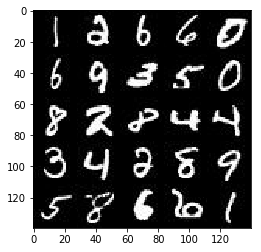

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

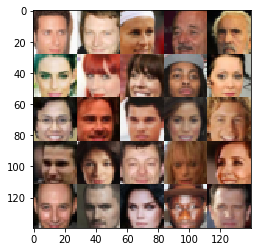

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_size = (image_width, image_height, image_channels)
    inputs_real = tf.placeholder(tf.float32, (None,*real_size), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate_placeholder = tf.placeholder(tf.float32, None, name='learning_rate')
    
    return inputs_real, inputs_z, learning_rate_placeholder


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [6]:
def leaky_relu(data, alpha=0.01):
     return tf.maximum(alpha*data, data)
    
    

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    keep_probability = 0.8 # for dropout
    
    with tf.variable_scope('discriminator', reuse=reuse):
        # input dim is 28 x 28 x num channels (1 for mnist, 3 for faces)
        x1 = tf.layers.conv2d(images,64,5,strides=2, padding='same')
        relu1 = leaky_relu(x1)
        # 14x14x64 
        
        # (after 1st review to try to improve performance) - using dropout with 50% 
        # after batch normalization
        # ref: "CDk denotes a a Convolution-BatchNormDropout-ReLU layer with a dropout rate of 50%"
        # from paper: "Image-to-Image translation with Conditional Adversarial Networks"
        # (guesstimate: skipping dropout in first layer, assuming it might have somewhat similar 
        #  negative effects as batch_normalization() in first layer for gans?)
        # found the paper through https://github.com/soumith/ganhacks
        
        # (after 1st review input) adding additional layer to improve performance.
        # keep same dimensions - strides=1 and padding is same gives zero padding 
        # and keeps dimensions.
        # useful resource: http://cs231n.github.io/convolutional-networks/#layerpat
        x1b = tf.layers.conv2d(relu1,64,5,strides=1, padding='same')
        bn1b = tf.layers.batch_normalization(x1b,training=True)
        dropout1b = tf.nn.dropout(bn1b, keep_probability)
        relu1b = leaky_relu(dropout1b)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1b, 2*64, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        dropout2 = tf.nn.dropout(bn2, keep_probability)
        relu2 = leaky_relu(dropout2)
        # 7x7x128
        
        # same dimension as previous layer, stride=1 (after review input)
        x2b = tf.layers.conv2d(relu2, 2*64, 5, strides=1, padding='same')
        bn2b = tf.layers.batch_normalization(x2b, training=True)
        dropout2b = tf.nn.dropout(bn2b, keep_probability)
        relu2b = leaky_relu(dropout2b)
        # 7x7x128
        
        # flatten
        flat = tf.reshape(relu2b, (-1,7*7*128))
        
        # TODO: Could perhaps try out 1x1 convolutions instead of fully connected (dense) here
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
    

    return (out, logits)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [ ]:
def generator(z, out_channel_dim,is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    
    keep_probability=0.5 # after 1st review, adding dropout, see discriminator
    
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not is_train):
        dense1 = tf.layers.dense(z, 7*7*512)
        reshaped1 = tf.reshape(dense1, (-1,7,7,512))
        bn1 = tf.layers.batch_normalization(reshaped1, training=is_train) 
        relu1 = leaky_relu(bn1)
        # 7x7x512
        
        # after 1st review, strides=1 to keep shape and get more params to train on to
        # perhaps improve generation
        conv1b = tf.layers.conv2d_transpose(relu1, 512, 5, strides=1,padding='same')
        bn1b = tf.layers.batch_normalization(conv1b, training=is_train)
        dropout1b = tf.nn.dropout(bn1b, keep_probability)
        relu1b = leaky_relu(dropout1b)
        # 7x7x512
        
        conv2 = tf.layers.conv2d_transpose(relu1b, 256, 5, strides=2,padding='same')
        bn2 = tf.layers.batch_normalization(conv2, training=is_train)
        dropout2 = tf.nn.dropout(bn2, keep_probability)
        relu2 = leaky_relu(dropout2)
        # 14x14x256
        
        # (after 1st review input) - additional layer to get better generator performance
        # keep dimensions, with strides=1 and padding = 'same' (zero padding)
        # (could perhaps also look into 1x1 convolutions)
        ##conv2b = tf.layers.conv2d_transpose(relu2, 256, 5, strides=1, padding='same')
        ##bn2b = tf.layers.batch_normalization(conv2b, training=is_train)
        ##dropout2b = tf.nn.dropout(bn2b,keep_probability)
        ##relu2b = leaky_relu(dropout2b)
                                            
        # out_channel_dim is 1 for mnist and 3 for faces, i.e. color dim
        logits = tf.layers.conv2d_transpose(relu2, out_channel_dim,5, 
                                            strides=2,padding='same' )
        
        
        # 28x28x output_dim
        out = tf.tanh(logits)
                
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [10]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    # after 1st review, trying to improve generation with 1-sided smoothing
    # from paper "Improved Techniques for training GANs" (Salimans 2016)
    
    smoothing = 0.1
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                               labels = tf.ones_like(d_model_real)*(1-smoothing)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                               labels = tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                               labels = tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [11]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS,scope='discriminator')):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
       
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='generator')):
        g_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [12]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [18]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, 
          get_batches, data_shape, data_image_mode, show_every=100, 
          print_every=10, n_images=16):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    
    print(z_dim)
    print(data_shape)
    (num_images, image_width, image_height, image_channels) = data_shape
    
    input_real, input_z, learning_rate_placeholder = model_inputs(image_width, image_height, image_channels, z_dim)
    
    print("TYPE input_z:", type(input_z))
    # out_channel_dim = image_channels
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    
    # TODO: learning_rate init? 
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    saver = tf.train.Saver() # TODO: perhaps only generator variables 
    samples, losses = [], []
    
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):      
                steps += 1
                # TODO: Train Model
                #print("b", batch_images.shape)
                
                # input data batches has values from -0.5 to 0.5 => scale to -1 to 1
                batch_images *= 2.0
                
                # sample random noise for G
                batch_z = np.random.uniform(-1,1,size=(batch_size, z_dim))
            
                # run discriminator and generator optimizers
                _ = sess.run(d_opt, feed_dict={input_real:batch_images,
                                              input_z:batch_z,
                                              learning_rate_placeholder:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real:batch_images,
                                              input_z:batch_z,
                                              learning_rate_placeholder:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real:batch_images,
                                          input_z:batch_z,
                                      learning_rate_placeholder:learning_rate})
      
                if steps % print_every == 0:
                    # get losses and print them out
                    train_loss_d = sess.run(d_loss, {input_real:batch_images,
                                              input_z:batch_z,
                                              learning_rate_placeholder:learning_rate})
                    train_loss_g = g_loss.eval({input_real:batch_images,
                                              input_z:batch_z,
                                              learning_rate_placeholder:learning_rate})
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))    
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g)) 
            
                if steps % show_every  == 0:
                    print(type(batch_z))
                    show_generator_output(sess, n_images=n_images,
                                         input_z=input_z, out_channel_dim=image_channels,
                                         image_mode=data_image_mode)

    # save training generator samples
    with open('train_samples_pkl','wb') as fh:
        import pickle as pkl
        pkl.dump(samples,fh)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

100
(60000, 28, 28, 1)
TYPE input_z: <class 'tensorflow.python.framework.ops.Tensor'>
Epoch 1/10... Discriminator Loss: 0.7898... Generator Loss: 1.4100
Epoch 1/10... Discriminator Loss: 0.9248... Generator Loss: 1.4073
Epoch 1/10... Discriminator Loss: 0.6117... Generator Loss: 2.7486
Epoch 1/10... Discriminator Loss: 0.4434... Generator Loss: 3.6905
Epoch 1/10... Discriminator Loss: 0.5402... Generator Loss: 7.7872
Epoch 1/10... Discriminator Loss: 0.5079... Generator Loss: 2.5925
Epoch 1/10... Discriminator Loss: 0.4814... Generator Loss: 2.7554
Epoch 1/10... Discriminator Loss: 0.4434... Generator Loss: 3.7208
Epoch 1/10... Discriminator Loss: 0.4459... Generator Loss: 3.3936
Epoch 1/10... Discriminator Loss: 0.7821... Generator Loss: 1.8959
<class 'numpy.ndarray'>


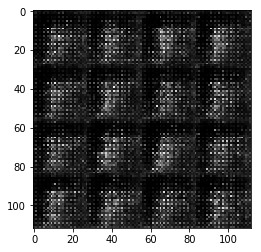

Epoch 1/10... Discriminator Loss: 0.5050... Generator Loss: 3.2135
Epoch 1/10... Discriminator Loss: 0.4630... Generator Loss: 4.3192
Epoch 1/10... Discriminator Loss: 0.6107... Generator Loss: 2.7096
Epoch 1/10... Discriminator Loss: 0.7792... Generator Loss: 1.6712
Epoch 1/10... Discriminator Loss: 0.5060... Generator Loss: 3.3178
Epoch 1/10... Discriminator Loss: 0.6065... Generator Loss: 3.4734
Epoch 1/10... Discriminator Loss: 0.6019... Generator Loss: 3.3148
Epoch 1/10... Discriminator Loss: 0.5333... Generator Loss: 3.5405
Epoch 1/10... Discriminator Loss: 0.7787... Generator Loss: 2.5354
Epoch 1/10... Discriminator Loss: 0.9041... Generator Loss: 2.9869
<class 'numpy.ndarray'>


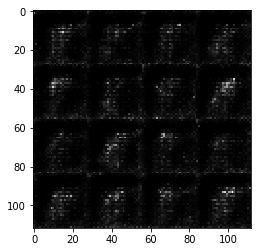

Epoch 1/10... Discriminator Loss: 0.5866... Generator Loss: 3.0327
Epoch 1/10... Discriminator Loss: 0.8357... Generator Loss: 1.5399
Epoch 1/10... Discriminator Loss: 0.8225... Generator Loss: 2.4498
Epoch 1/10... Discriminator Loss: 1.0138... Generator Loss: 1.6428
Epoch 1/10... Discriminator Loss: 0.6071... Generator Loss: 3.1853
Epoch 1/10... Discriminator Loss: 0.6068... Generator Loss: 3.3139
Epoch 1/10... Discriminator Loss: 0.9771... Generator Loss: 1.4135
Epoch 1/10... Discriminator Loss: 0.7451... Generator Loss: 2.1100
Epoch 1/10... Discriminator Loss: 0.9054... Generator Loss: 1.6670
Epoch 1/10... Discriminator Loss: 1.0414... Generator Loss: 4.2236
<class 'numpy.ndarray'>


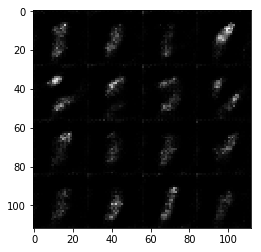

Epoch 1/10... Discriminator Loss: 0.8409... Generator Loss: 2.4685
Epoch 1/10... Discriminator Loss: 0.7700... Generator Loss: 2.0567
Epoch 1/10... Discriminator Loss: 0.9018... Generator Loss: 1.8731
Epoch 1/10... Discriminator Loss: 1.0147... Generator Loss: 1.7868
Epoch 1/10... Discriminator Loss: 0.9207... Generator Loss: 1.6061
Epoch 1/10... Discriminator Loss: 0.8055... Generator Loss: 1.8766
Epoch 1/10... Discriminator Loss: 0.8009... Generator Loss: 1.8568
Epoch 1/10... Discriminator Loss: 0.8270... Generator Loss: 2.0184
Epoch 1/10... Discriminator Loss: 0.9059... Generator Loss: 1.6413
Epoch 1/10... Discriminator Loss: 0.9032... Generator Loss: 1.8657
<class 'numpy.ndarray'>


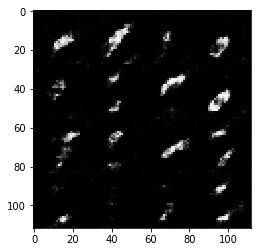

Epoch 1/10... Discriminator Loss: 0.9363... Generator Loss: 1.9327
Epoch 1/10... Discriminator Loss: 0.8697... Generator Loss: 1.8180
Epoch 1/10... Discriminator Loss: 0.9981... Generator Loss: 1.2459
Epoch 1/10... Discriminator Loss: 0.8901... Generator Loss: 2.0448
Epoch 1/10... Discriminator Loss: 1.2029... Generator Loss: 0.8802
Epoch 1/10... Discriminator Loss: 0.8819... Generator Loss: 1.7928
Epoch 2/10... Discriminator Loss: 0.9935... Generator Loss: 2.3695
Epoch 2/10... Discriminator Loss: 0.8843... Generator Loss: 1.4733
Epoch 2/10... Discriminator Loss: 1.3790... Generator Loss: 0.7131
Epoch 2/10... Discriminator Loss: 0.9455... Generator Loss: 1.5771
<class 'numpy.ndarray'>


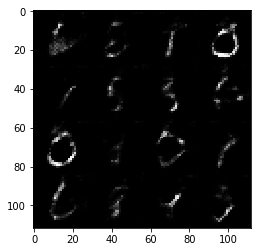

Epoch 2/10... Discriminator Loss: 0.8658... Generator Loss: 1.6237
Epoch 2/10... Discriminator Loss: 0.9025... Generator Loss: 1.8421
Epoch 2/10... Discriminator Loss: 1.1858... Generator Loss: 0.9484
Epoch 2/10... Discriminator Loss: 0.9662... Generator Loss: 2.0025
Epoch 2/10... Discriminator Loss: 1.2009... Generator Loss: 2.5110
Epoch 2/10... Discriminator Loss: 1.0746... Generator Loss: 2.3207
Epoch 2/10... Discriminator Loss: 1.1466... Generator Loss: 2.3664
Epoch 2/10... Discriminator Loss: 1.0785... Generator Loss: 1.8024
Epoch 2/10... Discriminator Loss: 1.0402... Generator Loss: 1.9726
Epoch 2/10... Discriminator Loss: 1.0695... Generator Loss: 1.2632
<class 'numpy.ndarray'>


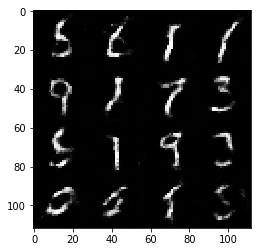

Epoch 2/10... Discriminator Loss: 1.0854... Generator Loss: 1.4399
Epoch 2/10... Discriminator Loss: 1.0219... Generator Loss: 1.2897
Epoch 2/10... Discriminator Loss: 1.2351... Generator Loss: 1.0253
Epoch 2/10... Discriminator Loss: 1.0413... Generator Loss: 1.3711
Epoch 2/10... Discriminator Loss: 1.0999... Generator Loss: 2.0839
Epoch 2/10... Discriminator Loss: 1.0640... Generator Loss: 1.0119
Epoch 2/10... Discriminator Loss: 1.1041... Generator Loss: 1.2516
Epoch 2/10... Discriminator Loss: 1.1596... Generator Loss: 0.9127
Epoch 2/10... Discriminator Loss: 1.0814... Generator Loss: 1.1034
Epoch 2/10... Discriminator Loss: 1.0139... Generator Loss: 1.9438
<class 'numpy.ndarray'>


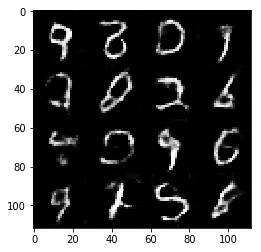

Epoch 2/10... Discriminator Loss: 1.0418... Generator Loss: 1.7197
Epoch 2/10... Discriminator Loss: 1.0367... Generator Loss: 1.2486
Epoch 2/10... Discriminator Loss: 1.2148... Generator Loss: 1.8232
Epoch 2/10... Discriminator Loss: 1.0514... Generator Loss: 1.2080
Epoch 2/10... Discriminator Loss: 1.1598... Generator Loss: 1.7140
Epoch 2/10... Discriminator Loss: 1.1047... Generator Loss: 2.1290
Epoch 2/10... Discriminator Loss: 1.0493... Generator Loss: 1.5554
Epoch 2/10... Discriminator Loss: 1.0099... Generator Loss: 1.5082
Epoch 2/10... Discriminator Loss: 1.3407... Generator Loss: 0.6722
Epoch 2/10... Discriminator Loss: 1.0817... Generator Loss: 1.5358
<class 'numpy.ndarray'>


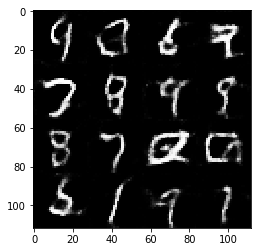

Epoch 2/10... Discriminator Loss: 0.9749... Generator Loss: 1.7449
Epoch 2/10... Discriminator Loss: 1.0565... Generator Loss: 1.2934
Epoch 2/10... Discriminator Loss: 0.9622... Generator Loss: 1.1291
Epoch 2/10... Discriminator Loss: 1.0509... Generator Loss: 1.1316
Epoch 2/10... Discriminator Loss: 0.9914... Generator Loss: 1.4058
Epoch 2/10... Discriminator Loss: 1.1470... Generator Loss: 0.8823
Epoch 2/10... Discriminator Loss: 0.9415... Generator Loss: 1.1144
Epoch 2/10... Discriminator Loss: 0.9671... Generator Loss: 1.7316
Epoch 2/10... Discriminator Loss: 1.1884... Generator Loss: 0.9253
Epoch 2/10... Discriminator Loss: 0.9958... Generator Loss: 1.6529
<class 'numpy.ndarray'>


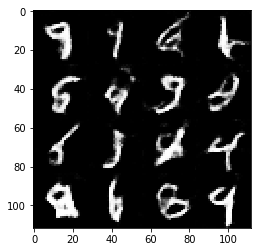

Epoch 2/10... Discriminator Loss: 1.1411... Generator Loss: 1.9598
Epoch 2/10... Discriminator Loss: 1.0508... Generator Loss: 1.2717
Epoch 2/10... Discriminator Loss: 1.3171... Generator Loss: 0.6842
Epoch 3/10... Discriminator Loss: 1.0564... Generator Loss: 1.5895
Epoch 3/10... Discriminator Loss: 1.2726... Generator Loss: 0.8546
Epoch 3/10... Discriminator Loss: 0.9932... Generator Loss: 1.3607
Epoch 3/10... Discriminator Loss: 1.1787... Generator Loss: 0.9634
Epoch 3/10... Discriminator Loss: 1.2378... Generator Loss: 0.8923
Epoch 3/10... Discriminator Loss: 1.2280... Generator Loss: 2.3941
Epoch 3/10... Discriminator Loss: 1.0668... Generator Loss: 1.4453
<class 'numpy.ndarray'>


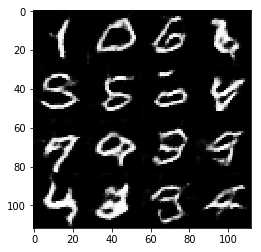

Epoch 3/10... Discriminator Loss: 1.0928... Generator Loss: 1.1475
Epoch 3/10... Discriminator Loss: 0.9851... Generator Loss: 1.5027
Epoch 3/10... Discriminator Loss: 0.9509... Generator Loss: 1.4284
Epoch 3/10... Discriminator Loss: 1.3050... Generator Loss: 0.6921
Epoch 3/10... Discriminator Loss: 1.2211... Generator Loss: 0.7751
Epoch 3/10... Discriminator Loss: 1.5643... Generator Loss: 2.5037
Epoch 3/10... Discriminator Loss: 0.9260... Generator Loss: 1.3171
Epoch 3/10... Discriminator Loss: 1.3414... Generator Loss: 0.6664
Epoch 3/10... Discriminator Loss: 1.1308... Generator Loss: 1.0445
Epoch 3/10... Discriminator Loss: 1.0234... Generator Loss: 1.3751
<class 'numpy.ndarray'>


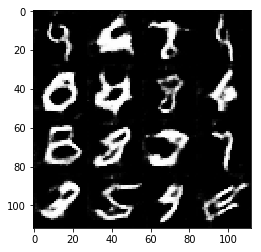

Epoch 3/10... Discriminator Loss: 0.9527... Generator Loss: 1.7501
Epoch 3/10... Discriminator Loss: 0.9615... Generator Loss: 1.3669
Epoch 3/10... Discriminator Loss: 1.2209... Generator Loss: 0.7852
Epoch 3/10... Discriminator Loss: 1.0493... Generator Loss: 1.0873
Epoch 3/10... Discriminator Loss: 1.3519... Generator Loss: 0.7823
Epoch 3/10... Discriminator Loss: 0.9637... Generator Loss: 1.1278
Epoch 3/10... Discriminator Loss: 1.3557... Generator Loss: 0.7005
Epoch 3/10... Discriminator Loss: 0.9777... Generator Loss: 1.1488
Epoch 3/10... Discriminator Loss: 1.2920... Generator Loss: 2.5574
Epoch 3/10... Discriminator Loss: 1.0692... Generator Loss: 1.5712
<class 'numpy.ndarray'>


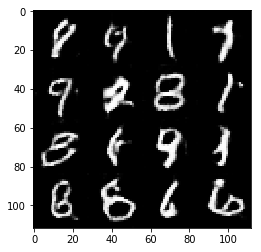

Epoch 3/10... Discriminator Loss: 1.0685... Generator Loss: 0.9741
Epoch 3/10... Discriminator Loss: 0.9266... Generator Loss: 1.3442
Epoch 3/10... Discriminator Loss: 1.2596... Generator Loss: 0.9162
Epoch 3/10... Discriminator Loss: 1.0113... Generator Loss: 1.6301
Epoch 3/10... Discriminator Loss: 1.1337... Generator Loss: 0.8265
Epoch 3/10... Discriminator Loss: 0.9753... Generator Loss: 1.2603
Epoch 3/10... Discriminator Loss: 2.4067... Generator Loss: 3.6002
Epoch 3/10... Discriminator Loss: 1.2473... Generator Loss: 0.9188
Epoch 3/10... Discriminator Loss: 1.1756... Generator Loss: 1.4188
Epoch 3/10... Discriminator Loss: 0.8591... Generator Loss: 1.8163
<class 'numpy.ndarray'>


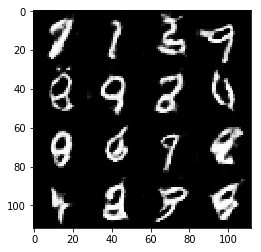

Epoch 3/10... Discriminator Loss: 1.0512... Generator Loss: 1.9399
Epoch 3/10... Discriminator Loss: 1.0333... Generator Loss: 2.1580
Epoch 3/10... Discriminator Loss: 0.8766... Generator Loss: 1.3609
Epoch 3/10... Discriminator Loss: 1.0817... Generator Loss: 2.6072
Epoch 3/10... Discriminator Loss: 1.1365... Generator Loss: 1.3250
Epoch 3/10... Discriminator Loss: 0.9334... Generator Loss: 1.5716
Epoch 3/10... Discriminator Loss: 0.8553... Generator Loss: 1.5081
Epoch 3/10... Discriminator Loss: 0.9210... Generator Loss: 1.3548
Epoch 3/10... Discriminator Loss: 0.9254... Generator Loss: 1.6700
Epoch 3/10... Discriminator Loss: 0.9476... Generator Loss: 1.6308
<class 'numpy.ndarray'>


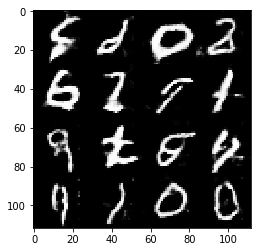

Epoch 4/10... Discriminator Loss: 0.8621... Generator Loss: 1.6992
Epoch 4/10... Discriminator Loss: 0.9403... Generator Loss: 1.2002
Epoch 4/10... Discriminator Loss: 0.9601... Generator Loss: 1.1537
Epoch 4/10... Discriminator Loss: 1.3530... Generator Loss: 0.6286
Epoch 4/10... Discriminator Loss: 0.9353... Generator Loss: 1.4676
Epoch 4/10... Discriminator Loss: 0.8344... Generator Loss: 1.4326
Epoch 4/10... Discriminator Loss: 1.0044... Generator Loss: 2.0140
Epoch 4/10... Discriminator Loss: 0.9019... Generator Loss: 1.6766
Epoch 4/10... Discriminator Loss: 0.8093... Generator Loss: 1.8114
Epoch 4/10... Discriminator Loss: 0.8640... Generator Loss: 1.5416
<class 'numpy.ndarray'>


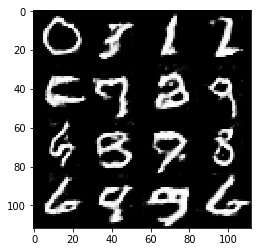

Epoch 4/10... Discriminator Loss: 0.8452... Generator Loss: 1.8119
Epoch 4/10... Discriminator Loss: 1.2642... Generator Loss: 0.7054
Epoch 4/10... Discriminator Loss: 1.0031... Generator Loss: 1.3250
Epoch 4/10... Discriminator Loss: 0.8391... Generator Loss: 2.0461
Epoch 4/10... Discriminator Loss: 0.8731... Generator Loss: 1.9943
Epoch 4/10... Discriminator Loss: 0.9193... Generator Loss: 1.9832
Epoch 4/10... Discriminator Loss: 0.8342... Generator Loss: 1.7372
Epoch 4/10... Discriminator Loss: 0.9150... Generator Loss: 2.1697
Epoch 4/10... Discriminator Loss: 1.2992... Generator Loss: 2.2694
Epoch 4/10... Discriminator Loss: 0.8379... Generator Loss: 2.2479
<class 'numpy.ndarray'>


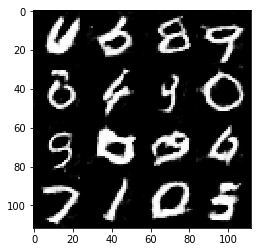

Epoch 4/10... Discriminator Loss: 0.9632... Generator Loss: 1.3651
Epoch 4/10... Discriminator Loss: 0.9690... Generator Loss: 1.1294
Epoch 4/10... Discriminator Loss: 0.8708... Generator Loss: 1.6190
Epoch 4/10... Discriminator Loss: 0.9437... Generator Loss: 1.1036
Epoch 4/10... Discriminator Loss: 1.1795... Generator Loss: 2.5802
Epoch 4/10... Discriminator Loss: 0.9200... Generator Loss: 2.2358
Epoch 4/10... Discriminator Loss: 0.8930... Generator Loss: 1.9693
Epoch 4/10... Discriminator Loss: 0.7933... Generator Loss: 1.9354
Epoch 4/10... Discriminator Loss: 1.0646... Generator Loss: 1.0978
Epoch 4/10... Discriminator Loss: 0.9064... Generator Loss: 1.8129
<class 'numpy.ndarray'>


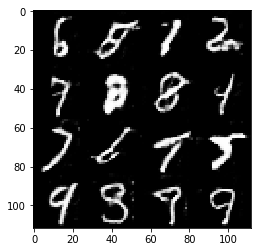

Epoch 4/10... Discriminator Loss: 1.1000... Generator Loss: 0.8887
Epoch 4/10... Discriminator Loss: 0.8404... Generator Loss: 1.7377
Epoch 4/10... Discriminator Loss: 0.8222... Generator Loss: 1.9178
Epoch 4/10... Discriminator Loss: 1.0014... Generator Loss: 2.7101
Epoch 4/10... Discriminator Loss: 0.8106... Generator Loss: 1.7334
Epoch 4/10... Discriminator Loss: 1.2854... Generator Loss: 1.9077
Epoch 4/10... Discriminator Loss: 0.9833... Generator Loss: 1.2670
Epoch 4/10... Discriminator Loss: 0.8390... Generator Loss: 1.7911
Epoch 4/10... Discriminator Loss: 0.8447... Generator Loss: 2.1092
Epoch 4/10... Discriminator Loss: 0.8608... Generator Loss: 2.1468
<class 'numpy.ndarray'>


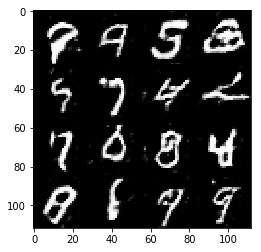

Epoch 4/10... Discriminator Loss: 0.8054... Generator Loss: 1.8383
Epoch 4/10... Discriminator Loss: 0.9193... Generator Loss: 1.1762
Epoch 4/10... Discriminator Loss: 1.4682... Generator Loss: 2.7701
Epoch 4/10... Discriminator Loss: 0.7567... Generator Loss: 1.6089
Epoch 4/10... Discriminator Loss: 0.7174... Generator Loss: 1.9139
Epoch 4/10... Discriminator Loss: 0.9806... Generator Loss: 3.0083
Epoch 4/10... Discriminator Loss: 1.0991... Generator Loss: 1.0617
Epoch 5/10... Discriminator Loss: 1.0555... Generator Loss: 0.9806
Epoch 5/10... Discriminator Loss: 0.7613... Generator Loss: 1.8325
Epoch 5/10... Discriminator Loss: 0.6478... Generator Loss: 2.1360
<class 'numpy.ndarray'>


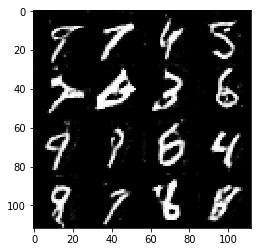

Epoch 5/10... Discriminator Loss: 0.8721... Generator Loss: 2.2505
Epoch 5/10... Discriminator Loss: 0.8810... Generator Loss: 1.3325
Epoch 5/10... Discriminator Loss: 1.1068... Generator Loss: 0.9324
Epoch 5/10... Discriminator Loss: 1.1187... Generator Loss: 1.1940
Epoch 5/10... Discriminator Loss: 0.9056... Generator Loss: 1.9054
Epoch 5/10... Discriminator Loss: 0.7815... Generator Loss: 2.1047
Epoch 5/10... Discriminator Loss: 0.7624... Generator Loss: 1.7556
Epoch 5/10... Discriminator Loss: 0.7519... Generator Loss: 1.9375
Epoch 5/10... Discriminator Loss: 1.0464... Generator Loss: 2.3159
Epoch 5/10... Discriminator Loss: 0.7396... Generator Loss: 1.6104
<class 'numpy.ndarray'>


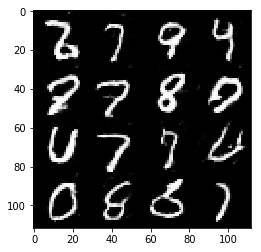

Epoch 5/10... Discriminator Loss: 1.0711... Generator Loss: 2.0532
Epoch 5/10... Discriminator Loss: 0.7719... Generator Loss: 1.5566
Epoch 5/10... Discriminator Loss: 1.4837... Generator Loss: 3.1311
Epoch 5/10... Discriminator Loss: 0.9351... Generator Loss: 1.7150
Epoch 5/10... Discriminator Loss: 0.7887... Generator Loss: 1.7860
Epoch 5/10... Discriminator Loss: 0.8877... Generator Loss: 1.3246
Epoch 5/10... Discriminator Loss: 0.9260... Generator Loss: 2.7688
Epoch 5/10... Discriminator Loss: 0.6911... Generator Loss: 2.0888
Epoch 5/10... Discriminator Loss: 0.7837... Generator Loss: 1.7966
Epoch 5/10... Discriminator Loss: 0.8011... Generator Loss: 1.3649
<class 'numpy.ndarray'>


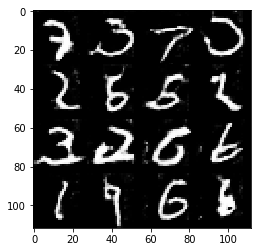

Epoch 5/10... Discriminator Loss: 0.6757... Generator Loss: 1.9475
Epoch 5/10... Discriminator Loss: 0.7724... Generator Loss: 2.6399
Epoch 5/10... Discriminator Loss: 0.7194... Generator Loss: 1.8068
Epoch 5/10... Discriminator Loss: 0.6442... Generator Loss: 1.5593
Epoch 5/10... Discriminator Loss: 0.6675... Generator Loss: 1.7480
Epoch 5/10... Discriminator Loss: 2.1601... Generator Loss: 0.3928
Epoch 5/10... Discriminator Loss: 0.9659... Generator Loss: 2.4962
Epoch 5/10... Discriminator Loss: 1.0518... Generator Loss: 0.9056
Epoch 5/10... Discriminator Loss: 0.7344... Generator Loss: 1.4986
Epoch 5/10... Discriminator Loss: 0.6842... Generator Loss: 2.1906
<class 'numpy.ndarray'>


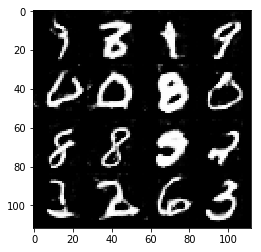

Epoch 5/10... Discriminator Loss: 0.7818... Generator Loss: 1.9704
Epoch 5/10... Discriminator Loss: 1.0325... Generator Loss: 3.3302
Epoch 5/10... Discriminator Loss: 0.7612... Generator Loss: 1.6867
Epoch 5/10... Discriminator Loss: 0.7246... Generator Loss: 1.7345
Epoch 5/10... Discriminator Loss: 1.2922... Generator Loss: 3.6254
Epoch 5/10... Discriminator Loss: 1.2868... Generator Loss: 1.3617
Epoch 5/10... Discriminator Loss: 0.8236... Generator Loss: 1.4346
Epoch 5/10... Discriminator Loss: 0.8107... Generator Loss: 1.5285
Epoch 5/10... Discriminator Loss: 0.6911... Generator Loss: 1.5274
Epoch 5/10... Discriminator Loss: 1.9824... Generator Loss: 3.9360
<class 'numpy.ndarray'>


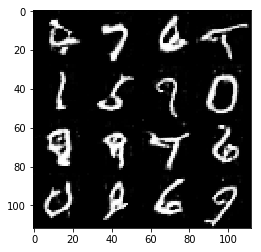

Epoch 5/10... Discriminator Loss: 0.9168... Generator Loss: 1.4528
Epoch 5/10... Discriminator Loss: 0.7492... Generator Loss: 2.3163
Epoch 5/10... Discriminator Loss: 0.6996... Generator Loss: 2.3802
Epoch 5/10... Discriminator Loss: 0.6936... Generator Loss: 1.9529
Epoch 6/10... Discriminator Loss: 0.7582... Generator Loss: 1.7837
Epoch 6/10... Discriminator Loss: 0.6677... Generator Loss: 2.0039
Epoch 6/10... Discriminator Loss: 0.8143... Generator Loss: 2.1284
Epoch 6/10... Discriminator Loss: 0.7663... Generator Loss: 2.0472
Epoch 6/10... Discriminator Loss: 0.6718... Generator Loss: 2.1669
Epoch 6/10... Discriminator Loss: 0.6974... Generator Loss: 1.7931
<class 'numpy.ndarray'>


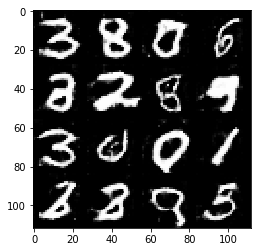

Epoch 6/10... Discriminator Loss: 0.6551... Generator Loss: 2.7875
Epoch 6/10... Discriminator Loss: 1.0469... Generator Loss: 1.1438
Epoch 6/10... Discriminator Loss: 0.8796... Generator Loss: 1.3159
Epoch 6/10... Discriminator Loss: 0.6587... Generator Loss: 2.0363
Epoch 6/10... Discriminator Loss: 0.6673... Generator Loss: 2.0255
Epoch 6/10... Discriminator Loss: 0.6435... Generator Loss: 1.9021
Epoch 6/10... Discriminator Loss: 0.6050... Generator Loss: 2.0355
Epoch 6/10... Discriminator Loss: 0.8493... Generator Loss: 3.0125
Epoch 6/10... Discriminator Loss: 0.8877... Generator Loss: 1.3466
Epoch 6/10... Discriminator Loss: 0.7693... Generator Loss: 1.8647
<class 'numpy.ndarray'>


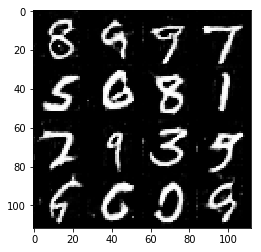

Epoch 6/10... Discriminator Loss: 0.7242... Generator Loss: 1.7433
Epoch 6/10... Discriminator Loss: 0.6728... Generator Loss: 2.1618
Epoch 6/10... Discriminator Loss: 0.8638... Generator Loss: 2.0238
Epoch 6/10... Discriminator Loss: 0.7081... Generator Loss: 2.4846
Epoch 6/10... Discriminator Loss: 0.8313... Generator Loss: 1.4841
Epoch 6/10... Discriminator Loss: 0.6633... Generator Loss: 2.0721
Epoch 6/10... Discriminator Loss: 0.6174... Generator Loss: 1.7260
Epoch 6/10... Discriminator Loss: 1.3973... Generator Loss: 0.8503
Epoch 6/10... Discriminator Loss: 0.7872... Generator Loss: 1.8741
Epoch 6/10... Discriminator Loss: 0.6487... Generator Loss: 1.6963
<class 'numpy.ndarray'>


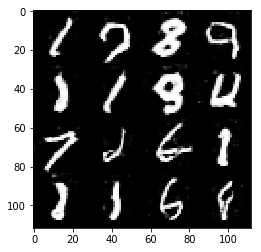

Epoch 6/10... Discriminator Loss: 0.6596... Generator Loss: 2.6424
Epoch 6/10... Discriminator Loss: 1.0822... Generator Loss: 3.6289
Epoch 6/10... Discriminator Loss: 0.7862... Generator Loss: 1.5284
Epoch 6/10... Discriminator Loss: 0.6864... Generator Loss: 2.3964
Epoch 6/10... Discriminator Loss: 1.8118... Generator Loss: 3.6279
Epoch 6/10... Discriminator Loss: 1.1313... Generator Loss: 2.1471
Epoch 6/10... Discriminator Loss: 0.6516... Generator Loss: 1.9439
Epoch 6/10... Discriminator Loss: 0.6174... Generator Loss: 2.3888
Epoch 6/10... Discriminator Loss: 0.7554... Generator Loss: 1.5605
Epoch 6/10... Discriminator Loss: 0.6908... Generator Loss: 1.9167
<class 'numpy.ndarray'>


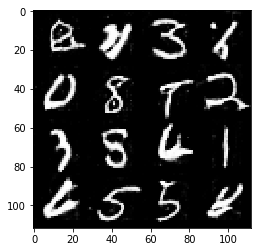

Epoch 6/10... Discriminator Loss: 0.6254... Generator Loss: 2.3365
Epoch 6/10... Discriminator Loss: 0.7063... Generator Loss: 1.9580
Epoch 6/10... Discriminator Loss: 0.7044... Generator Loss: 1.7873
Epoch 6/10... Discriminator Loss: 0.7425... Generator Loss: 2.0546
Epoch 6/10... Discriminator Loss: 0.6566... Generator Loss: 2.1817
Epoch 6/10... Discriminator Loss: 0.7862... Generator Loss: 1.4660
Epoch 6/10... Discriminator Loss: 0.6421... Generator Loss: 2.1009
Epoch 6/10... Discriminator Loss: 0.6693... Generator Loss: 1.7573
Epoch 6/10... Discriminator Loss: 0.8645... Generator Loss: 2.5169
Epoch 6/10... Discriminator Loss: 1.9265... Generator Loss: 3.7353
<class 'numpy.ndarray'>


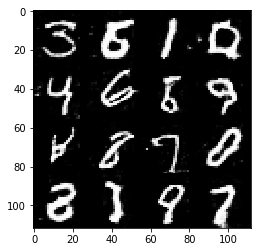

Epoch 7/10... Discriminator Loss: 0.8496... Generator Loss: 1.3841
Epoch 7/10... Discriminator Loss: 0.6198... Generator Loss: 1.9785
Epoch 7/10... Discriminator Loss: 0.7130... Generator Loss: 1.9399
Epoch 7/10... Discriminator Loss: 0.5962... Generator Loss: 2.3116
Epoch 7/10... Discriminator Loss: 0.6910... Generator Loss: 2.3200
Epoch 7/10... Discriminator Loss: 0.6403... Generator Loss: 2.0641
Epoch 7/10... Discriminator Loss: 0.6894... Generator Loss: 2.3946
Epoch 7/10... Discriminator Loss: 0.7366... Generator Loss: 3.4257
Epoch 7/10... Discriminator Loss: 1.0316... Generator Loss: 1.8783
Epoch 7/10... Discriminator Loss: 0.6846... Generator Loss: 2.2497
<class 'numpy.ndarray'>


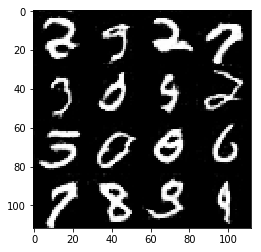

Epoch 7/10... Discriminator Loss: 0.6396... Generator Loss: 2.8974
Epoch 7/10... Discriminator Loss: 1.7698... Generator Loss: 3.9733
Epoch 7/10... Discriminator Loss: 0.8953... Generator Loss: 1.3530
Epoch 7/10... Discriminator Loss: 0.6498... Generator Loss: 2.5805
Epoch 7/10... Discriminator Loss: 1.0423... Generator Loss: 0.9046
Epoch 7/10... Discriminator Loss: 0.7246... Generator Loss: 2.4976
Epoch 7/10... Discriminator Loss: 0.7424... Generator Loss: 2.2025
Epoch 7/10... Discriminator Loss: 0.5739... Generator Loss: 2.3820
Epoch 7/10... Discriminator Loss: 0.6503... Generator Loss: 1.9314
Epoch 7/10... Discriminator Loss: 0.8263... Generator Loss: 1.3337
<class 'numpy.ndarray'>


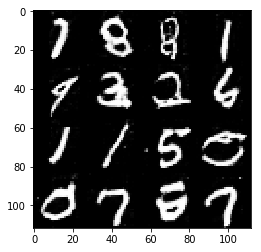

Epoch 7/10... Discriminator Loss: 0.6897... Generator Loss: 2.5837
Epoch 7/10... Discriminator Loss: 0.6584... Generator Loss: 2.1043
Epoch 7/10... Discriminator Loss: 0.6846... Generator Loss: 2.3036
Epoch 7/10... Discriminator Loss: 0.6751... Generator Loss: 1.5027
Epoch 7/10... Discriminator Loss: 0.5786... Generator Loss: 2.5879
Epoch 7/10... Discriminator Loss: 0.5895... Generator Loss: 2.3320
Epoch 7/10... Discriminator Loss: 0.5834... Generator Loss: 2.3467
Epoch 7/10... Discriminator Loss: 0.5590... Generator Loss: 2.6048
Epoch 7/10... Discriminator Loss: 1.5625... Generator Loss: 3.5629
Epoch 7/10... Discriminator Loss: 0.7005... Generator Loss: 2.0032
<class 'numpy.ndarray'>


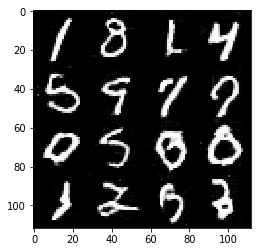

Epoch 7/10... Discriminator Loss: 0.5862... Generator Loss: 2.9293
Epoch 7/10... Discriminator Loss: 0.8577... Generator Loss: 1.3807
Epoch 7/10... Discriminator Loss: 0.6055... Generator Loss: 2.0719
Epoch 7/10... Discriminator Loss: 0.6043... Generator Loss: 2.5400
Epoch 7/10... Discriminator Loss: 0.5379... Generator Loss: 2.4023
Epoch 7/10... Discriminator Loss: 0.5166... Generator Loss: 2.8528
Epoch 7/10... Discriminator Loss: 0.5657... Generator Loss: 2.9998
Epoch 7/10... Discriminator Loss: 0.6850... Generator Loss: 1.2898
Epoch 7/10... Discriminator Loss: 0.6094... Generator Loss: 2.8433
Epoch 7/10... Discriminator Loss: 0.7629... Generator Loss: 1.4732
<class 'numpy.ndarray'>


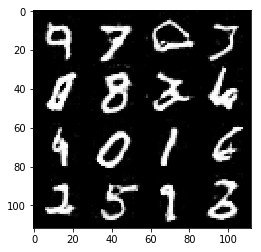

Epoch 7/10... Discriminator Loss: 0.5649... Generator Loss: 2.2344
Epoch 7/10... Discriminator Loss: 0.8354... Generator Loss: 1.8265
Epoch 7/10... Discriminator Loss: 0.6244... Generator Loss: 3.4316
Epoch 7/10... Discriminator Loss: 0.6258... Generator Loss: 2.3530
Epoch 7/10... Discriminator Loss: 0.6136... Generator Loss: 2.6328
Epoch 7/10... Discriminator Loss: 0.5576... Generator Loss: 2.6468
Epoch 7/10... Discriminator Loss: 0.6297... Generator Loss: 1.9702
Epoch 8/10... Discriminator Loss: 0.8574... Generator Loss: 3.3572
Epoch 8/10... Discriminator Loss: 0.6219... Generator Loss: 2.4973
Epoch 8/10... Discriminator Loss: 0.6402... Generator Loss: 2.1226
<class 'numpy.ndarray'>


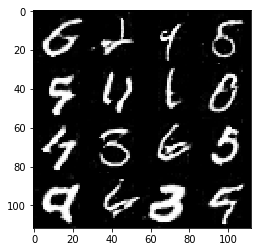

Epoch 8/10... Discriminator Loss: 0.6320... Generator Loss: 2.1080
Epoch 8/10... Discriminator Loss: 0.7889... Generator Loss: 1.5015
Epoch 8/10... Discriminator Loss: 0.5412... Generator Loss: 1.9790
Epoch 8/10... Discriminator Loss: 0.5337... Generator Loss: 2.1866
Epoch 8/10... Discriminator Loss: 0.5682... Generator Loss: 1.4712
Epoch 8/10... Discriminator Loss: 1.4855... Generator Loss: 0.7754
Epoch 8/10... Discriminator Loss: 1.1052... Generator Loss: 0.9794
Epoch 8/10... Discriminator Loss: 0.6675... Generator Loss: 1.8534
Epoch 8/10... Discriminator Loss: 0.7559... Generator Loss: 1.8541
Epoch 8/10... Discriminator Loss: 0.7005... Generator Loss: 1.4110
<class 'numpy.ndarray'>


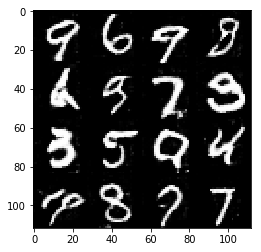

Epoch 8/10... Discriminator Loss: 0.5879... Generator Loss: 2.3649


KeyboardInterrupt: 

In [14]:
batch_size = 128
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

100
(202599, 28, 28, 3)
TYPE input_z: <class 'tensorflow.python.framework.ops.Tensor'>
Epoch 1/10... Discriminator Loss: 0.8388... Generator Loss: 1.3875
Epoch 1/10... Discriminator Loss: 1.4699... Generator Loss: 0.7729
Epoch 1/10... Discriminator Loss: 1.9020... Generator Loss: 3.0144
Epoch 1/10... Discriminator Loss: 1.7221... Generator Loss: 0.6103
Epoch 1/10... Discriminator Loss: 0.7443... Generator Loss: 2.3414
Epoch 1/10... Discriminator Loss: 0.9485... Generator Loss: 2.0394
Epoch 1/10... Discriminator Loss: 0.6468... Generator Loss: 2.4836
Epoch 1/10... Discriminator Loss: 1.0421... Generator Loss: 1.4823
Epoch 1/10... Discriminator Loss: 1.3238... Generator Loss: 0.9932
Epoch 1/10... Discriminator Loss: 0.7679... Generator Loss: 1.8865
<class 'numpy.ndarray'>


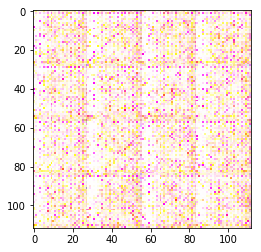

Epoch 1/10... Discriminator Loss: 1.5684... Generator Loss: 0.6407
Epoch 1/10... Discriminator Loss: 0.9766... Generator Loss: 1.4700
Epoch 1/10... Discriminator Loss: 0.8719... Generator Loss: 3.2978
Epoch 1/10... Discriminator Loss: 0.6409... Generator Loss: 2.1814
Epoch 1/10... Discriminator Loss: 1.1368... Generator Loss: 0.9878
Epoch 1/10... Discriminator Loss: 0.5570... Generator Loss: 2.9142
Epoch 1/10... Discriminator Loss: 0.5460... Generator Loss: 2.5283
Epoch 1/10... Discriminator Loss: 0.5928... Generator Loss: 2.0665
Epoch 1/10... Discriminator Loss: 0.5209... Generator Loss: 2.3522
Epoch 1/10... Discriminator Loss: 0.7864... Generator Loss: 1.3843
<class 'numpy.ndarray'>


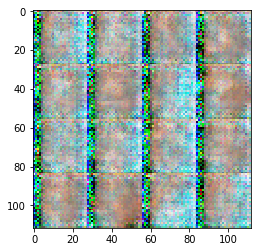

Epoch 1/10... Discriminator Loss: 1.0781... Generator Loss: 1.3830
Epoch 1/10... Discriminator Loss: 1.6711... Generator Loss: 0.6067
Epoch 1/10... Discriminator Loss: 1.1443... Generator Loss: 1.0013
Epoch 1/10... Discriminator Loss: 1.4985... Generator Loss: 1.0283
Epoch 1/10... Discriminator Loss: 1.2114... Generator Loss: 1.4837
Epoch 1/10... Discriminator Loss: 1.7048... Generator Loss: 2.4736
Epoch 1/10... Discriminator Loss: 1.3652... Generator Loss: 0.6968
Epoch 1/10... Discriminator Loss: 1.3980... Generator Loss: 1.1559
Epoch 1/10... Discriminator Loss: 1.6447... Generator Loss: 0.5548
Epoch 1/10... Discriminator Loss: 1.3630... Generator Loss: 0.9260
<class 'numpy.ndarray'>


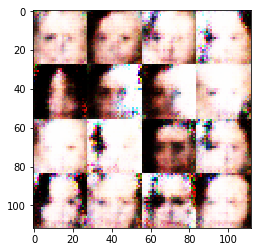

Epoch 1/10... Discriminator Loss: 1.7811... Generator Loss: 0.4675
Epoch 1/10... Discriminator Loss: 1.4704... Generator Loss: 0.8741
Epoch 1/10... Discriminator Loss: 1.1841... Generator Loss: 1.2179
Epoch 1/10... Discriminator Loss: 1.4909... Generator Loss: 0.9953
Epoch 1/10... Discriminator Loss: 1.2375... Generator Loss: 1.0918
Epoch 1/10... Discriminator Loss: 1.2080... Generator Loss: 0.8141
Epoch 1/10... Discriminator Loss: 1.5495... Generator Loss: 0.9205
Epoch 1/10... Discriminator Loss: 1.6744... Generator Loss: 0.7954
Epoch 1/10... Discriminator Loss: 1.6253... Generator Loss: 1.1194
Epoch 1/10... Discriminator Loss: 1.6078... Generator Loss: 0.7193
<class 'numpy.ndarray'>


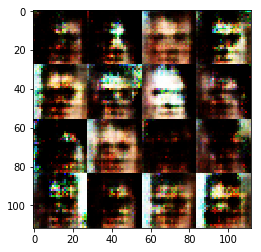

Epoch 1/10... Discriminator Loss: 1.4137... Generator Loss: 0.8781
Epoch 1/10... Discriminator Loss: 1.4642... Generator Loss: 0.6824
Epoch 1/10... Discriminator Loss: 1.3708... Generator Loss: 0.8998
Epoch 1/10... Discriminator Loss: 1.5938... Generator Loss: 0.7261
Epoch 1/10... Discriminator Loss: 1.5099... Generator Loss: 1.0864
Epoch 1/10... Discriminator Loss: 1.4954... Generator Loss: 0.7584
Epoch 1/10... Discriminator Loss: 1.5035... Generator Loss: 1.0753
Epoch 1/10... Discriminator Loss: 1.3885... Generator Loss: 1.2660
Epoch 1/10... Discriminator Loss: 1.5213... Generator Loss: 0.9395
Epoch 1/10... Discriminator Loss: 1.4752... Generator Loss: 0.8711
<class 'numpy.ndarray'>


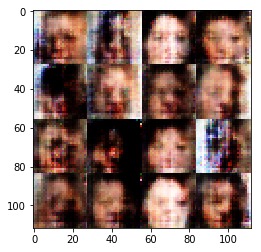

Epoch 1/10... Discriminator Loss: 1.2726... Generator Loss: 1.0172
Epoch 1/10... Discriminator Loss: 1.3502... Generator Loss: 0.9355
Epoch 1/10... Discriminator Loss: 1.4864... Generator Loss: 0.6530
Epoch 1/10... Discriminator Loss: 1.5462... Generator Loss: 0.8073
Epoch 1/10... Discriminator Loss: 1.3629... Generator Loss: 1.2369
Epoch 1/10... Discriminator Loss: 1.5207... Generator Loss: 0.8881
Epoch 1/10... Discriminator Loss: 1.5785... Generator Loss: 0.7787
Epoch 1/10... Discriminator Loss: 1.3609... Generator Loss: 0.8623
Epoch 1/10... Discriminator Loss: 1.3535... Generator Loss: 0.8503
Epoch 1/10... Discriminator Loss: 1.4421... Generator Loss: 0.9040
<class 'numpy.ndarray'>


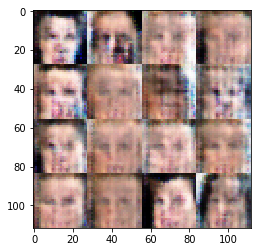

Epoch 1/10... Discriminator Loss: 1.4847... Generator Loss: 0.8778
Epoch 1/10... Discriminator Loss: 1.4448... Generator Loss: 0.7800
Epoch 1/10... Discriminator Loss: 1.5416... Generator Loss: 0.8988
Epoch 1/10... Discriminator Loss: 1.4612... Generator Loss: 0.8850
Epoch 1/10... Discriminator Loss: 1.4806... Generator Loss: 0.8133
Epoch 1/10... Discriminator Loss: 1.3655... Generator Loss: 0.8917
Epoch 1/10... Discriminator Loss: 1.5406... Generator Loss: 0.8442
Epoch 1/10... Discriminator Loss: 1.4921... Generator Loss: 0.9066
Epoch 1/10... Discriminator Loss: 1.3710... Generator Loss: 0.8366
Epoch 1/10... Discriminator Loss: 1.4967... Generator Loss: 0.9339
<class 'numpy.ndarray'>


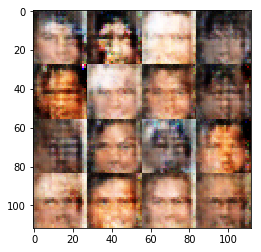

Epoch 1/10... Discriminator Loss: 1.4519... Generator Loss: 0.8622
Epoch 1/10... Discriminator Loss: 1.4774... Generator Loss: 0.9597
Epoch 1/10... Discriminator Loss: 1.3521... Generator Loss: 0.9272
Epoch 1/10... Discriminator Loss: 1.3945... Generator Loss: 0.7921
Epoch 1/10... Discriminator Loss: 1.4425... Generator Loss: 0.7512
Epoch 1/10... Discriminator Loss: 1.3431... Generator Loss: 0.9024
Epoch 1/10... Discriminator Loss: 1.4722... Generator Loss: 0.8262
Epoch 1/10... Discriminator Loss: 1.4203... Generator Loss: 0.9506
Epoch 1/10... Discriminator Loss: 1.3682... Generator Loss: 0.9800
Epoch 1/10... Discriminator Loss: 1.4566... Generator Loss: 0.6365
<class 'numpy.ndarray'>


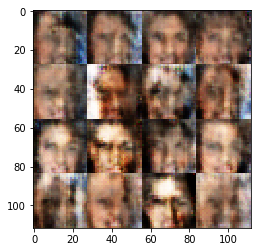

Epoch 1/10... Discriminator Loss: 1.5219... Generator Loss: 0.7991
Epoch 1/10... Discriminator Loss: 1.3780... Generator Loss: 0.9149
Epoch 1/10... Discriminator Loss: 1.4334... Generator Loss: 0.7805
Epoch 1/10... Discriminator Loss: 1.3926... Generator Loss: 0.7551
Epoch 1/10... Discriminator Loss: 1.5356... Generator Loss: 0.7343
Epoch 1/10... Discriminator Loss: 1.4755... Generator Loss: 0.7404
Epoch 1/10... Discriminator Loss: 1.4423... Generator Loss: 0.9000
Epoch 1/10... Discriminator Loss: 1.4233... Generator Loss: 0.6883
Epoch 1/10... Discriminator Loss: 1.3424... Generator Loss: 0.8005
Epoch 1/10... Discriminator Loss: 1.3564... Generator Loss: 0.9858
<class 'numpy.ndarray'>


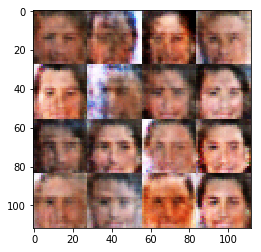

Epoch 1/10... Discriminator Loss: 1.3835... Generator Loss: 0.8219
Epoch 1/10... Discriminator Loss: 1.4619... Generator Loss: 0.7345
Epoch 1/10... Discriminator Loss: 1.4363... Generator Loss: 0.9137
Epoch 1/10... Discriminator Loss: 1.5190... Generator Loss: 0.6904
Epoch 1/10... Discriminator Loss: 1.3810... Generator Loss: 0.7875
Epoch 1/10... Discriminator Loss: 1.3772... Generator Loss: 0.8559
Epoch 1/10... Discriminator Loss: 1.3978... Generator Loss: 0.9368
Epoch 1/10... Discriminator Loss: 1.3512... Generator Loss: 0.8500
Epoch 1/10... Discriminator Loss: 1.4338... Generator Loss: 0.7017
Epoch 1/10... Discriminator Loss: 1.4173... Generator Loss: 0.8893
<class 'numpy.ndarray'>


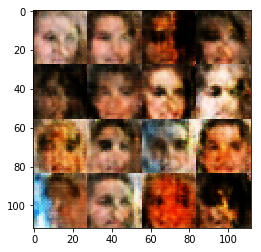

Epoch 1/10... Discriminator Loss: 1.3385... Generator Loss: 0.9054
Epoch 1/10... Discriminator Loss: 1.4399... Generator Loss: 1.1198
Epoch 1/10... Discriminator Loss: 1.5078... Generator Loss: 1.0934
Epoch 1/10... Discriminator Loss: 1.3470... Generator Loss: 0.7750
Epoch 1/10... Discriminator Loss: 1.4639... Generator Loss: 0.7309
Epoch 1/10... Discriminator Loss: 1.4278... Generator Loss: 0.8830
Epoch 1/10... Discriminator Loss: 1.3518... Generator Loss: 0.7783
Epoch 1/10... Discriminator Loss: 1.5333... Generator Loss: 0.6535
Epoch 1/10... Discriminator Loss: 1.3162... Generator Loss: 0.7549
Epoch 1/10... Discriminator Loss: 1.3112... Generator Loss: 0.8757
<class 'numpy.ndarray'>


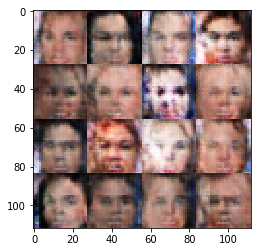

Epoch 1/10... Discriminator Loss: 1.3753... Generator Loss: 0.7983
Epoch 1/10... Discriminator Loss: 1.3206... Generator Loss: 0.8509
Epoch 1/10... Discriminator Loss: 1.5115... Generator Loss: 0.6903
Epoch 1/10... Discriminator Loss: 1.3840... Generator Loss: 0.8163
Epoch 1/10... Discriminator Loss: 1.3579... Generator Loss: 0.8541
Epoch 1/10... Discriminator Loss: 1.4337... Generator Loss: 0.8056
Epoch 1/10... Discriminator Loss: 1.5179... Generator Loss: 0.8240
Epoch 1/10... Discriminator Loss: 1.3589... Generator Loss: 0.8116
Epoch 1/10... Discriminator Loss: 1.4618... Generator Loss: 0.9119
Epoch 1/10... Discriminator Loss: 1.4112... Generator Loss: 0.8665
<class 'numpy.ndarray'>


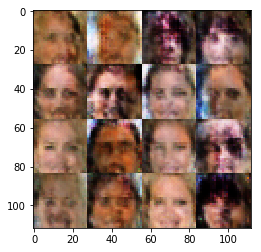

Epoch 1/10... Discriminator Loss: 1.3847... Generator Loss: 0.9306
Epoch 1/10... Discriminator Loss: 1.3984... Generator Loss: 0.8639
Epoch 1/10... Discriminator Loss: 1.4452... Generator Loss: 0.7270
Epoch 1/10... Discriminator Loss: 1.3686... Generator Loss: 0.7058
Epoch 1/10... Discriminator Loss: 1.4797... Generator Loss: 0.7829
Epoch 1/10... Discriminator Loss: 1.2875... Generator Loss: 0.9267
Epoch 1/10... Discriminator Loss: 1.5043... Generator Loss: 0.6613
Epoch 1/10... Discriminator Loss: 1.3620... Generator Loss: 0.7723
Epoch 1/10... Discriminator Loss: 1.4321... Generator Loss: 0.8861
Epoch 1/10... Discriminator Loss: 1.4116... Generator Loss: 1.0389
<class 'numpy.ndarray'>


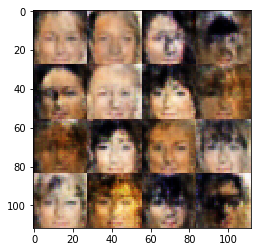

Epoch 1/10... Discriminator Loss: 1.4346... Generator Loss: 0.8666
Epoch 1/10... Discriminator Loss: 1.3895... Generator Loss: 0.9524
Epoch 1/10... Discriminator Loss: 1.4284... Generator Loss: 0.7593
Epoch 1/10... Discriminator Loss: 1.3755... Generator Loss: 0.8064
Epoch 1/10... Discriminator Loss: 1.3672... Generator Loss: 0.8852
Epoch 1/10... Discriminator Loss: 1.4802... Generator Loss: 0.6342
Epoch 1/10... Discriminator Loss: 1.2794... Generator Loss: 0.8244
Epoch 1/10... Discriminator Loss: 1.3949... Generator Loss: 0.8006
Epoch 1/10... Discriminator Loss: 1.4147... Generator Loss: 0.9637
Epoch 1/10... Discriminator Loss: 1.3832... Generator Loss: 0.7585
<class 'numpy.ndarray'>


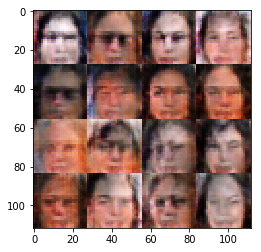

Epoch 1/10... Discriminator Loss: 1.4941... Generator Loss: 0.6744
Epoch 1/10... Discriminator Loss: 1.4396... Generator Loss: 0.6242
Epoch 1/10... Discriminator Loss: 1.4293... Generator Loss: 0.6586
Epoch 1/10... Discriminator Loss: 1.2987... Generator Loss: 0.7817
Epoch 1/10... Discriminator Loss: 1.5069... Generator Loss: 0.6651
Epoch 1/10... Discriminator Loss: 1.5065... Generator Loss: 0.8133
Epoch 1/10... Discriminator Loss: 1.3458... Generator Loss: 0.8922
Epoch 1/10... Discriminator Loss: 1.3527... Generator Loss: 0.8475
Epoch 1/10... Discriminator Loss: 1.3843... Generator Loss: 0.7202
Epoch 1/10... Discriminator Loss: 1.4178... Generator Loss: 0.7768
<class 'numpy.ndarray'>


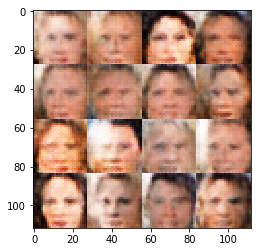

Epoch 1/10... Discriminator Loss: 1.3843... Generator Loss: 0.8990
Epoch 1/10... Discriminator Loss: 1.3664... Generator Loss: 0.8547
Epoch 1/10... Discriminator Loss: 1.4418... Generator Loss: 0.7511
Epoch 1/10... Discriminator Loss: 1.3226... Generator Loss: 0.7848
Epoch 1/10... Discriminator Loss: 1.3411... Generator Loss: 0.8950
Epoch 1/10... Discriminator Loss: 1.3396... Generator Loss: 0.9776
Epoch 1/10... Discriminator Loss: 1.3877... Generator Loss: 0.9843
Epoch 1/10... Discriminator Loss: 1.4053... Generator Loss: 0.8469
Epoch 2/10... Discriminator Loss: 1.4362... Generator Loss: 0.6504
Epoch 2/10... Discriminator Loss: 1.4346... Generator Loss: 0.6253
<class 'numpy.ndarray'>


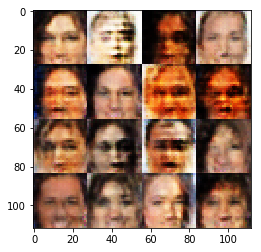

Epoch 2/10... Discriminator Loss: 1.3781... Generator Loss: 0.7218
Epoch 2/10... Discriminator Loss: 1.4967... Generator Loss: 0.7622
Epoch 2/10... Discriminator Loss: 1.3596... Generator Loss: 0.9058
Epoch 2/10... Discriminator Loss: 1.4456... Generator Loss: 0.9161
Epoch 2/10... Discriminator Loss: 1.3963... Generator Loss: 0.8603
Epoch 2/10... Discriminator Loss: 1.3968... Generator Loss: 0.9878
Epoch 2/10... Discriminator Loss: 1.4330... Generator Loss: 0.7436
Epoch 2/10... Discriminator Loss: 1.4833... Generator Loss: 0.9140
Epoch 2/10... Discriminator Loss: 1.3787... Generator Loss: 0.9307
Epoch 2/10... Discriminator Loss: 1.3447... Generator Loss: 0.8636
<class 'numpy.ndarray'>


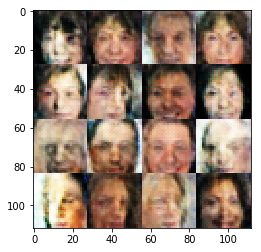

Epoch 2/10... Discriminator Loss: 1.4010... Generator Loss: 0.8784
Epoch 2/10... Discriminator Loss: 1.3315... Generator Loss: 0.7872
Epoch 2/10... Discriminator Loss: 1.3833... Generator Loss: 0.7768
Epoch 2/10... Discriminator Loss: 1.3904... Generator Loss: 0.7874
Epoch 2/10... Discriminator Loss: 1.3969... Generator Loss: 0.9195
Epoch 2/10... Discriminator Loss: 1.3778... Generator Loss: 0.7014
Epoch 2/10... Discriminator Loss: 1.4411... Generator Loss: 0.7658
Epoch 2/10... Discriminator Loss: 1.3449... Generator Loss: 0.7550
Epoch 2/10... Discriminator Loss: 1.3221... Generator Loss: 0.9353
Epoch 2/10... Discriminator Loss: 1.4261... Generator Loss: 0.8394
<class 'numpy.ndarray'>


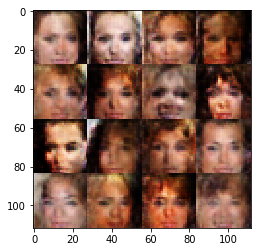

Epoch 2/10... Discriminator Loss: 1.3777... Generator Loss: 1.0416
Epoch 2/10... Discriminator Loss: 1.3433... Generator Loss: 0.9679
Epoch 2/10... Discriminator Loss: 1.4294... Generator Loss: 0.7112
Epoch 2/10... Discriminator Loss: 1.3807... Generator Loss: 0.8184
Epoch 2/10... Discriminator Loss: 1.4407... Generator Loss: 0.9184
Epoch 2/10... Discriminator Loss: 1.3461... Generator Loss: 0.7755
Epoch 2/10... Discriminator Loss: 1.2948... Generator Loss: 0.8906
Epoch 2/10... Discriminator Loss: 1.3314... Generator Loss: 0.9155
Epoch 2/10... Discriminator Loss: 1.3849... Generator Loss: 0.9805
Epoch 2/10... Discriminator Loss: 1.4237... Generator Loss: 0.7025
<class 'numpy.ndarray'>


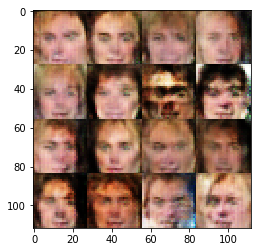

Epoch 2/10... Discriminator Loss: 1.3931... Generator Loss: 0.8900
Epoch 2/10... Discriminator Loss: 1.3736... Generator Loss: 0.8466
Epoch 2/10... Discriminator Loss: 1.3595... Generator Loss: 0.9253
Epoch 2/10... Discriminator Loss: 1.4492... Generator Loss: 0.8249
Epoch 2/10... Discriminator Loss: 1.3535... Generator Loss: 0.9007
Epoch 2/10... Discriminator Loss: 1.3721... Generator Loss: 0.8457
Epoch 2/10... Discriminator Loss: 1.3996... Generator Loss: 0.7763
Epoch 2/10... Discriminator Loss: 1.4409... Generator Loss: 0.7874
Epoch 2/10... Discriminator Loss: 1.4684... Generator Loss: 0.8431
Epoch 2/10... Discriminator Loss: 1.3627... Generator Loss: 0.8551
<class 'numpy.ndarray'>


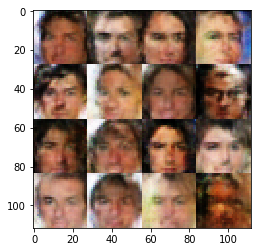

Epoch 2/10... Discriminator Loss: 1.3829... Generator Loss: 0.9164
Epoch 2/10... Discriminator Loss: 1.3792... Generator Loss: 0.8805
Epoch 2/10... Discriminator Loss: 1.4518... Generator Loss: 0.5517
Epoch 2/10... Discriminator Loss: 1.3447... Generator Loss: 0.8265
Epoch 2/10... Discriminator Loss: 1.3928... Generator Loss: 0.8597
Epoch 2/10... Discriminator Loss: 1.3728... Generator Loss: 0.7889
Epoch 2/10... Discriminator Loss: 1.3506... Generator Loss: 0.7429
Epoch 2/10... Discriminator Loss: 1.3102... Generator Loss: 0.8939
Epoch 2/10... Discriminator Loss: 1.4446... Generator Loss: 0.8508
Epoch 2/10... Discriminator Loss: 1.3800... Generator Loss: 0.8703
<class 'numpy.ndarray'>


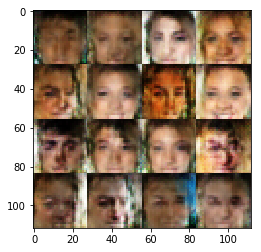

Epoch 2/10... Discriminator Loss: 1.4005... Generator Loss: 0.8157
Epoch 2/10... Discriminator Loss: 1.3705... Generator Loss: 0.7705
Epoch 2/10... Discriminator Loss: 1.3729... Generator Loss: 0.8943
Epoch 2/10... Discriminator Loss: 1.3874... Generator Loss: 0.8532
Epoch 2/10... Discriminator Loss: 1.3759... Generator Loss: 0.8169
Epoch 2/10... Discriminator Loss: 1.4659... Generator Loss: 0.8428
Epoch 2/10... Discriminator Loss: 1.3949... Generator Loss: 0.6692
Epoch 2/10... Discriminator Loss: 1.3624... Generator Loss: 0.8490
Epoch 2/10... Discriminator Loss: 1.3575... Generator Loss: 0.7458
Epoch 2/10... Discriminator Loss: 1.4141... Generator Loss: 0.8384
<class 'numpy.ndarray'>


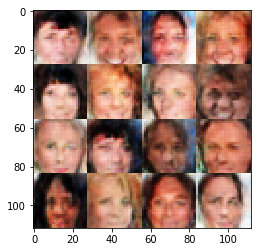

Epoch 2/10... Discriminator Loss: 1.4087... Generator Loss: 0.5723
Epoch 2/10... Discriminator Loss: 1.4378... Generator Loss: 0.8510
Epoch 2/10... Discriminator Loss: 1.3324... Generator Loss: 0.7478
Epoch 2/10... Discriminator Loss: 1.4016... Generator Loss: 0.8673
Epoch 2/10... Discriminator Loss: 1.3478... Generator Loss: 0.7790
Epoch 2/10... Discriminator Loss: 1.3854... Generator Loss: 0.9059
Epoch 2/10... Discriminator Loss: 1.4050... Generator Loss: 0.6500
Epoch 2/10... Discriminator Loss: 1.3896... Generator Loss: 0.7114
Epoch 2/10... Discriminator Loss: 1.3650... Generator Loss: 0.9175
Epoch 2/10... Discriminator Loss: 1.4781... Generator Loss: 0.5958
<class 'numpy.ndarray'>


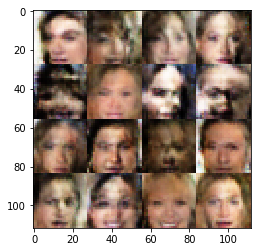

Epoch 2/10... Discriminator Loss: 1.3553... Generator Loss: 0.7526
Epoch 2/10... Discriminator Loss: 1.4656... Generator Loss: 0.7996
Epoch 2/10... Discriminator Loss: 1.3850... Generator Loss: 0.6803
Epoch 2/10... Discriminator Loss: 1.3907... Generator Loss: 0.8343
Epoch 2/10... Discriminator Loss: 1.4191... Generator Loss: 0.7686
Epoch 2/10... Discriminator Loss: 1.3888... Generator Loss: 0.6694
Epoch 2/10... Discriminator Loss: 1.4221... Generator Loss: 0.6452
Epoch 2/10... Discriminator Loss: 1.3867... Generator Loss: 0.6778
Epoch 2/10... Discriminator Loss: 1.3555... Generator Loss: 0.8170
Epoch 2/10... Discriminator Loss: 1.4092... Generator Loss: 0.8783
<class 'numpy.ndarray'>


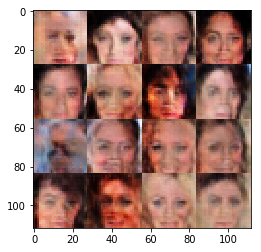

Epoch 2/10... Discriminator Loss: 1.4178... Generator Loss: 0.7576
Epoch 2/10... Discriminator Loss: 1.3233... Generator Loss: 0.7816
Epoch 2/10... Discriminator Loss: 1.4522... Generator Loss: 0.7484
Epoch 2/10... Discriminator Loss: 1.3945... Generator Loss: 0.7461
Epoch 2/10... Discriminator Loss: 1.4086... Generator Loss: 0.9184
Epoch 2/10... Discriminator Loss: 1.4107... Generator Loss: 0.8575
Epoch 2/10... Discriminator Loss: 1.4222... Generator Loss: 0.7465
Epoch 2/10... Discriminator Loss: 1.3976... Generator Loss: 0.7555
Epoch 2/10... Discriminator Loss: 1.3301... Generator Loss: 0.9234
Epoch 2/10... Discriminator Loss: 1.3155... Generator Loss: 0.8051
<class 'numpy.ndarray'>


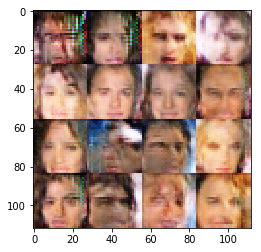

Epoch 2/10... Discriminator Loss: 1.3720... Generator Loss: 0.8188
Epoch 2/10... Discriminator Loss: 1.4019... Generator Loss: 0.7333
Epoch 2/10... Discriminator Loss: 1.4620... Generator Loss: 0.7924
Epoch 2/10... Discriminator Loss: 1.3739... Generator Loss: 0.8057
Epoch 2/10... Discriminator Loss: 1.3846... Generator Loss: 0.8924
Epoch 2/10... Discriminator Loss: 1.3976... Generator Loss: 0.7396
Epoch 2/10... Discriminator Loss: 1.3743... Generator Loss: 0.8152
Epoch 2/10... Discriminator Loss: 1.4574... Generator Loss: 0.7397
Epoch 2/10... Discriminator Loss: 1.3604... Generator Loss: 0.7372
Epoch 2/10... Discriminator Loss: 1.3261... Generator Loss: 0.8060
<class 'numpy.ndarray'>


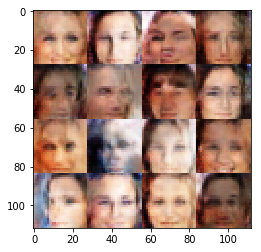

Epoch 2/10... Discriminator Loss: 1.4060... Generator Loss: 0.9803
Epoch 2/10... Discriminator Loss: 1.3735... Generator Loss: 0.8761
Epoch 2/10... Discriminator Loss: 1.3712... Generator Loss: 0.7977
Epoch 2/10... Discriminator Loss: 1.4071... Generator Loss: 0.7618
Epoch 2/10... Discriminator Loss: 1.3610... Generator Loss: 0.7684
Epoch 2/10... Discriminator Loss: 1.3140... Generator Loss: 0.9634
Epoch 2/10... Discriminator Loss: 1.4291... Generator Loss: 0.5616
Epoch 2/10... Discriminator Loss: 1.3699... Generator Loss: 0.8027
Epoch 2/10... Discriminator Loss: 1.3733... Generator Loss: 0.8077
Epoch 2/10... Discriminator Loss: 1.4536... Generator Loss: 0.6823
<class 'numpy.ndarray'>


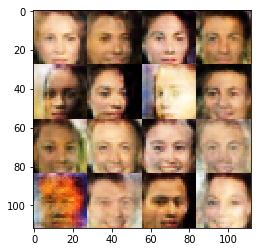

Epoch 2/10... Discriminator Loss: 1.4051... Generator Loss: 0.7665
Epoch 2/10... Discriminator Loss: 1.4245... Generator Loss: 0.7043
Epoch 2/10... Discriminator Loss: 1.3167... Generator Loss: 1.0225
Epoch 2/10... Discriminator Loss: 1.4070... Generator Loss: 0.8356
Epoch 2/10... Discriminator Loss: 1.4208... Generator Loss: 0.5935
Epoch 2/10... Discriminator Loss: 1.3865... Generator Loss: 0.8203
Epoch 2/10... Discriminator Loss: 1.4626... Generator Loss: 0.7070
Epoch 2/10... Discriminator Loss: 1.4100... Generator Loss: 0.6911
Epoch 2/10... Discriminator Loss: 1.4779... Generator Loss: 0.7026
Epoch 2/10... Discriminator Loss: 1.4055... Generator Loss: 0.7827
<class 'numpy.ndarray'>


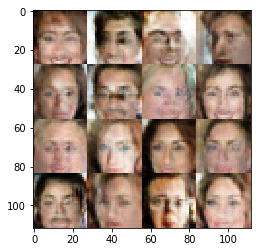

Epoch 2/10... Discriminator Loss: 1.3930... Generator Loss: 0.8739
Epoch 2/10... Discriminator Loss: 1.4156... Generator Loss: 0.6494
Epoch 2/10... Discriminator Loss: 1.3998... Generator Loss: 0.6946
Epoch 2/10... Discriminator Loss: 1.3599... Generator Loss: 0.9079
Epoch 2/10... Discriminator Loss: 1.4029... Generator Loss: 0.8302
Epoch 2/10... Discriminator Loss: 1.3907... Generator Loss: 0.6238
Epoch 2/10... Discriminator Loss: 1.4138... Generator Loss: 0.6719
Epoch 2/10... Discriminator Loss: 1.3763... Generator Loss: 0.7300
Epoch 2/10... Discriminator Loss: 1.3916... Generator Loss: 0.9713
Epoch 2/10... Discriminator Loss: 1.3260... Generator Loss: 0.7018
<class 'numpy.ndarray'>


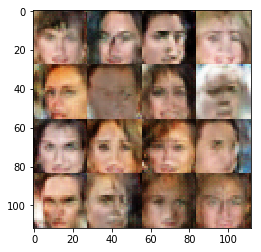

Epoch 2/10... Discriminator Loss: 1.4706... Generator Loss: 0.6710
Epoch 2/10... Discriminator Loss: 1.3882... Generator Loss: 0.7572
Epoch 2/10... Discriminator Loss: 1.3780... Generator Loss: 0.7816
Epoch 2/10... Discriminator Loss: 1.3325... Generator Loss: 0.7978
Epoch 2/10... Discriminator Loss: 1.4253... Generator Loss: 0.7470
Epoch 2/10... Discriminator Loss: 1.4080... Generator Loss: 0.7372
Epoch 2/10... Discriminator Loss: 1.3548... Generator Loss: 0.7638
Epoch 2/10... Discriminator Loss: 1.4013... Generator Loss: 0.8168
Epoch 2/10... Discriminator Loss: 1.4302... Generator Loss: 0.8566
Epoch 2/10... Discriminator Loss: 1.4037... Generator Loss: 0.8104
<class 'numpy.ndarray'>


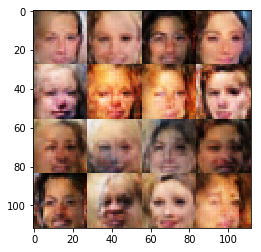

Epoch 2/10... Discriminator Loss: 1.3960... Generator Loss: 0.6805
Epoch 2/10... Discriminator Loss: 1.4091... Generator Loss: 0.8608
Epoch 2/10... Discriminator Loss: 1.3655... Generator Loss: 0.8705
Epoch 2/10... Discriminator Loss: 1.4216... Generator Loss: 0.8047
Epoch 2/10... Discriminator Loss: 1.4074... Generator Loss: 0.7952
Epoch 2/10... Discriminator Loss: 1.3610... Generator Loss: 0.7034
Epoch 2/10... Discriminator Loss: 1.4360... Generator Loss: 0.8113
Epoch 2/10... Discriminator Loss: 1.3804... Generator Loss: 0.7854
Epoch 2/10... Discriminator Loss: 1.4097... Generator Loss: 0.6981
Epoch 2/10... Discriminator Loss: 1.3834... Generator Loss: 0.7938
<class 'numpy.ndarray'>


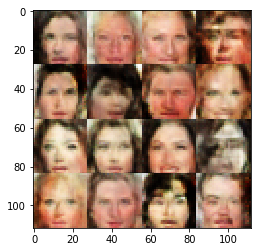

Epoch 2/10... Discriminator Loss: 1.3636... Generator Loss: 0.8119
Epoch 2/10... Discriminator Loss: 1.4115... Generator Loss: 0.6583
Epoch 2/10... Discriminator Loss: 1.4682... Generator Loss: 0.7378
Epoch 2/10... Discriminator Loss: 1.4277... Generator Loss: 0.7027
Epoch 2/10... Discriminator Loss: 1.4075... Generator Loss: 0.8269
Epoch 2/10... Discriminator Loss: 1.3529... Generator Loss: 0.8591
Epoch 3/10... Discriminator Loss: 1.3626... Generator Loss: 0.7906
Epoch 3/10... Discriminator Loss: 1.3916... Generator Loss: 0.9558
Epoch 3/10... Discriminator Loss: 1.4030... Generator Loss: 0.7112
Epoch 3/10... Discriminator Loss: 1.3877... Generator Loss: 0.8775
<class 'numpy.ndarray'>


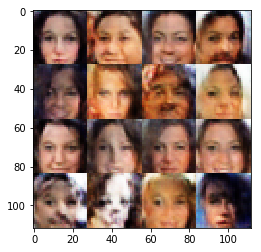

Epoch 3/10... Discriminator Loss: 1.3846... Generator Loss: 0.7875
Epoch 3/10... Discriminator Loss: 1.3772... Generator Loss: 0.8277
Epoch 3/10... Discriminator Loss: 1.3779... Generator Loss: 0.7774
Epoch 3/10... Discriminator Loss: 1.3869... Generator Loss: 0.6950
Epoch 3/10... Discriminator Loss: 1.3775... Generator Loss: 0.8795
Epoch 3/10... Discriminator Loss: 1.3516... Generator Loss: 0.8027
Epoch 3/10... Discriminator Loss: 1.3676... Generator Loss: 0.9389
Epoch 3/10... Discriminator Loss: 1.3864... Generator Loss: 0.7290
Epoch 3/10... Discriminator Loss: 1.4250... Generator Loss: 0.8327
Epoch 3/10... Discriminator Loss: 1.3747... Generator Loss: 0.7811
<class 'numpy.ndarray'>


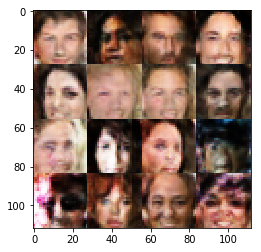

Epoch 3/10... Discriminator Loss: 1.3639... Generator Loss: 0.7909
Epoch 3/10... Discriminator Loss: 1.4233... Generator Loss: 0.8202
Epoch 3/10... Discriminator Loss: 1.4326... Generator Loss: 0.6454
Epoch 3/10... Discriminator Loss: 1.3851... Generator Loss: 0.7731
Epoch 3/10... Discriminator Loss: 1.3815... Generator Loss: 0.7797
Epoch 3/10... Discriminator Loss: 1.4462... Generator Loss: 0.8063
Epoch 3/10... Discriminator Loss: 1.3527... Generator Loss: 0.7607
Epoch 3/10... Discriminator Loss: 1.3919... Generator Loss: 0.8653
Epoch 3/10... Discriminator Loss: 1.3818... Generator Loss: 0.8345
Epoch 3/10... Discriminator Loss: 1.3866... Generator Loss: 0.7772
<class 'numpy.ndarray'>


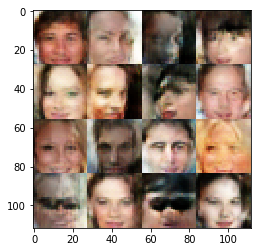

Epoch 3/10... Discriminator Loss: 1.3576... Generator Loss: 0.7165
Epoch 3/10... Discriminator Loss: 1.4553... Generator Loss: 0.7128
Epoch 3/10... Discriminator Loss: 1.3808... Generator Loss: 0.7841
Epoch 3/10... Discriminator Loss: 1.3832... Generator Loss: 0.8376
Epoch 3/10... Discriminator Loss: 1.3958... Generator Loss: 0.8128
Epoch 3/10... Discriminator Loss: 1.3884... Generator Loss: 0.6517
Epoch 3/10... Discriminator Loss: 1.3603... Generator Loss: 0.6443
Epoch 3/10... Discriminator Loss: 1.4218... Generator Loss: 0.8165
Epoch 3/10... Discriminator Loss: 1.3760... Generator Loss: 0.7976
Epoch 3/10... Discriminator Loss: 1.4162... Generator Loss: 0.8445
<class 'numpy.ndarray'>


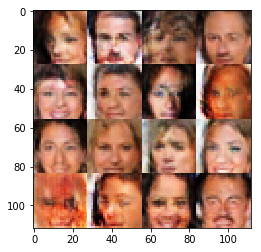

Epoch 3/10... Discriminator Loss: 1.3775... Generator Loss: 0.7821
Epoch 3/10... Discriminator Loss: 1.3717... Generator Loss: 0.7506
Epoch 3/10... Discriminator Loss: 1.3534... Generator Loss: 0.7603
Epoch 3/10... Discriminator Loss: 1.3678... Generator Loss: 0.7808
Epoch 3/10... Discriminator Loss: 1.3900... Generator Loss: 0.8362
Epoch 3/10... Discriminator Loss: 1.4562... Generator Loss: 0.6336
Epoch 3/10... Discriminator Loss: 1.4054... Generator Loss: 0.8258
Epoch 3/10... Discriminator Loss: 1.4219... Generator Loss: 0.7764
Epoch 3/10... Discriminator Loss: 1.3378... Generator Loss: 0.7509
Epoch 3/10... Discriminator Loss: 1.3863... Generator Loss: 0.8002
<class 'numpy.ndarray'>


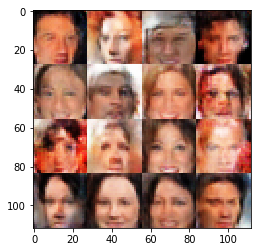

Epoch 3/10... Discriminator Loss: 1.4024... Generator Loss: 0.8054
Epoch 3/10... Discriminator Loss: 1.3868... Generator Loss: 0.8293
Epoch 3/10... Discriminator Loss: 1.4005... Generator Loss: 0.8821
Epoch 3/10... Discriminator Loss: 1.3559... Generator Loss: 0.8058
Epoch 3/10... Discriminator Loss: 1.3632... Generator Loss: 0.8449
Epoch 3/10... Discriminator Loss: 1.3714... Generator Loss: 0.8266
Epoch 3/10... Discriminator Loss: 1.4061... Generator Loss: 0.8472
Epoch 3/10... Discriminator Loss: 1.4063... Generator Loss: 0.6760
Epoch 3/10... Discriminator Loss: 1.3894... Generator Loss: 0.8139
Epoch 3/10... Discriminator Loss: 1.3581... Generator Loss: 0.7436
<class 'numpy.ndarray'>


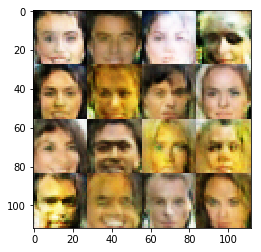

Epoch 3/10... Discriminator Loss: 1.4021... Generator Loss: 0.7706
Epoch 3/10... Discriminator Loss: 1.4121... Generator Loss: 0.7907
Epoch 3/10... Discriminator Loss: 1.4011... Generator Loss: 0.8446
Epoch 3/10... Discriminator Loss: 1.3672... Generator Loss: 0.8675
Epoch 3/10... Discriminator Loss: 1.3818... Generator Loss: 0.8166
Epoch 3/10... Discriminator Loss: 1.3684... Generator Loss: 0.7840
Epoch 3/10... Discriminator Loss: 1.3787... Generator Loss: 0.8524
Epoch 3/10... Discriminator Loss: 1.3993... Generator Loss: 0.8069
Epoch 3/10... Discriminator Loss: 1.4472... Generator Loss: 0.8958
Epoch 3/10... Discriminator Loss: 1.4313... Generator Loss: 0.8514
<class 'numpy.ndarray'>


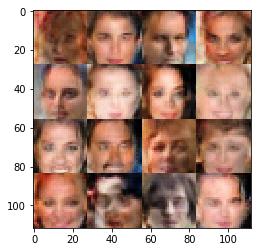

Epoch 3/10... Discriminator Loss: 1.3779... Generator Loss: 0.7482
Epoch 3/10... Discriminator Loss: 1.3760... Generator Loss: 0.7786
Epoch 3/10... Discriminator Loss: 1.4065... Generator Loss: 0.7779
Epoch 3/10... Discriminator Loss: 1.3836... Generator Loss: 0.7834
Epoch 3/10... Discriminator Loss: 1.3644... Generator Loss: 0.8306
Epoch 3/10... Discriminator Loss: 1.3731... Generator Loss: 0.7593
Epoch 3/10... Discriminator Loss: 1.3972... Generator Loss: 0.8534
Epoch 3/10... Discriminator Loss: 1.4074... Generator Loss: 0.9013
Epoch 3/10... Discriminator Loss: 1.3696... Generator Loss: 0.8279
Epoch 3/10... Discriminator Loss: 1.4516... Generator Loss: 0.8524
<class 'numpy.ndarray'>


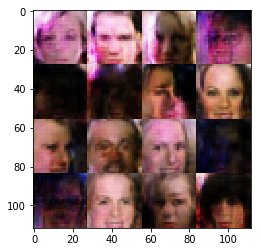

Epoch 3/10... Discriminator Loss: 1.4446... Generator Loss: 0.6957
Epoch 3/10... Discriminator Loss: 1.3985... Generator Loss: 0.8609
Epoch 3/10... Discriminator Loss: 1.3577... Generator Loss: 0.7618
Epoch 3/10... Discriminator Loss: 1.3828... Generator Loss: 0.8476
Epoch 3/10... Discriminator Loss: 1.3992... Generator Loss: 0.6925
Epoch 3/10... Discriminator Loss: 1.4165... Generator Loss: 0.8397
Epoch 3/10... Discriminator Loss: 1.4172... Generator Loss: 0.7597
Epoch 3/10... Discriminator Loss: 1.3758... Generator Loss: 0.8745
Epoch 3/10... Discriminator Loss: 1.3764... Generator Loss: 0.8333
Epoch 3/10... Discriminator Loss: 1.3433... Generator Loss: 0.7662
<class 'numpy.ndarray'>


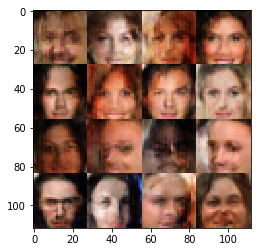

Epoch 3/10... Discriminator Loss: 1.3459... Generator Loss: 0.7795
Epoch 3/10... Discriminator Loss: 1.3759... Generator Loss: 0.8566
Epoch 3/10... Discriminator Loss: 1.4159... Generator Loss: 0.8412
Epoch 3/10... Discriminator Loss: 1.3445... Generator Loss: 0.7798
Epoch 3/10... Discriminator Loss: 1.3398... Generator Loss: 0.8275
Epoch 3/10... Discriminator Loss: 1.3762... Generator Loss: 0.7955
Epoch 3/10... Discriminator Loss: 1.3570... Generator Loss: 0.8199
Epoch 3/10... Discriminator Loss: 1.3789... Generator Loss: 0.7593
Epoch 3/10... Discriminator Loss: 1.3744... Generator Loss: 0.7913
Epoch 3/10... Discriminator Loss: 1.3588... Generator Loss: 0.7211
<class 'numpy.ndarray'>


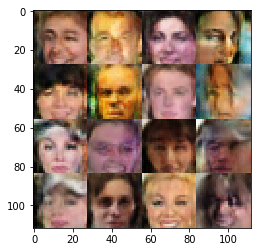

Epoch 3/10... Discriminator Loss: 1.3838... Generator Loss: 0.8207
Epoch 3/10... Discriminator Loss: 1.3979... Generator Loss: 0.8410
Epoch 3/10... Discriminator Loss: 1.3418... Generator Loss: 1.0816
Epoch 3/10... Discriminator Loss: 1.3391... Generator Loss: 0.8257
Epoch 3/10... Discriminator Loss: 1.3340... Generator Loss: 0.7044
Epoch 3/10... Discriminator Loss: 1.3996... Generator Loss: 0.7524
Epoch 3/10... Discriminator Loss: 1.3466... Generator Loss: 0.7058
Epoch 3/10... Discriminator Loss: 1.2493... Generator Loss: 0.8129
Epoch 3/10... Discriminator Loss: 1.4237... Generator Loss: 0.6674
Epoch 3/10... Discriminator Loss: 1.3929... Generator Loss: 0.7725
<class 'numpy.ndarray'>


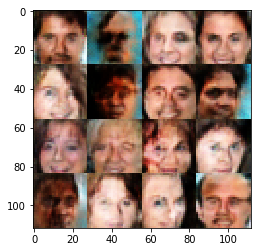

Epoch 3/10... Discriminator Loss: 1.3557... Generator Loss: 0.7623
Epoch 3/10... Discriminator Loss: 1.3858... Generator Loss: 0.8215
Epoch 3/10... Discriminator Loss: 1.3911... Generator Loss: 0.7331
Epoch 3/10... Discriminator Loss: 1.3357... Generator Loss: 0.6994
Epoch 3/10... Discriminator Loss: 1.2444... Generator Loss: 0.7563
Epoch 3/10... Discriminator Loss: 1.2905... Generator Loss: 0.7673
Epoch 3/10... Discriminator Loss: 1.3868... Generator Loss: 0.7674
Epoch 3/10... Discriminator Loss: 1.2905... Generator Loss: 0.8068
Epoch 3/10... Discriminator Loss: 1.3269... Generator Loss: 0.7913
Epoch 3/10... Discriminator Loss: 1.3466... Generator Loss: 0.7537
<class 'numpy.ndarray'>


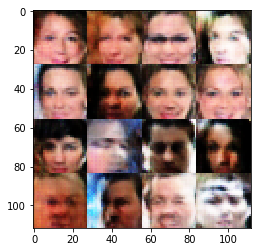

Epoch 3/10... Discriminator Loss: 1.3413... Generator Loss: 0.7978
Epoch 3/10... Discriminator Loss: 1.3609... Generator Loss: 0.8568
Epoch 3/10... Discriminator Loss: 1.3654... Generator Loss: 0.8954
Epoch 3/10... Discriminator Loss: 1.4585... Generator Loss: 0.7228
Epoch 3/10... Discriminator Loss: 1.3827... Generator Loss: 0.9586
Epoch 3/10... Discriminator Loss: 1.3514... Generator Loss: 0.9746
Epoch 3/10... Discriminator Loss: 1.4187... Generator Loss: 0.7817
Epoch 3/10... Discriminator Loss: 1.4026... Generator Loss: 0.8461
Epoch 3/10... Discriminator Loss: 1.3648... Generator Loss: 0.8714
Epoch 3/10... Discriminator Loss: 1.4219... Generator Loss: 0.7503
<class 'numpy.ndarray'>


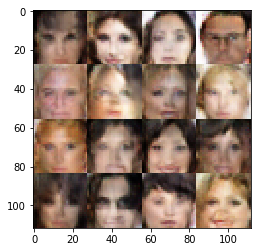

Epoch 3/10... Discriminator Loss: 1.4266... Generator Loss: 0.7366
Epoch 3/10... Discriminator Loss: 1.4316... Generator Loss: 0.6215
Epoch 3/10... Discriminator Loss: 1.3334... Generator Loss: 0.7792
Epoch 3/10... Discriminator Loss: 1.4342... Generator Loss: 0.7776
Epoch 3/10... Discriminator Loss: 1.3497... Generator Loss: 0.8057
Epoch 3/10... Discriminator Loss: 1.4284... Generator Loss: 0.6965
Epoch 3/10... Discriminator Loss: 1.3890... Generator Loss: 0.9509
Epoch 3/10... Discriminator Loss: 1.3699... Generator Loss: 0.7703
Epoch 3/10... Discriminator Loss: 1.3825... Generator Loss: 0.6085
Epoch 3/10... Discriminator Loss: 1.3912... Generator Loss: 0.7990
<class 'numpy.ndarray'>


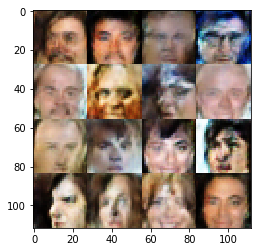

Epoch 3/10... Discriminator Loss: 1.4001... Generator Loss: 0.7478
Epoch 3/10... Discriminator Loss: 1.3688... Generator Loss: 0.6652
Epoch 3/10... Discriminator Loss: 1.3632... Generator Loss: 0.7577
Epoch 3/10... Discriminator Loss: 1.3464... Generator Loss: 0.7450
Epoch 3/10... Discriminator Loss: 1.4215... Generator Loss: 0.6035
Epoch 3/10... Discriminator Loss: 1.3957... Generator Loss: 0.7813
Epoch 3/10... Discriminator Loss: 1.3776... Generator Loss: 0.8462
Epoch 3/10... Discriminator Loss: 1.3921... Generator Loss: 0.8635
Epoch 3/10... Discriminator Loss: 1.3381... Generator Loss: 0.7140
Epoch 3/10... Discriminator Loss: 1.3696... Generator Loss: 0.7808
<class 'numpy.ndarray'>


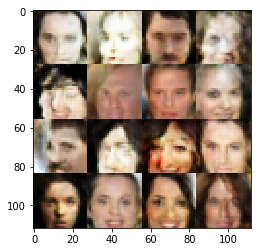

Epoch 3/10... Discriminator Loss: 1.4121... Generator Loss: 0.7705
Epoch 3/10... Discriminator Loss: 1.3487... Generator Loss: 0.6758
Epoch 3/10... Discriminator Loss: 1.3655... Generator Loss: 0.8369
Epoch 3/10... Discriminator Loss: 1.3802... Generator Loss: 0.6365
Epoch 3/10... Discriminator Loss: 1.3929... Generator Loss: 0.8448
Epoch 3/10... Discriminator Loss: 1.4089... Generator Loss: 0.8407
Epoch 3/10... Discriminator Loss: 1.3431... Generator Loss: 0.7693
Epoch 3/10... Discriminator Loss: 1.4228... Generator Loss: 0.6195
Epoch 3/10... Discriminator Loss: 1.3885... Generator Loss: 0.7874
Epoch 3/10... Discriminator Loss: 1.3953... Generator Loss: 0.9033
<class 'numpy.ndarray'>


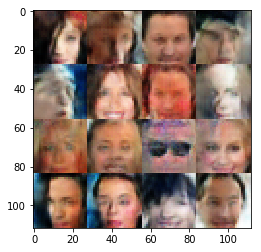

Epoch 3/10... Discriminator Loss: 1.3856... Generator Loss: 0.8631
Epoch 3/10... Discriminator Loss: 1.3964... Generator Loss: 0.7450
Epoch 3/10... Discriminator Loss: 1.3609... Generator Loss: 0.7653
Epoch 3/10... Discriminator Loss: 1.3905... Generator Loss: 0.8207
Epoch 4/10... Discriminator Loss: 1.3783... Generator Loss: 0.6991
Epoch 4/10... Discriminator Loss: 1.3283... Generator Loss: 0.8286
Epoch 4/10... Discriminator Loss: 1.4076... Generator Loss: 0.6536
Epoch 4/10... Discriminator Loss: 1.3817... Generator Loss: 0.5849
Epoch 4/10... Discriminator Loss: 1.3584... Generator Loss: 0.8155
Epoch 4/10... Discriminator Loss: 1.3421... Generator Loss: 0.8671
<class 'numpy.ndarray'>


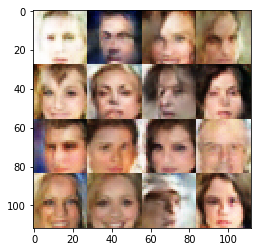

Epoch 4/10... Discriminator Loss: 1.4072... Generator Loss: 0.7849
Epoch 4/10... Discriminator Loss: 1.3731... Generator Loss: 0.7543
Epoch 4/10... Discriminator Loss: 1.3707... Generator Loss: 0.8753
Epoch 4/10... Discriminator Loss: 1.3728... Generator Loss: 0.8671
Epoch 4/10... Discriminator Loss: 1.3625... Generator Loss: 0.7457
Epoch 4/10... Discriminator Loss: 1.3843... Generator Loss: 0.8031
Epoch 4/10... Discriminator Loss: 1.4045... Generator Loss: 0.8747
Epoch 4/10... Discriminator Loss: 1.3587... Generator Loss: 0.7681
Epoch 4/10... Discriminator Loss: 1.2999... Generator Loss: 0.7357
Epoch 4/10... Discriminator Loss: 1.3886... Generator Loss: 0.8213
<class 'numpy.ndarray'>


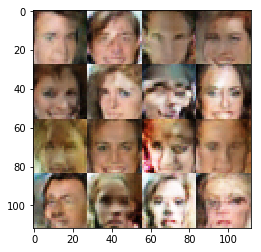

Epoch 4/10... Discriminator Loss: 1.4017... Generator Loss: 0.8006
Epoch 4/10... Discriminator Loss: 1.4107... Generator Loss: 0.6806
Epoch 4/10... Discriminator Loss: 1.3767... Generator Loss: 0.8724
Epoch 4/10... Discriminator Loss: 1.4225... Generator Loss: 0.7204
Epoch 4/10... Discriminator Loss: 1.3434... Generator Loss: 0.7081
Epoch 4/10... Discriminator Loss: 1.3423... Generator Loss: 0.7746
Epoch 4/10... Discriminator Loss: 1.4923... Generator Loss: 0.6711
Epoch 4/10... Discriminator Loss: 1.4056... Generator Loss: 0.8007
Epoch 4/10... Discriminator Loss: 1.3829... Generator Loss: 0.7522
Epoch 4/10... Discriminator Loss: 1.3658... Generator Loss: 0.8883
<class 'numpy.ndarray'>


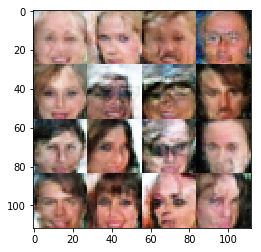

Epoch 4/10... Discriminator Loss: 1.4043... Generator Loss: 0.8348
Epoch 4/10... Discriminator Loss: 1.3556... Generator Loss: 0.8121
Epoch 4/10... Discriminator Loss: 1.3811... Generator Loss: 0.6868
Epoch 4/10... Discriminator Loss: 1.3684... Generator Loss: 0.8215
Epoch 4/10... Discriminator Loss: 1.4116... Generator Loss: 0.7806
Epoch 4/10... Discriminator Loss: 1.4063... Generator Loss: 0.7798
Epoch 4/10... Discriminator Loss: 1.4507... Generator Loss: 0.6537
Epoch 4/10... Discriminator Loss: 1.4882... Generator Loss: 0.5946
Epoch 4/10... Discriminator Loss: 1.3649... Generator Loss: 0.7361
Epoch 4/10... Discriminator Loss: 1.3484... Generator Loss: 0.7981
<class 'numpy.ndarray'>


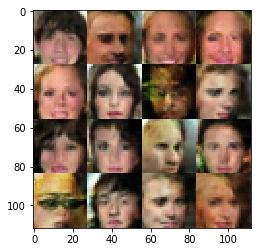

Epoch 4/10... Discriminator Loss: 1.3462... Generator Loss: 0.7672
Epoch 4/10... Discriminator Loss: 1.3568... Generator Loss: 0.7228
Epoch 4/10... Discriminator Loss: 1.3702... Generator Loss: 0.8293
Epoch 4/10... Discriminator Loss: 1.3721... Generator Loss: 0.8175
Epoch 4/10... Discriminator Loss: 1.3893... Generator Loss: 0.7004
Epoch 4/10... Discriminator Loss: 1.4181... Generator Loss: 0.8512
Epoch 4/10... Discriminator Loss: 1.3478... Generator Loss: 0.8403
Epoch 4/10... Discriminator Loss: 1.3692... Generator Loss: 0.7630
Epoch 4/10... Discriminator Loss: 1.3632... Generator Loss: 0.7461
Epoch 4/10... Discriminator Loss: 1.3826... Generator Loss: 0.8998
<class 'numpy.ndarray'>


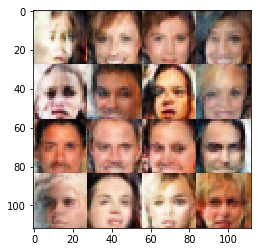

Epoch 4/10... Discriminator Loss: 1.4418... Generator Loss: 0.6662
Epoch 4/10... Discriminator Loss: 1.4269... Generator Loss: 0.8751
Epoch 4/10... Discriminator Loss: 1.3242... Generator Loss: 0.7363
Epoch 4/10... Discriminator Loss: 1.3836... Generator Loss: 0.7180
Epoch 4/10... Discriminator Loss: 1.4089... Generator Loss: 0.7107
Epoch 4/10... Discriminator Loss: 1.3840... Generator Loss: 0.6801
Epoch 4/10... Discriminator Loss: 1.3744... Generator Loss: 0.8590
Epoch 4/10... Discriminator Loss: 1.3541... Generator Loss: 0.7713
Epoch 4/10... Discriminator Loss: 1.4476... Generator Loss: 0.6316
Epoch 4/10... Discriminator Loss: 1.3697... Generator Loss: 0.7555
<class 'numpy.ndarray'>


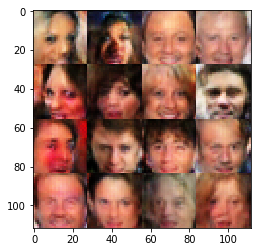

Epoch 4/10... Discriminator Loss: 1.2923... Generator Loss: 0.7537
Epoch 4/10... Discriminator Loss: 1.4001... Generator Loss: 0.5645
Epoch 4/10... Discriminator Loss: 1.4210... Generator Loss: 0.7924
Epoch 4/10... Discriminator Loss: 1.3948... Generator Loss: 0.8844
Epoch 4/10... Discriminator Loss: 1.4777... Generator Loss: 0.6152
Epoch 4/10... Discriminator Loss: 1.3759... Generator Loss: 0.8117
Epoch 4/10... Discriminator Loss: 1.3737... Generator Loss: 0.9005
Epoch 4/10... Discriminator Loss: 1.3880... Generator Loss: 0.8516
Epoch 4/10... Discriminator Loss: 1.3615... Generator Loss: 0.7267
Epoch 4/10... Discriminator Loss: 1.3675... Generator Loss: 0.6749
<class 'numpy.ndarray'>


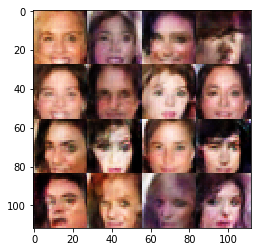

Epoch 4/10... Discriminator Loss: 1.4107... Generator Loss: 0.7375
Epoch 4/10... Discriminator Loss: 1.3710... Generator Loss: 0.7622
Epoch 4/10... Discriminator Loss: 1.3665... Generator Loss: 0.7820
Epoch 4/10... Discriminator Loss: 1.4297... Generator Loss: 0.8433
Epoch 4/10... Discriminator Loss: 1.3595... Generator Loss: 0.8565
Epoch 4/10... Discriminator Loss: 1.3697... Generator Loss: 0.7816
Epoch 4/10... Discriminator Loss: 1.3674... Generator Loss: 0.7881
Epoch 4/10... Discriminator Loss: 1.4263... Generator Loss: 0.6634
Epoch 4/10... Discriminator Loss: 1.3750... Generator Loss: 0.8324
Epoch 4/10... Discriminator Loss: 1.3817... Generator Loss: 0.7695
<class 'numpy.ndarray'>


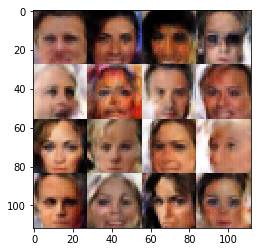

Epoch 4/10... Discriminator Loss: 1.3832... Generator Loss: 0.7794
Epoch 4/10... Discriminator Loss: 1.4008... Generator Loss: 0.8470
Epoch 4/10... Discriminator Loss: 1.3826... Generator Loss: 0.8344
Epoch 4/10... Discriminator Loss: 1.3571... Generator Loss: 0.8300
Epoch 4/10... Discriminator Loss: 1.3529... Generator Loss: 0.8908
Epoch 4/10... Discriminator Loss: 1.3894... Generator Loss: 0.8440
Epoch 4/10... Discriminator Loss: 1.3213... Generator Loss: 0.9429
Epoch 4/10... Discriminator Loss: 1.2867... Generator Loss: 0.7672
Epoch 4/10... Discriminator Loss: 1.3741... Generator Loss: 0.9188
Epoch 4/10... Discriminator Loss: 1.3962... Generator Loss: 0.7709
<class 'numpy.ndarray'>


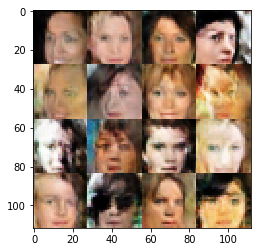

Epoch 4/10... Discriminator Loss: 1.3551... Generator Loss: 0.7726
Epoch 4/10... Discriminator Loss: 1.3849... Generator Loss: 0.7460
Epoch 4/10... Discriminator Loss: 1.3401... Generator Loss: 0.7721
Epoch 4/10... Discriminator Loss: 1.3851... Generator Loss: 0.8552
Epoch 4/10... Discriminator Loss: 1.3199... Generator Loss: 0.7208
Epoch 4/10... Discriminator Loss: 1.3880... Generator Loss: 0.7830
Epoch 4/10... Discriminator Loss: 1.4035... Generator Loss: 0.7270
Epoch 4/10... Discriminator Loss: 1.3411... Generator Loss: 0.7679
Epoch 4/10... Discriminator Loss: 1.3520... Generator Loss: 0.7102
Epoch 4/10... Discriminator Loss: 1.3680... Generator Loss: 0.8275
<class 'numpy.ndarray'>


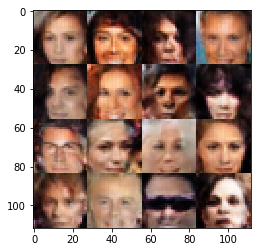

Epoch 4/10... Discriminator Loss: 1.3140... Generator Loss: 0.8359
Epoch 4/10... Discriminator Loss: 1.3808... Generator Loss: 0.7766
Epoch 4/10... Discriminator Loss: 1.3394... Generator Loss: 0.7464
Epoch 4/10... Discriminator Loss: 1.3794... Generator Loss: 0.7285
Epoch 4/10... Discriminator Loss: 1.3509... Generator Loss: 0.7345
Epoch 4/10... Discriminator Loss: 1.3638... Generator Loss: 0.6972
Epoch 4/10... Discriminator Loss: 1.3265... Generator Loss: 0.7520
Epoch 4/10... Discriminator Loss: 1.3952... Generator Loss: 0.6791
Epoch 4/10... Discriminator Loss: 1.2958... Generator Loss: 0.8832
Epoch 4/10... Discriminator Loss: 1.4095... Generator Loss: 0.8969
<class 'numpy.ndarray'>


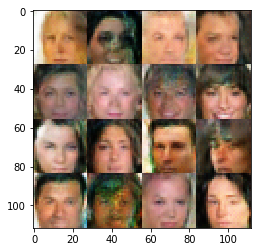

Epoch 4/10... Discriminator Loss: 1.3700... Generator Loss: 0.7457
Epoch 4/10... Discriminator Loss: 1.3409... Generator Loss: 0.7589
Epoch 4/10... Discriminator Loss: 1.4293... Generator Loss: 0.9087
Epoch 4/10... Discriminator Loss: 1.4286... Generator Loss: 0.6861
Epoch 4/10... Discriminator Loss: 1.4047... Generator Loss: 0.9472
Epoch 4/10... Discriminator Loss: 1.3793... Generator Loss: 0.7715
Epoch 4/10... Discriminator Loss: 1.3888... Generator Loss: 0.7923
Epoch 4/10... Discriminator Loss: 1.3588... Generator Loss: 0.6908
Epoch 4/10... Discriminator Loss: 1.3731... Generator Loss: 0.7372
Epoch 4/10... Discriminator Loss: 1.3324... Generator Loss: 0.6901
<class 'numpy.ndarray'>


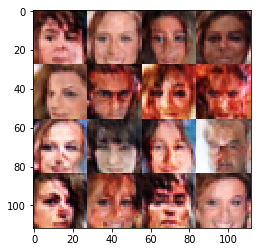

Epoch 4/10... Discriminator Loss: 1.3432... Generator Loss: 0.9643
Epoch 4/10... Discriminator Loss: 1.3736... Generator Loss: 0.9483
Epoch 4/10... Discriminator Loss: 1.3581... Generator Loss: 0.7539
Epoch 4/10... Discriminator Loss: 1.3576... Generator Loss: 0.8389
Epoch 4/10... Discriminator Loss: 1.4072... Generator Loss: 0.9479
Epoch 4/10... Discriminator Loss: 1.3631... Generator Loss: 0.7907
Epoch 4/10... Discriminator Loss: 1.3699... Generator Loss: 0.7676
Epoch 4/10... Discriminator Loss: 1.3043... Generator Loss: 0.7590
Epoch 4/10... Discriminator Loss: 1.3539... Generator Loss: 0.8702
Epoch 4/10... Discriminator Loss: 1.3584... Generator Loss: 0.8010
<class 'numpy.ndarray'>


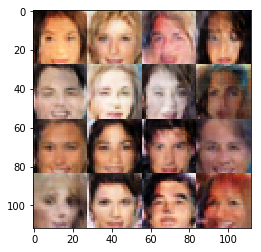

Epoch 4/10... Discriminator Loss: 1.3565... Generator Loss: 0.8026
Epoch 4/10... Discriminator Loss: 1.3430... Generator Loss: 0.8378
Epoch 4/10... Discriminator Loss: 1.3552... Generator Loss: 0.8652
Epoch 4/10... Discriminator Loss: 1.3092... Generator Loss: 0.8069
Epoch 4/10... Discriminator Loss: 1.4257... Generator Loss: 0.7477
Epoch 4/10... Discriminator Loss: 1.3596... Generator Loss: 0.7037
Epoch 4/10... Discriminator Loss: 1.3506... Generator Loss: 0.8211
Epoch 4/10... Discriminator Loss: 1.4081... Generator Loss: 0.8135
Epoch 4/10... Discriminator Loss: 1.3057... Generator Loss: 0.7813
Epoch 4/10... Discriminator Loss: 1.3858... Generator Loss: 0.8424
<class 'numpy.ndarray'>


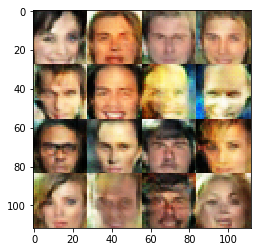

Epoch 4/10... Discriminator Loss: 1.3500... Generator Loss: 0.8603
Epoch 4/10... Discriminator Loss: 1.3691... Generator Loss: 0.8305
Epoch 4/10... Discriminator Loss: 1.3866... Generator Loss: 0.8949
Epoch 4/10... Discriminator Loss: 1.3907... Generator Loss: 0.8616
Epoch 4/10... Discriminator Loss: 1.3644... Generator Loss: 0.8925
Epoch 4/10... Discriminator Loss: 1.3299... Generator Loss: 0.8857
Epoch 4/10... Discriminator Loss: 1.3586... Generator Loss: 0.7195
Epoch 4/10... Discriminator Loss: 1.4008... Generator Loss: 0.7297
Epoch 4/10... Discriminator Loss: 1.3436... Generator Loss: 0.7305
Epoch 4/10... Discriminator Loss: 1.3113... Generator Loss: 0.8304
<class 'numpy.ndarray'>


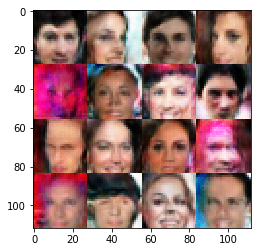

Epoch 4/10... Discriminator Loss: 1.3537... Generator Loss: 0.8146
Epoch 4/10... Discriminator Loss: 1.4391... Generator Loss: 0.7930
Epoch 4/10... Discriminator Loss: 1.5642... Generator Loss: 0.6459
Epoch 4/10... Discriminator Loss: 1.4663... Generator Loss: 1.0086
Epoch 4/10... Discriminator Loss: 1.3617... Generator Loss: 0.8078
Epoch 4/10... Discriminator Loss: 1.3761... Generator Loss: 0.8470
Epoch 4/10... Discriminator Loss: 1.3494... Generator Loss: 0.8662
Epoch 4/10... Discriminator Loss: 1.3369... Generator Loss: 0.8401
Epoch 4/10... Discriminator Loss: 1.3826... Generator Loss: 0.9372
Epoch 4/10... Discriminator Loss: 1.3332... Generator Loss: 0.7743
<class 'numpy.ndarray'>


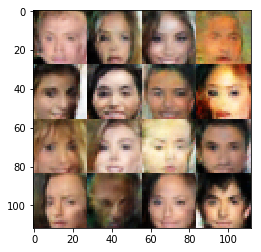

Epoch 4/10... Discriminator Loss: 1.4079... Generator Loss: 0.8989
Epoch 4/10... Discriminator Loss: 1.3421... Generator Loss: 0.7951
Epoch 5/10... Discriminator Loss: 1.4006... Generator Loss: 0.6023
Epoch 5/10... Discriminator Loss: 1.3518... Generator Loss: 0.9631
Epoch 5/10... Discriminator Loss: 1.3138... Generator Loss: 0.7459
Epoch 5/10... Discriminator Loss: 1.2866... Generator Loss: 0.7253
Epoch 5/10... Discriminator Loss: 1.3442... Generator Loss: 0.9646
Epoch 5/10... Discriminator Loss: 1.3907... Generator Loss: 0.7043
Epoch 5/10... Discriminator Loss: 1.3885... Generator Loss: 0.8465
Epoch 5/10... Discriminator Loss: 1.3660... Generator Loss: 0.8536
<class 'numpy.ndarray'>


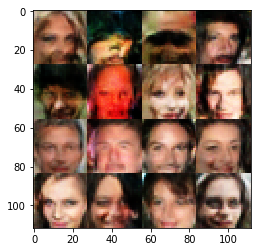

Epoch 5/10... Discriminator Loss: 1.4010... Generator Loss: 0.7145
Epoch 5/10... Discriminator Loss: 1.3145... Generator Loss: 0.7733
Epoch 5/10... Discriminator Loss: 1.2558... Generator Loss: 0.6601
Epoch 5/10... Discriminator Loss: 1.3036... Generator Loss: 0.7762
Epoch 5/10... Discriminator Loss: 1.3592... Generator Loss: 0.8842
Epoch 5/10... Discriminator Loss: 1.3543... Generator Loss: 0.8883
Epoch 5/10... Discriminator Loss: 1.3639... Generator Loss: 0.7903
Epoch 5/10... Discriminator Loss: 1.4265... Generator Loss: 0.8872
Epoch 5/10... Discriminator Loss: 1.3413... Generator Loss: 0.9917
Epoch 5/10... Discriminator Loss: 1.3276... Generator Loss: 0.7351
<class 'numpy.ndarray'>


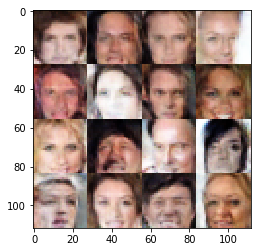

Epoch 5/10... Discriminator Loss: 1.4039... Generator Loss: 0.7279
Epoch 5/10... Discriminator Loss: 1.3719... Generator Loss: 0.7932
Epoch 5/10... Discriminator Loss: 1.2145... Generator Loss: 0.7466
Epoch 5/10... Discriminator Loss: 1.3779... Generator Loss: 0.7687
Epoch 5/10... Discriminator Loss: 1.3223... Generator Loss: 0.7913
Epoch 5/10... Discriminator Loss: 1.3256... Generator Loss: 0.7812
Epoch 5/10... Discriminator Loss: 1.3403... Generator Loss: 0.8142
Epoch 5/10... Discriminator Loss: 1.4114... Generator Loss: 0.7198
Epoch 5/10... Discriminator Loss: 1.3526... Generator Loss: 0.8733
Epoch 5/10... Discriminator Loss: 1.3641... Generator Loss: 0.8609
<class 'numpy.ndarray'>


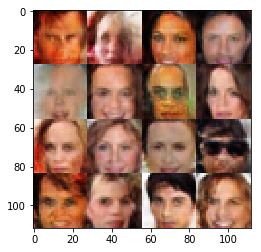

Epoch 5/10... Discriminator Loss: 1.3105... Generator Loss: 0.7530
Epoch 5/10... Discriminator Loss: 1.3718... Generator Loss: 0.7776
Epoch 5/10... Discriminator Loss: 1.4501... Generator Loss: 1.0272
Epoch 5/10... Discriminator Loss: 1.3697... Generator Loss: 0.7859
Epoch 5/10... Discriminator Loss: 1.3192... Generator Loss: 0.8489
Epoch 5/10... Discriminator Loss: 1.2556... Generator Loss: 0.6528
Epoch 5/10... Discriminator Loss: 1.3435... Generator Loss: 0.7386
Epoch 5/10... Discriminator Loss: 1.3511... Generator Loss: 0.7973
Epoch 5/10... Discriminator Loss: 1.2663... Generator Loss: 0.7936
Epoch 5/10... Discriminator Loss: 1.3333... Generator Loss: 0.7875
<class 'numpy.ndarray'>


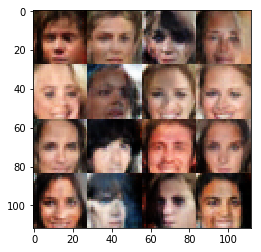

Epoch 5/10... Discriminator Loss: 1.3905... Generator Loss: 0.9281
Epoch 5/10... Discriminator Loss: 1.3502... Generator Loss: 0.8745
Epoch 5/10... Discriminator Loss: 1.2990... Generator Loss: 0.7981
Epoch 5/10... Discriminator Loss: 1.3749... Generator Loss: 0.7475
Epoch 5/10... Discriminator Loss: 1.3491... Generator Loss: 0.8423
Epoch 5/10... Discriminator Loss: 1.3041... Generator Loss: 0.8583
Epoch 5/10... Discriminator Loss: 1.3616... Generator Loss: 0.8537
Epoch 5/10... Discriminator Loss: 1.3868... Generator Loss: 0.7682
Epoch 5/10... Discriminator Loss: 1.3395... Generator Loss: 0.7467
Epoch 5/10... Discriminator Loss: 1.3371... Generator Loss: 0.7465
<class 'numpy.ndarray'>


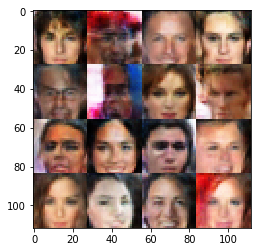

Epoch 5/10... Discriminator Loss: 1.3067... Generator Loss: 0.7691
Epoch 5/10... Discriminator Loss: 1.3853... Generator Loss: 0.8140
Epoch 5/10... Discriminator Loss: 1.3975... Generator Loss: 0.7906
Epoch 5/10... Discriminator Loss: 1.3661... Generator Loss: 0.7398
Epoch 5/10... Discriminator Loss: 1.3646... Generator Loss: 0.9336
Epoch 5/10... Discriminator Loss: 1.3023... Generator Loss: 0.7837
Epoch 5/10... Discriminator Loss: 1.3821... Generator Loss: 0.9006
Epoch 5/10... Discriminator Loss: 1.3971... Generator Loss: 0.9517
Epoch 5/10... Discriminator Loss: 1.3731... Generator Loss: 0.8217
Epoch 5/10... Discriminator Loss: 1.3133... Generator Loss: 0.7797
<class 'numpy.ndarray'>


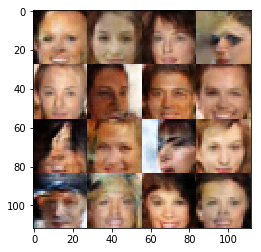

Epoch 5/10... Discriminator Loss: 1.3456... Generator Loss: 0.8132
Epoch 5/10... Discriminator Loss: 1.3306... Generator Loss: 0.8805
Epoch 5/10... Discriminator Loss: 1.4295... Generator Loss: 0.6053
Epoch 5/10... Discriminator Loss: 1.3841... Generator Loss: 0.8541
Epoch 5/10... Discriminator Loss: 1.3191... Generator Loss: 0.6962
Epoch 5/10... Discriminator Loss: 1.3528... Generator Loss: 0.9389
Epoch 5/10... Discriminator Loss: 1.3262... Generator Loss: 0.7658
Epoch 5/10... Discriminator Loss: 1.3603... Generator Loss: 0.8556
Epoch 5/10... Discriminator Loss: 1.4113... Generator Loss: 0.7589
Epoch 5/10... Discriminator Loss: 1.3651... Generator Loss: 0.9276
<class 'numpy.ndarray'>


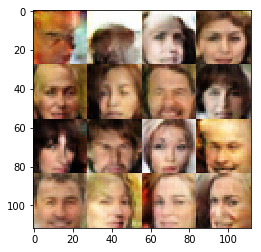

Epoch 5/10... Discriminator Loss: 1.2957... Generator Loss: 0.7519
Epoch 5/10... Discriminator Loss: 1.3171... Generator Loss: 0.8763
Epoch 5/10... Discriminator Loss: 1.3576... Generator Loss: 0.8889
Epoch 5/10... Discriminator Loss: 1.2829... Generator Loss: 0.6891
Epoch 5/10... Discriminator Loss: 1.3873... Generator Loss: 0.8412
Epoch 5/10... Discriminator Loss: 1.2916... Generator Loss: 0.7317
Epoch 5/10... Discriminator Loss: 1.3583... Generator Loss: 0.8090
Epoch 5/10... Discriminator Loss: 1.4000... Generator Loss: 1.0425
Epoch 5/10... Discriminator Loss: 1.3299... Generator Loss: 0.8339
Epoch 5/10... Discriminator Loss: 1.3099... Generator Loss: 0.7623
<class 'numpy.ndarray'>


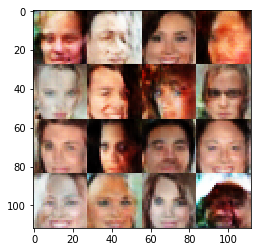

Epoch 5/10... Discriminator Loss: 1.3814... Generator Loss: 0.8395
Epoch 5/10... Discriminator Loss: 1.3405... Generator Loss: 0.8353
Epoch 5/10... Discriminator Loss: 1.3542... Generator Loss: 0.8020
Epoch 5/10... Discriminator Loss: 1.3893... Generator Loss: 0.9046
Epoch 5/10... Discriminator Loss: 1.3631... Generator Loss: 0.7954
Epoch 5/10... Discriminator Loss: 1.4086... Generator Loss: 0.7652
Epoch 5/10... Discriminator Loss: 1.5039... Generator Loss: 0.6809
Epoch 5/10... Discriminator Loss: 1.3455... Generator Loss: 0.8823
Epoch 5/10... Discriminator Loss: 1.4121... Generator Loss: 0.9482
Epoch 5/10... Discriminator Loss: 1.4103... Generator Loss: 0.7684
<class 'numpy.ndarray'>


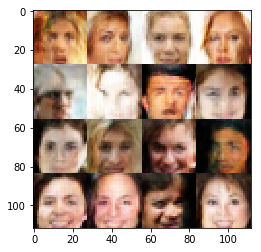

Epoch 5/10... Discriminator Loss: 1.3134... Generator Loss: 0.6686
Epoch 5/10... Discriminator Loss: 1.3116... Generator Loss: 0.7275
Epoch 5/10... Discriminator Loss: 1.3431... Generator Loss: 0.8081
Epoch 5/10... Discriminator Loss: 1.3686... Generator Loss: 1.0391
Epoch 5/10... Discriminator Loss: 1.2946... Generator Loss: 0.8696
Epoch 5/10... Discriminator Loss: 1.3117... Generator Loss: 0.8643
Epoch 5/10... Discriminator Loss: 1.3340... Generator Loss: 0.6716
Epoch 5/10... Discriminator Loss: 1.2535... Generator Loss: 0.7680
Epoch 5/10... Discriminator Loss: 1.4213... Generator Loss: 0.5941
Epoch 5/10... Discriminator Loss: 1.2604... Generator Loss: 0.8110
<class 'numpy.ndarray'>


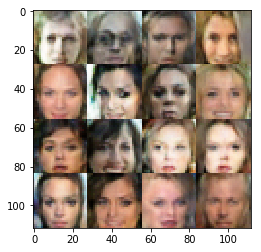

Epoch 5/10... Discriminator Loss: 1.3640... Generator Loss: 0.7063
Epoch 5/10... Discriminator Loss: 1.3682... Generator Loss: 0.9818
Epoch 5/10... Discriminator Loss: 1.3101... Generator Loss: 0.9674
Epoch 5/10... Discriminator Loss: 1.3731... Generator Loss: 0.7647
Epoch 5/10... Discriminator Loss: 1.3507... Generator Loss: 0.9598
Epoch 5/10... Discriminator Loss: 1.3783... Generator Loss: 0.6980
Epoch 5/10... Discriminator Loss: 1.3242... Generator Loss: 0.7321
Epoch 5/10... Discriminator Loss: 1.3199... Generator Loss: 0.8052
Epoch 5/10... Discriminator Loss: 1.3115... Generator Loss: 0.8106
Epoch 5/10... Discriminator Loss: 1.3477... Generator Loss: 0.8208
<class 'numpy.ndarray'>


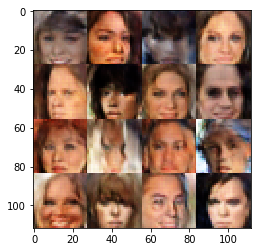

Epoch 5/10... Discriminator Loss: 1.4238... Generator Loss: 0.7757
Epoch 5/10... Discriminator Loss: 1.3149... Generator Loss: 0.7451
Epoch 5/10... Discriminator Loss: 1.3544... Generator Loss: 0.8394
Epoch 5/10... Discriminator Loss: 1.3235... Generator Loss: 0.7218
Epoch 5/10... Discriminator Loss: 1.3879... Generator Loss: 0.8711
Epoch 5/10... Discriminator Loss: 1.3137... Generator Loss: 0.8021
Epoch 5/10... Discriminator Loss: 1.2322... Generator Loss: 0.7655
Epoch 5/10... Discriminator Loss: 1.4829... Generator Loss: 0.6868
Epoch 5/10... Discriminator Loss: 1.3000... Generator Loss: 0.8595
Epoch 5/10... Discriminator Loss: 1.3696... Generator Loss: 0.7148
<class 'numpy.ndarray'>


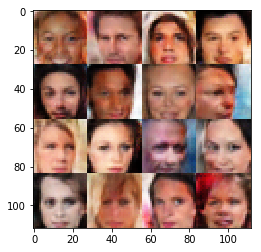

Epoch 5/10... Discriminator Loss: 1.3656... Generator Loss: 0.9007
Epoch 5/10... Discriminator Loss: 1.3494... Generator Loss: 0.8539
Epoch 5/10... Discriminator Loss: 1.2870... Generator Loss: 0.8527
Epoch 5/10... Discriminator Loss: 1.2920... Generator Loss: 0.7723
Epoch 5/10... Discriminator Loss: 1.3348... Generator Loss: 0.7827
Epoch 5/10... Discriminator Loss: 1.3443... Generator Loss: 0.8606
Epoch 5/10... Discriminator Loss: 1.3041... Generator Loss: 0.9913
Epoch 5/10... Discriminator Loss: 1.3451... Generator Loss: 0.8874
Epoch 5/10... Discriminator Loss: 1.3369... Generator Loss: 0.9550
Epoch 5/10... Discriminator Loss: 1.3092... Generator Loss: 0.8322
<class 'numpy.ndarray'>


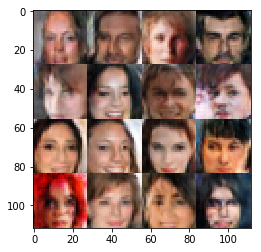

Epoch 5/10... Discriminator Loss: 1.3908... Generator Loss: 0.7454
Epoch 5/10... Discriminator Loss: 1.3181... Generator Loss: 0.9163
Epoch 5/10... Discriminator Loss: 1.3889... Generator Loss: 0.7672
Epoch 5/10... Discriminator Loss: 1.3182... Generator Loss: 0.8138
Epoch 5/10... Discriminator Loss: 1.4388... Generator Loss: 1.0533
Epoch 5/10... Discriminator Loss: 1.3683... Generator Loss: 0.8186
Epoch 5/10... Discriminator Loss: 1.2896... Generator Loss: 0.7772
Epoch 5/10... Discriminator Loss: 1.3356... Generator Loss: 0.9070
Epoch 5/10... Discriminator Loss: 1.3333... Generator Loss: 0.9506
Epoch 5/10... Discriminator Loss: 1.2974... Generator Loss: 0.8228
<class 'numpy.ndarray'>


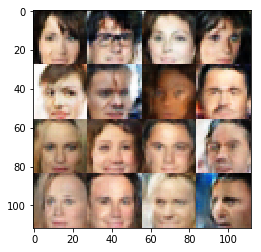

Epoch 5/10... Discriminator Loss: 1.3493... Generator Loss: 0.7252
Epoch 5/10... Discriminator Loss: 1.3132... Generator Loss: 0.7261
Epoch 5/10... Discriminator Loss: 1.3206... Generator Loss: 0.7586
Epoch 5/10... Discriminator Loss: 1.3445... Generator Loss: 0.9067
Epoch 5/10... Discriminator Loss: 1.3392... Generator Loss: 0.8202
Epoch 5/10... Discriminator Loss: 1.2884... Generator Loss: 0.9205
Epoch 5/10... Discriminator Loss: 1.3085... Generator Loss: 0.8416
Epoch 5/10... Discriminator Loss: 1.2642... Generator Loss: 0.8830
Epoch 5/10... Discriminator Loss: 1.3583... Generator Loss: 0.8811
Epoch 5/10... Discriminator Loss: 1.3059... Generator Loss: 0.8835
<class 'numpy.ndarray'>


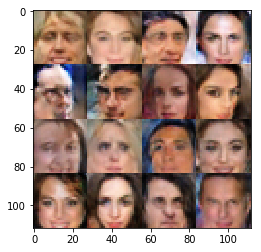

Epoch 5/10... Discriminator Loss: 1.3957... Generator Loss: 0.7042
Epoch 5/10... Discriminator Loss: 1.3132... Generator Loss: 0.8804
Epoch 5/10... Discriminator Loss: 1.3795... Generator Loss: 0.8004
Epoch 5/10... Discriminator Loss: 1.3503... Generator Loss: 0.8450
Epoch 5/10... Discriminator Loss: 1.2925... Generator Loss: 0.7441
Epoch 5/10... Discriminator Loss: 1.2934... Generator Loss: 0.9001
Epoch 5/10... Discriminator Loss: 1.3128... Generator Loss: 0.9524
Epoch 5/10... Discriminator Loss: 1.3027... Generator Loss: 0.8511
Epoch 5/10... Discriminator Loss: 1.3287... Generator Loss: 0.7544
Epoch 5/10... Discriminator Loss: 1.3777... Generator Loss: 0.8013
<class 'numpy.ndarray'>


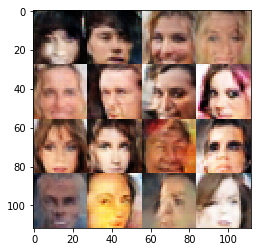

Epoch 5/10... Discriminator Loss: 1.3972... Generator Loss: 0.8357
Epoch 6/10... Discriminator Loss: 1.2982... Generator Loss: 0.8703
Epoch 6/10... Discriminator Loss: 1.2820... Generator Loss: 0.9040
Epoch 6/10... Discriminator Loss: 1.4184... Generator Loss: 0.9256
Epoch 6/10... Discriminator Loss: 1.2917... Generator Loss: 0.8324
Epoch 6/10... Discriminator Loss: 1.3908... Generator Loss: 0.8416
Epoch 6/10... Discriminator Loss: 1.3300... Generator Loss: 0.8718
Epoch 6/10... Discriminator Loss: 1.3306... Generator Loss: 0.9204
Epoch 6/10... Discriminator Loss: 1.3704... Generator Loss: 0.8435
Epoch 6/10... Discriminator Loss: 1.2491... Generator Loss: 0.6754
<class 'numpy.ndarray'>


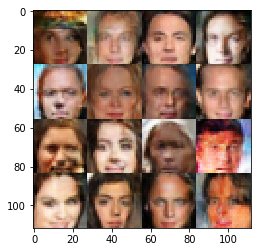

Epoch 6/10... Discriminator Loss: 1.5001... Generator Loss: 0.6700
Epoch 6/10... Discriminator Loss: 1.3108... Generator Loss: 0.7331
Epoch 6/10... Discriminator Loss: 1.3183... Generator Loss: 0.6619
Epoch 6/10... Discriminator Loss: 1.3001... Generator Loss: 1.0191
Epoch 6/10... Discriminator Loss: 1.3185... Generator Loss: 0.9709
Epoch 6/10... Discriminator Loss: 1.2744... Generator Loss: 0.6245
Epoch 6/10... Discriminator Loss: 1.3437... Generator Loss: 1.1479
Epoch 6/10... Discriminator Loss: 1.3320... Generator Loss: 0.8100
Epoch 6/10... Discriminator Loss: 1.3128... Generator Loss: 1.0032
Epoch 6/10... Discriminator Loss: 1.2717... Generator Loss: 0.9285
<class 'numpy.ndarray'>


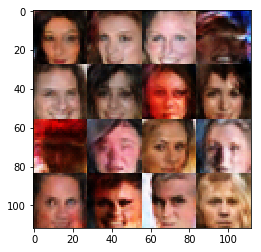

Epoch 6/10... Discriminator Loss: 1.3578... Generator Loss: 0.9368
Epoch 6/10... Discriminator Loss: 1.2540... Generator Loss: 0.7961
Epoch 6/10... Discriminator Loss: 1.2812... Generator Loss: 0.6847
Epoch 6/10... Discriminator Loss: 1.3873... Generator Loss: 0.8550
Epoch 6/10... Discriminator Loss: 1.3284... Generator Loss: 0.9179
Epoch 6/10... Discriminator Loss: 1.2842... Generator Loss: 0.8340
Epoch 6/10... Discriminator Loss: 1.3486... Generator Loss: 0.9343
Epoch 6/10... Discriminator Loss: 1.2895... Generator Loss: 0.8477
Epoch 6/10... Discriminator Loss: 1.3736... Generator Loss: 0.7679
Epoch 6/10... Discriminator Loss: 1.3111... Generator Loss: 0.9249
<class 'numpy.ndarray'>


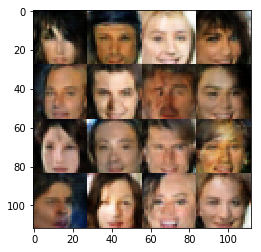

Epoch 6/10... Discriminator Loss: 1.4006... Generator Loss: 0.8098
Epoch 6/10... Discriminator Loss: 1.3231... Generator Loss: 0.7796
Epoch 6/10... Discriminator Loss: 1.2146... Generator Loss: 0.7567
Epoch 6/10... Discriminator Loss: 1.2951... Generator Loss: 0.9749
Epoch 6/10... Discriminator Loss: 1.3505... Generator Loss: 0.8144
Epoch 6/10... Discriminator Loss: 1.3455... Generator Loss: 0.9767
Epoch 6/10... Discriminator Loss: 1.2969... Generator Loss: 0.7984
Epoch 6/10... Discriminator Loss: 1.3063... Generator Loss: 0.9643
Epoch 6/10... Discriminator Loss: 1.4490... Generator Loss: 0.7602
Epoch 6/10... Discriminator Loss: 1.3003... Generator Loss: 0.9307
<class 'numpy.ndarray'>


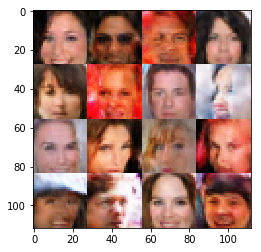

Epoch 6/10... Discriminator Loss: 1.2843... Generator Loss: 0.9232
Epoch 6/10... Discriminator Loss: 1.3650... Generator Loss: 0.7047
Epoch 6/10... Discriminator Loss: 1.3304... Generator Loss: 1.0973
Epoch 6/10... Discriminator Loss: 1.2713... Generator Loss: 0.8022
Epoch 6/10... Discriminator Loss: 1.3911... Generator Loss: 0.8309
Epoch 6/10... Discriminator Loss: 1.3734... Generator Loss: 0.8636
Epoch 6/10... Discriminator Loss: 1.3550... Generator Loss: 0.9841
Epoch 6/10... Discriminator Loss: 1.2934... Generator Loss: 0.8505
Epoch 6/10... Discriminator Loss: 1.3247... Generator Loss: 1.0058
Epoch 6/10... Discriminator Loss: 1.3068... Generator Loss: 0.8289
<class 'numpy.ndarray'>


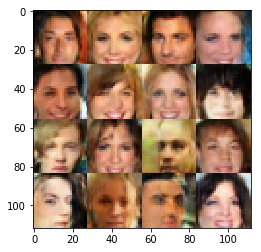

Epoch 6/10... Discriminator Loss: 1.3082... Generator Loss: 0.8645
Epoch 6/10... Discriminator Loss: 1.2844... Generator Loss: 0.7889
Epoch 6/10... Discriminator Loss: 1.3163... Generator Loss: 0.8318
Epoch 6/10... Discriminator Loss: 1.3377... Generator Loss: 1.0138
Epoch 6/10... Discriminator Loss: 1.3323... Generator Loss: 0.9051
Epoch 6/10... Discriminator Loss: 1.2984... Generator Loss: 0.8662
Epoch 6/10... Discriminator Loss: 1.2836... Generator Loss: 0.8010
Epoch 6/10... Discriminator Loss: 1.2616... Generator Loss: 0.7766
Epoch 6/10... Discriminator Loss: 1.4475... Generator Loss: 0.7549
Epoch 6/10... Discriminator Loss: 1.3295... Generator Loss: 0.8519
<class 'numpy.ndarray'>


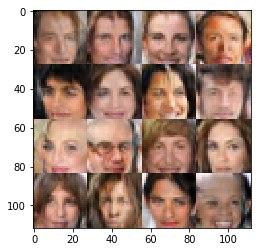

Epoch 6/10... Discriminator Loss: 1.2524... Generator Loss: 0.7850
Epoch 6/10... Discriminator Loss: 1.2813... Generator Loss: 0.9301
Epoch 6/10... Discriminator Loss: 1.3036... Generator Loss: 0.7586
Epoch 6/10... Discriminator Loss: 1.3694... Generator Loss: 0.9391
Epoch 6/10... Discriminator Loss: 1.3619... Generator Loss: 0.8236
Epoch 6/10... Discriminator Loss: 1.3364... Generator Loss: 0.9682
Epoch 6/10... Discriminator Loss: 1.2729... Generator Loss: 0.8421
Epoch 6/10... Discriminator Loss: 1.2818... Generator Loss: 1.1352
Epoch 6/10... Discriminator Loss: 1.3781... Generator Loss: 0.7628
Epoch 6/10... Discriminator Loss: 1.3999... Generator Loss: 0.8613
<class 'numpy.ndarray'>


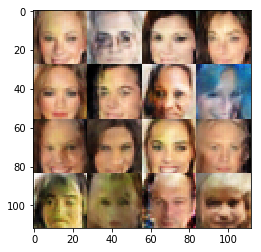

Epoch 6/10... Discriminator Loss: 1.2439... Generator Loss: 0.7857
Epoch 6/10... Discriminator Loss: 1.3399... Generator Loss: 0.6429
Epoch 6/10... Discriminator Loss: 1.3367... Generator Loss: 0.9208
Epoch 6/10... Discriminator Loss: 1.2705... Generator Loss: 0.9403
Epoch 6/10... Discriminator Loss: 1.3540... Generator Loss: 0.7914
Epoch 6/10... Discriminator Loss: 1.3265... Generator Loss: 0.8682
Epoch 6/10... Discriminator Loss: 1.2968... Generator Loss: 0.8764
Epoch 6/10... Discriminator Loss: 1.2775... Generator Loss: 0.9020
Epoch 6/10... Discriminator Loss: 1.2981... Generator Loss: 0.9850
Epoch 6/10... Discriminator Loss: 1.4180... Generator Loss: 0.8086
<class 'numpy.ndarray'>


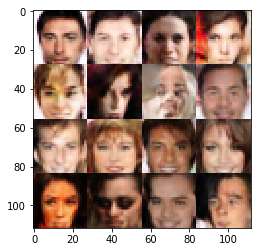

Epoch 6/10... Discriminator Loss: 1.3504... Generator Loss: 0.7362
Epoch 6/10... Discriminator Loss: 1.3173... Generator Loss: 0.9213
Epoch 6/10... Discriminator Loss: 1.2939... Generator Loss: 0.8120
Epoch 6/10... Discriminator Loss: 1.3361... Generator Loss: 0.8473
Epoch 6/10... Discriminator Loss: 1.1840... Generator Loss: 0.8648
Epoch 6/10... Discriminator Loss: 1.3383... Generator Loss: 0.9958
Epoch 6/10... Discriminator Loss: 1.3113... Generator Loss: 0.9622
Epoch 6/10... Discriminator Loss: 1.2933... Generator Loss: 0.7576
Epoch 6/10... Discriminator Loss: 1.2919... Generator Loss: 0.9738
Epoch 6/10... Discriminator Loss: 1.2814... Generator Loss: 0.9799
<class 'numpy.ndarray'>


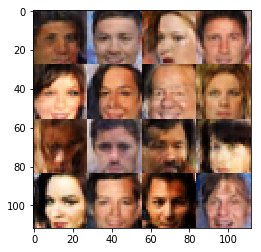

Epoch 6/10... Discriminator Loss: 1.4040... Generator Loss: 0.6906
Epoch 6/10... Discriminator Loss: 1.3615... Generator Loss: 1.1615
Epoch 6/10... Discriminator Loss: 1.2766... Generator Loss: 0.9312
Epoch 6/10... Discriminator Loss: 1.4728... Generator Loss: 0.7979
Epoch 6/10... Discriminator Loss: 1.2584... Generator Loss: 0.8050
Epoch 6/10... Discriminator Loss: 1.2832... Generator Loss: 0.8438
Epoch 6/10... Discriminator Loss: 1.2187... Generator Loss: 0.9082
Epoch 6/10... Discriminator Loss: 1.2993... Generator Loss: 0.9883
Epoch 6/10... Discriminator Loss: 1.3572... Generator Loss: 0.7823
Epoch 6/10... Discriminator Loss: 1.2792... Generator Loss: 0.8820
<class 'numpy.ndarray'>


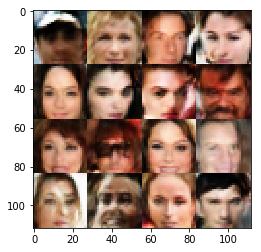

Epoch 6/10... Discriminator Loss: 1.3074... Generator Loss: 0.7943
Epoch 6/10... Discriminator Loss: 1.4256... Generator Loss: 0.8334
Epoch 6/10... Discriminator Loss: 1.3428... Generator Loss: 1.0393
Epoch 6/10... Discriminator Loss: 1.2111... Generator Loss: 1.0282
Epoch 6/10... Discriminator Loss: 1.1978... Generator Loss: 0.8454
Epoch 6/10... Discriminator Loss: 1.3177... Generator Loss: 0.8950
Epoch 6/10... Discriminator Loss: 1.2633... Generator Loss: 0.9705
Epoch 6/10... Discriminator Loss: 1.2313... Generator Loss: 0.8958
Epoch 6/10... Discriminator Loss: 1.2936... Generator Loss: 0.9472
Epoch 6/10... Discriminator Loss: 1.2402... Generator Loss: 0.8732
<class 'numpy.ndarray'>


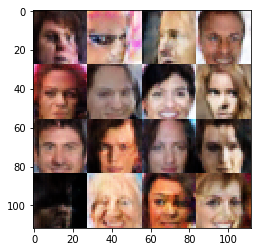

Epoch 6/10... Discriminator Loss: 1.3997... Generator Loss: 0.9094
Epoch 6/10... Discriminator Loss: 1.2873... Generator Loss: 0.8459
Epoch 6/10... Discriminator Loss: 1.2949... Generator Loss: 0.8524
Epoch 6/10... Discriminator Loss: 1.3180... Generator Loss: 0.8808
Epoch 6/10... Discriminator Loss: 1.3143... Generator Loss: 1.1313
Epoch 6/10... Discriminator Loss: 1.2954... Generator Loss: 1.0784
Epoch 6/10... Discriminator Loss: 1.3017... Generator Loss: 0.9628
Epoch 6/10... Discriminator Loss: 1.3397... Generator Loss: 1.0386
Epoch 6/10... Discriminator Loss: 1.3439... Generator Loss: 0.8305
Epoch 6/10... Discriminator Loss: 1.2708... Generator Loss: 0.9380
<class 'numpy.ndarray'>


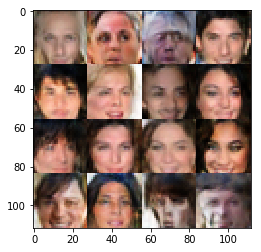

Epoch 6/10... Discriminator Loss: 1.2611... Generator Loss: 0.8148
Epoch 6/10... Discriminator Loss: 1.3205... Generator Loss: 0.8806
Epoch 6/10... Discriminator Loss: 1.2762... Generator Loss: 0.8481
Epoch 6/10... Discriminator Loss: 1.3679... Generator Loss: 0.7769
Epoch 6/10... Discriminator Loss: 1.6154... Generator Loss: 0.5366
Epoch 6/10... Discriminator Loss: 1.2430... Generator Loss: 0.8673
Epoch 6/10... Discriminator Loss: 1.1681... Generator Loss: 0.9145
Epoch 6/10... Discriminator Loss: 1.2930... Generator Loss: 0.7402
Epoch 6/10... Discriminator Loss: 1.2954... Generator Loss: 0.9655
Epoch 6/10... Discriminator Loss: 1.2679... Generator Loss: 0.9880
<class 'numpy.ndarray'>


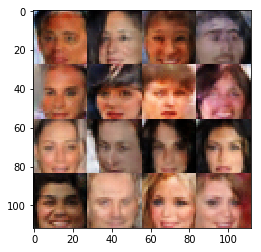

Epoch 6/10... Discriminator Loss: 1.1960... Generator Loss: 1.0574
Epoch 6/10... Discriminator Loss: 1.2708... Generator Loss: 0.9878
Epoch 6/10... Discriminator Loss: 1.2668... Generator Loss: 1.0279
Epoch 6/10... Discriminator Loss: 1.3396... Generator Loss: 1.0643
Epoch 6/10... Discriminator Loss: 1.2188... Generator Loss: 0.9535
Epoch 6/10... Discriminator Loss: 1.2427... Generator Loss: 0.8756
Epoch 6/10... Discriminator Loss: 1.2781... Generator Loss: 0.8067
Epoch 6/10... Discriminator Loss: 1.2603... Generator Loss: 0.9422
Epoch 6/10... Discriminator Loss: 1.3245... Generator Loss: 0.9022
Epoch 6/10... Discriminator Loss: 1.2506... Generator Loss: 1.0940
<class 'numpy.ndarray'>


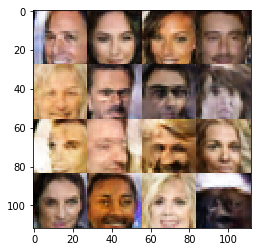

Epoch 6/10... Discriminator Loss: 1.2828... Generator Loss: 0.9454
Epoch 6/10... Discriminator Loss: 1.2674... Generator Loss: 0.9998
Epoch 6/10... Discriminator Loss: 1.2080... Generator Loss: 0.7981
Epoch 6/10... Discriminator Loss: 1.1387... Generator Loss: 1.0440
Epoch 6/10... Discriminator Loss: 1.2632... Generator Loss: 0.8321
Epoch 6/10... Discriminator Loss: 1.2730... Generator Loss: 0.7670
Epoch 6/10... Discriminator Loss: 1.3341... Generator Loss: 0.6648
Epoch 6/10... Discriminator Loss: 1.1620... Generator Loss: 0.9223
Epoch 6/10... Discriminator Loss: 1.2459... Generator Loss: 0.8881
Epoch 6/10... Discriminator Loss: 1.2925... Generator Loss: 0.8135
<class 'numpy.ndarray'>


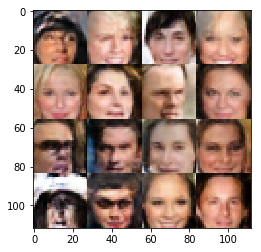

Epoch 6/10... Discriminator Loss: 1.2775... Generator Loss: 0.7875
Epoch 6/10... Discriminator Loss: 1.2454... Generator Loss: 0.9076
Epoch 6/10... Discriminator Loss: 1.3023... Generator Loss: 1.0245
Epoch 6/10... Discriminator Loss: 1.2993... Generator Loss: 0.9543
Epoch 6/10... Discriminator Loss: 1.2401... Generator Loss: 0.7929
Epoch 6/10... Discriminator Loss: 1.2622... Generator Loss: 0.8027
Epoch 6/10... Discriminator Loss: 1.2890... Generator Loss: 1.0331
Epoch 6/10... Discriminator Loss: 1.2494... Generator Loss: 1.0485
Epoch 6/10... Discriminator Loss: 1.2533... Generator Loss: 0.8149
Epoch 7/10... Discriminator Loss: 1.2906... Generator Loss: 1.0545
<class 'numpy.ndarray'>


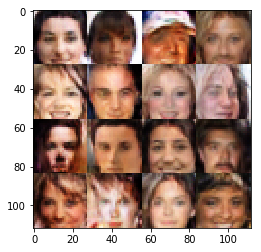

Epoch 7/10... Discriminator Loss: 1.2310... Generator Loss: 0.8844
Epoch 7/10... Discriminator Loss: 1.2715... Generator Loss: 1.0202
Epoch 7/10... Discriminator Loss: 1.1304... Generator Loss: 1.0213
Epoch 7/10... Discriminator Loss: 1.2633... Generator Loss: 0.9278
Epoch 7/10... Discriminator Loss: 1.2211... Generator Loss: 0.9339
Epoch 7/10... Discriminator Loss: 1.1805... Generator Loss: 1.0253
Epoch 7/10... Discriminator Loss: 1.2410... Generator Loss: 0.9559
Epoch 7/10... Discriminator Loss: 1.1350... Generator Loss: 1.1032
Epoch 7/10... Discriminator Loss: 1.3299... Generator Loss: 1.0892
Epoch 7/10... Discriminator Loss: 1.2243... Generator Loss: 1.0804
<class 'numpy.ndarray'>


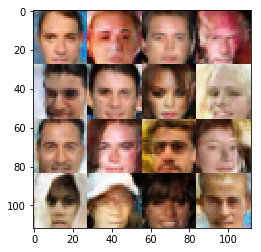

Epoch 7/10... Discriminator Loss: 1.2212... Generator Loss: 0.9954
Epoch 7/10... Discriminator Loss: 1.2227... Generator Loss: 0.9415
Epoch 7/10... Discriminator Loss: 1.2869... Generator Loss: 0.8234
Epoch 7/10... Discriminator Loss: 1.2882... Generator Loss: 0.9086
Epoch 7/10... Discriminator Loss: 1.2393... Generator Loss: 0.9025
Epoch 7/10... Discriminator Loss: 1.2667... Generator Loss: 0.8140
Epoch 7/10... Discriminator Loss: 1.3343... Generator Loss: 0.8397
Epoch 7/10... Discriminator Loss: 1.2532... Generator Loss: 0.8873
Epoch 7/10... Discriminator Loss: 1.2890... Generator Loss: 0.8419
Epoch 7/10... Discriminator Loss: 1.2171... Generator Loss: 1.1016
<class 'numpy.ndarray'>


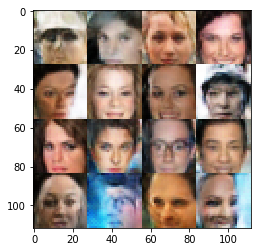

Epoch 7/10... Discriminator Loss: 1.1649... Generator Loss: 0.8973
Epoch 7/10... Discriminator Loss: 1.2788... Generator Loss: 1.2077
Epoch 7/10... Discriminator Loss: 1.2402... Generator Loss: 1.0289
Epoch 7/10... Discriminator Loss: 1.2523... Generator Loss: 1.0009
Epoch 7/10... Discriminator Loss: 1.2126... Generator Loss: 0.9740
Epoch 7/10... Discriminator Loss: 1.3385... Generator Loss: 0.8427
Epoch 7/10... Discriminator Loss: 1.3068... Generator Loss: 1.0307
Epoch 7/10... Discriminator Loss: 1.2001... Generator Loss: 1.1837
Epoch 7/10... Discriminator Loss: 1.1837... Generator Loss: 1.0418
Epoch 7/10... Discriminator Loss: 1.3780... Generator Loss: 0.9208
<class 'numpy.ndarray'>


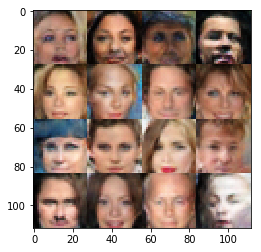

Epoch 7/10... Discriminator Loss: 1.2614... Generator Loss: 0.8581
Epoch 7/10... Discriminator Loss: 1.1916... Generator Loss: 1.0128
Epoch 7/10... Discriminator Loss: 1.2299... Generator Loss: 1.0124
Epoch 7/10... Discriminator Loss: 1.2538... Generator Loss: 0.8056
Epoch 7/10... Discriminator Loss: 1.3765... Generator Loss: 1.0917
Epoch 7/10... Discriminator Loss: 1.1987... Generator Loss: 1.1024
Epoch 7/10... Discriminator Loss: 1.2695... Generator Loss: 0.8997
Epoch 7/10... Discriminator Loss: 1.2713... Generator Loss: 0.7054
Epoch 7/10... Discriminator Loss: 1.3642... Generator Loss: 1.1009
Epoch 7/10... Discriminator Loss: 1.2184... Generator Loss: 1.0004
<class 'numpy.ndarray'>


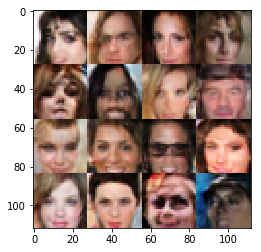

Epoch 7/10... Discriminator Loss: 1.3181... Generator Loss: 0.8549
Epoch 7/10... Discriminator Loss: 1.2574... Generator Loss: 0.9887
Epoch 7/10... Discriminator Loss: 1.2036... Generator Loss: 0.8635
Epoch 7/10... Discriminator Loss: 1.1752... Generator Loss: 0.8302
Epoch 7/10... Discriminator Loss: 1.1861... Generator Loss: 0.9695
Epoch 7/10... Discriminator Loss: 1.2640... Generator Loss: 0.9404
Epoch 7/10... Discriminator Loss: 1.2387... Generator Loss: 1.1173
Epoch 7/10... Discriminator Loss: 1.2412... Generator Loss: 0.8180
Epoch 7/10... Discriminator Loss: 1.2906... Generator Loss: 0.9117
Epoch 7/10... Discriminator Loss: 1.2084... Generator Loss: 0.9273
<class 'numpy.ndarray'>


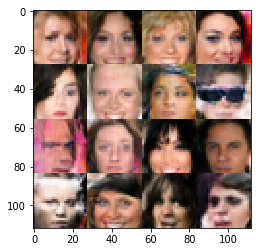

Epoch 7/10... Discriminator Loss: 1.1688... Generator Loss: 0.9980
Epoch 7/10... Discriminator Loss: 1.2542... Generator Loss: 0.8611
Epoch 7/10... Discriminator Loss: 1.2886... Generator Loss: 0.9462
Epoch 7/10... Discriminator Loss: 1.2569... Generator Loss: 0.9218
Epoch 7/10... Discriminator Loss: 1.1482... Generator Loss: 0.9806
Epoch 7/10... Discriminator Loss: 1.2918... Generator Loss: 1.0375
Epoch 7/10... Discriminator Loss: 1.2327... Generator Loss: 1.0540
Epoch 7/10... Discriminator Loss: 1.2678... Generator Loss: 0.9566
Epoch 7/10... Discriminator Loss: 1.1785... Generator Loss: 0.9952
Epoch 7/10... Discriminator Loss: 1.1494... Generator Loss: 1.0001
<class 'numpy.ndarray'>


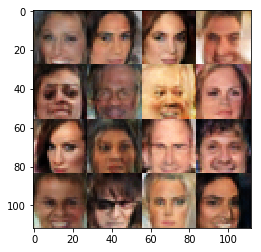

Epoch 7/10... Discriminator Loss: 1.2495... Generator Loss: 0.9731
Epoch 7/10... Discriminator Loss: 1.2295... Generator Loss: 0.8664
Epoch 7/10... Discriminator Loss: 1.2460... Generator Loss: 0.8317
Epoch 7/10... Discriminator Loss: 1.2739... Generator Loss: 0.8517
Epoch 7/10... Discriminator Loss: 1.2377... Generator Loss: 0.9958
Epoch 7/10... Discriminator Loss: 1.3244... Generator Loss: 0.7877
Epoch 7/10... Discriminator Loss: 1.1253... Generator Loss: 1.0247
Epoch 7/10... Discriminator Loss: 1.2674... Generator Loss: 0.8733
Epoch 7/10... Discriminator Loss: 1.2507... Generator Loss: 0.9290
Epoch 7/10... Discriminator Loss: 1.2600... Generator Loss: 0.7789
<class 'numpy.ndarray'>


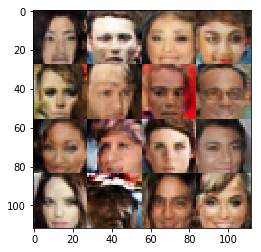

Epoch 7/10... Discriminator Loss: 1.3096... Generator Loss: 0.8769
Epoch 7/10... Discriminator Loss: 1.2432... Generator Loss: 0.9239
Epoch 7/10... Discriminator Loss: 1.2531... Generator Loss: 0.8961
Epoch 7/10... Discriminator Loss: 1.3156... Generator Loss: 0.9865
Epoch 7/10... Discriminator Loss: 1.1812... Generator Loss: 0.8858
Epoch 7/10... Discriminator Loss: 1.1952... Generator Loss: 0.8001
Epoch 7/10... Discriminator Loss: 1.2996... Generator Loss: 1.1252
Epoch 7/10... Discriminator Loss: 1.2580... Generator Loss: 0.8540
Epoch 7/10... Discriminator Loss: 1.2326... Generator Loss: 1.0417
Epoch 7/10... Discriminator Loss: 1.2089... Generator Loss: 0.9089
<class 'numpy.ndarray'>


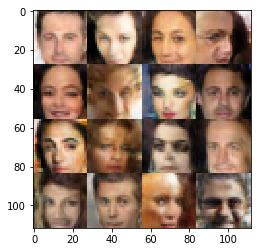

Epoch 7/10... Discriminator Loss: 1.3537... Generator Loss: 0.6781
Epoch 7/10... Discriminator Loss: 1.2428... Generator Loss: 0.9369
Epoch 7/10... Discriminator Loss: 1.2712... Generator Loss: 0.8472
Epoch 7/10... Discriminator Loss: 1.4587... Generator Loss: 0.7123
Epoch 7/10... Discriminator Loss: 1.2652... Generator Loss: 1.0187
Epoch 7/10... Discriminator Loss: 1.3199... Generator Loss: 1.0784
Epoch 7/10... Discriminator Loss: 1.2792... Generator Loss: 0.9074
Epoch 7/10... Discriminator Loss: 1.5248... Generator Loss: 0.6145
Epoch 7/10... Discriminator Loss: 1.2487... Generator Loss: 1.1633
Epoch 7/10... Discriminator Loss: 1.1971... Generator Loss: 1.0261
<class 'numpy.ndarray'>


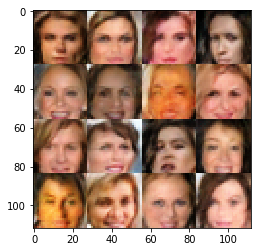

Epoch 7/10... Discriminator Loss: 1.1740... Generator Loss: 0.9517
Epoch 7/10... Discriminator Loss: 1.2794... Generator Loss: 1.4101
Epoch 7/10... Discriminator Loss: 1.1275... Generator Loss: 1.2243
Epoch 7/10... Discriminator Loss: 1.2189... Generator Loss: 0.8437
Epoch 7/10... Discriminator Loss: 1.2353... Generator Loss: 0.7399
Epoch 7/10... Discriminator Loss: 1.2402... Generator Loss: 0.9582
Epoch 7/10... Discriminator Loss: 1.0886... Generator Loss: 1.2591
Epoch 7/10... Discriminator Loss: 1.1258... Generator Loss: 1.1025
Epoch 7/10... Discriminator Loss: 1.3368... Generator Loss: 0.7954
Epoch 7/10... Discriminator Loss: 1.2738... Generator Loss: 0.8792
<class 'numpy.ndarray'>


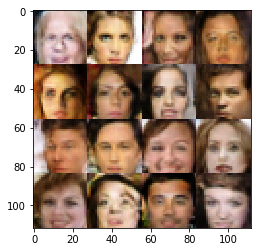

Epoch 7/10... Discriminator Loss: 1.2545... Generator Loss: 0.9699
Epoch 7/10... Discriminator Loss: 1.1590... Generator Loss: 1.1097
Epoch 7/10... Discriminator Loss: 1.1275... Generator Loss: 1.0230
Epoch 7/10... Discriminator Loss: 1.2995... Generator Loss: 0.9753
Epoch 7/10... Discriminator Loss: 1.3378... Generator Loss: 0.8771
Epoch 7/10... Discriminator Loss: 1.3358... Generator Loss: 1.0992
Epoch 7/10... Discriminator Loss: 1.2820... Generator Loss: 0.9075
Epoch 7/10... Discriminator Loss: 1.3054... Generator Loss: 0.8623
Epoch 7/10... Discriminator Loss: 1.1605... Generator Loss: 0.9522
Epoch 7/10... Discriminator Loss: 1.2724... Generator Loss: 0.8632
<class 'numpy.ndarray'>


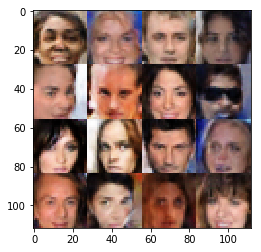

Epoch 7/10... Discriminator Loss: 1.1262... Generator Loss: 0.9787
Epoch 7/10... Discriminator Loss: 1.0278... Generator Loss: 1.0878
Epoch 7/10... Discriminator Loss: 1.1350... Generator Loss: 0.9818
Epoch 7/10... Discriminator Loss: 1.1912... Generator Loss: 1.0002
Epoch 7/10... Discriminator Loss: 1.3082... Generator Loss: 0.9445
Epoch 7/10... Discriminator Loss: 1.2617... Generator Loss: 0.6667
Epoch 7/10... Discriminator Loss: 1.0642... Generator Loss: 1.2599
Epoch 7/10... Discriminator Loss: 1.1202... Generator Loss: 1.0536
Epoch 7/10... Discriminator Loss: 1.2347... Generator Loss: 1.0955
Epoch 7/10... Discriminator Loss: 1.1969... Generator Loss: 1.0127
<class 'numpy.ndarray'>


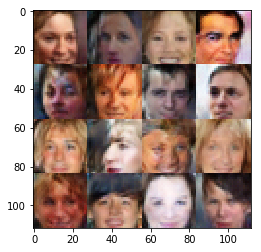

Epoch 7/10... Discriminator Loss: 1.3170... Generator Loss: 0.8881
Epoch 7/10... Discriminator Loss: 1.3430... Generator Loss: 0.7747
Epoch 7/10... Discriminator Loss: 1.2928... Generator Loss: 0.8232
Epoch 7/10... Discriminator Loss: 1.2790... Generator Loss: 1.0483
Epoch 7/10... Discriminator Loss: 1.1580... Generator Loss: 1.0181
Epoch 7/10... Discriminator Loss: 1.1186... Generator Loss: 0.9055
Epoch 7/10... Discriminator Loss: 1.2557... Generator Loss: 1.0325
Epoch 7/10... Discriminator Loss: 1.1043... Generator Loss: 0.9516
Epoch 7/10... Discriminator Loss: 1.1764... Generator Loss: 1.0271
Epoch 7/10... Discriminator Loss: 1.2546... Generator Loss: 1.2404
<class 'numpy.ndarray'>


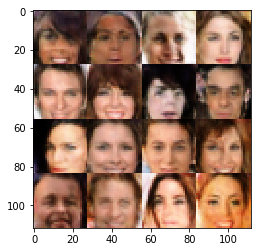

Epoch 7/10... Discriminator Loss: 1.2571... Generator Loss: 1.0455
Epoch 7/10... Discriminator Loss: 1.1368... Generator Loss: 1.2100
Epoch 7/10... Discriminator Loss: 1.3354... Generator Loss: 1.3049
Epoch 7/10... Discriminator Loss: 1.0586... Generator Loss: 1.1716
Epoch 7/10... Discriminator Loss: 1.1005... Generator Loss: 1.3784
Epoch 7/10... Discriminator Loss: 1.1650... Generator Loss: 1.1211
Epoch 7/10... Discriminator Loss: 1.3994... Generator Loss: 0.7357
Epoch 7/10... Discriminator Loss: 1.0640... Generator Loss: 1.3245
Epoch 7/10... Discriminator Loss: 1.3846... Generator Loss: 0.8203
Epoch 7/10... Discriminator Loss: 1.3055... Generator Loss: 0.9354
<class 'numpy.ndarray'>


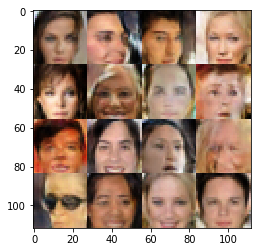

Epoch 7/10... Discriminator Loss: 1.2091... Generator Loss: 0.8230
Epoch 7/10... Discriminator Loss: 1.1493... Generator Loss: 1.0035
Epoch 7/10... Discriminator Loss: 1.1800... Generator Loss: 1.0589
Epoch 7/10... Discriminator Loss: 1.0241... Generator Loss: 1.1324
Epoch 7/10... Discriminator Loss: 1.2893... Generator Loss: 1.0805
Epoch 7/10... Discriminator Loss: 1.1624... Generator Loss: 1.0105
Epoch 7/10... Discriminator Loss: 1.1159... Generator Loss: 1.0353
Epoch 7/10... Discriminator Loss: 1.0654... Generator Loss: 0.9628
Epoch 7/10... Discriminator Loss: 1.0409... Generator Loss: 1.4204
Epoch 7/10... Discriminator Loss: 1.2066... Generator Loss: 1.2231
<class 'numpy.ndarray'>


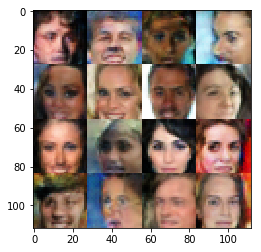

Epoch 7/10... Discriminator Loss: 1.2325... Generator Loss: 1.0915
Epoch 7/10... Discriminator Loss: 1.0850... Generator Loss: 1.0554
Epoch 7/10... Discriminator Loss: 1.2027... Generator Loss: 1.1586
Epoch 7/10... Discriminator Loss: 1.2861... Generator Loss: 1.0678
Epoch 7/10... Discriminator Loss: 1.1352... Generator Loss: 1.3485
Epoch 7/10... Discriminator Loss: 1.2379... Generator Loss: 0.9939
Epoch 7/10... Discriminator Loss: 1.2298... Generator Loss: 0.8826
Epoch 8/10... Discriminator Loss: 1.2929... Generator Loss: 0.9071
Epoch 8/10... Discriminator Loss: 1.0978... Generator Loss: 1.3362
Epoch 8/10... Discriminator Loss: 1.1456... Generator Loss: 1.0299
<class 'numpy.ndarray'>


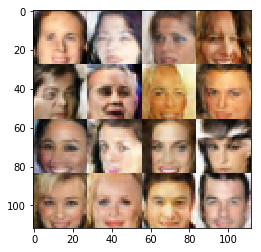

Epoch 8/10... Discriminator Loss: 1.3330... Generator Loss: 1.1913
Epoch 8/10... Discriminator Loss: 1.1575... Generator Loss: 0.8237
Epoch 8/10... Discriminator Loss: 1.2808... Generator Loss: 1.1360
Epoch 8/10... Discriminator Loss: 1.2572... Generator Loss: 1.0710
Epoch 8/10... Discriminator Loss: 1.1397... Generator Loss: 0.9912
Epoch 8/10... Discriminator Loss: 1.1263... Generator Loss: 1.0965
Epoch 8/10... Discriminator Loss: 1.2310... Generator Loss: 0.9573
Epoch 8/10... Discriminator Loss: 1.0726... Generator Loss: 1.2301
Epoch 8/10... Discriminator Loss: 1.1899... Generator Loss: 1.2479
Epoch 8/10... Discriminator Loss: 1.1674... Generator Loss: 1.1670
<class 'numpy.ndarray'>


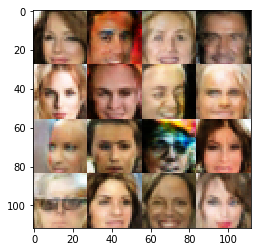

Epoch 8/10... Discriminator Loss: 1.1513... Generator Loss: 0.9114
Epoch 8/10... Discriminator Loss: 1.1040... Generator Loss: 1.0794
Epoch 8/10... Discriminator Loss: 1.3501... Generator Loss: 0.7459
Epoch 8/10... Discriminator Loss: 1.4267... Generator Loss: 0.8067
Epoch 8/10... Discriminator Loss: 1.2806... Generator Loss: 1.1753
Epoch 8/10... Discriminator Loss: 1.3397... Generator Loss: 0.9736
Epoch 8/10... Discriminator Loss: 1.2271... Generator Loss: 1.3229
Epoch 8/10... Discriminator Loss: 1.1201... Generator Loss: 0.8310
Epoch 8/10... Discriminator Loss: 1.0902... Generator Loss: 0.9719
Epoch 8/10... Discriminator Loss: 1.1755... Generator Loss: 0.7960
<class 'numpy.ndarray'>


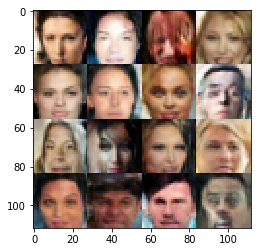

Epoch 8/10... Discriminator Loss: 1.1120... Generator Loss: 0.8984
Epoch 8/10... Discriminator Loss: 1.4208... Generator Loss: 0.6358
Epoch 8/10... Discriminator Loss: 1.1141... Generator Loss: 1.0170
Epoch 8/10... Discriminator Loss: 1.0378... Generator Loss: 1.3434
Epoch 8/10... Discriminator Loss: 1.2758... Generator Loss: 0.8966
Epoch 8/10... Discriminator Loss: 1.1224... Generator Loss: 1.0561
Epoch 8/10... Discriminator Loss: 1.1892... Generator Loss: 0.7463
Epoch 8/10... Discriminator Loss: 1.1858... Generator Loss: 1.4539
Epoch 8/10... Discriminator Loss: 1.1883... Generator Loss: 0.8951
Epoch 8/10... Discriminator Loss: 1.2031... Generator Loss: 0.9987
<class 'numpy.ndarray'>


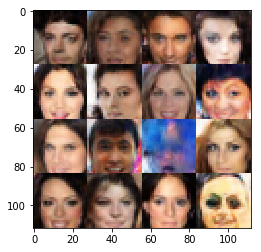

Epoch 8/10... Discriminator Loss: 1.3086... Generator Loss: 1.2102
Epoch 8/10... Discriminator Loss: 1.1868... Generator Loss: 0.9471
Epoch 8/10... Discriminator Loss: 1.4066... Generator Loss: 0.6445
Epoch 8/10... Discriminator Loss: 1.0478... Generator Loss: 1.2877
Epoch 8/10... Discriminator Loss: 1.4431... Generator Loss: 0.7349
Epoch 8/10... Discriminator Loss: 1.2412... Generator Loss: 0.9317
Epoch 8/10... Discriminator Loss: 1.2127... Generator Loss: 0.9053
Epoch 8/10... Discriminator Loss: 1.1774... Generator Loss: 1.0061
Epoch 8/10... Discriminator Loss: 1.1799... Generator Loss: 1.1056
Epoch 8/10... Discriminator Loss: 1.0916... Generator Loss: 1.0936
<class 'numpy.ndarray'>


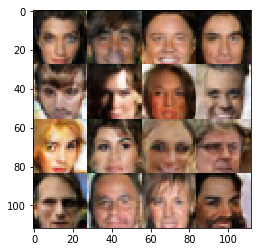

Epoch 8/10... Discriminator Loss: 0.9906... Generator Loss: 1.5369
Epoch 8/10... Discriminator Loss: 1.0532... Generator Loss: 1.0724
Epoch 8/10... Discriminator Loss: 1.1910... Generator Loss: 0.9051
Epoch 8/10... Discriminator Loss: 1.2241... Generator Loss: 1.2896
Epoch 8/10... Discriminator Loss: 1.2782... Generator Loss: 0.8036
Epoch 8/10... Discriminator Loss: 1.1569... Generator Loss: 1.0564
Epoch 8/10... Discriminator Loss: 1.1482... Generator Loss: 0.9315
Epoch 8/10... Discriminator Loss: 1.2547... Generator Loss: 0.8197
Epoch 8/10... Discriminator Loss: 1.2418... Generator Loss: 0.8675
Epoch 8/10... Discriminator Loss: 1.1042... Generator Loss: 0.9739
<class 'numpy.ndarray'>


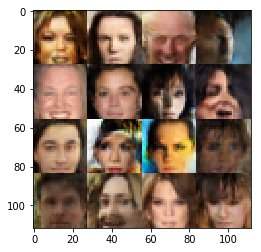

Epoch 8/10... Discriminator Loss: 1.2097... Generator Loss: 0.9207
Epoch 8/10... Discriminator Loss: 1.2161... Generator Loss: 0.8341
Epoch 8/10... Discriminator Loss: 1.1512... Generator Loss: 1.0481
Epoch 8/10... Discriminator Loss: 1.3784... Generator Loss: 0.8373
Epoch 8/10... Discriminator Loss: 1.1672... Generator Loss: 0.9327
Epoch 8/10... Discriminator Loss: 1.1306... Generator Loss: 1.0931
Epoch 8/10... Discriminator Loss: 1.0268... Generator Loss: 1.4198
Epoch 8/10... Discriminator Loss: 1.0881... Generator Loss: 1.2335
Epoch 8/10... Discriminator Loss: 1.2823... Generator Loss: 0.8793
Epoch 8/10... Discriminator Loss: 1.1088... Generator Loss: 1.3044
<class 'numpy.ndarray'>


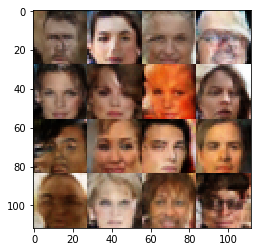

Epoch 8/10... Discriminator Loss: 1.1049... Generator Loss: 1.1307
Epoch 8/10... Discriminator Loss: 1.0895... Generator Loss: 1.2820
Epoch 8/10... Discriminator Loss: 1.1766... Generator Loss: 0.9757
Epoch 8/10... Discriminator Loss: 1.2798... Generator Loss: 1.0834
Epoch 8/10... Discriminator Loss: 1.1689... Generator Loss: 0.8901
Epoch 8/10... Discriminator Loss: 1.0829... Generator Loss: 1.1527
Epoch 8/10... Discriminator Loss: 1.0055... Generator Loss: 1.2694
Epoch 8/10... Discriminator Loss: 1.5681... Generator Loss: 0.5636
Epoch 8/10... Discriminator Loss: 1.3609... Generator Loss: 0.8200
Epoch 8/10... Discriminator Loss: 1.2213... Generator Loss: 1.0816
<class 'numpy.ndarray'>


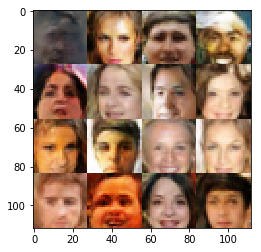

Epoch 8/10... Discriminator Loss: 1.0684... Generator Loss: 1.1847
Epoch 8/10... Discriminator Loss: 1.2169... Generator Loss: 0.9687
Epoch 8/10... Discriminator Loss: 1.1725... Generator Loss: 1.0507
Epoch 8/10... Discriminator Loss: 1.3938... Generator Loss: 0.6076
Epoch 8/10... Discriminator Loss: 1.1780... Generator Loss: 1.1490
Epoch 8/10... Discriminator Loss: 1.1470... Generator Loss: 1.2733
Epoch 8/10... Discriminator Loss: 1.3079... Generator Loss: 0.8493
Epoch 8/10... Discriminator Loss: 0.9398... Generator Loss: 1.2037
Epoch 8/10... Discriminator Loss: 1.1090... Generator Loss: 1.2234
Epoch 8/10... Discriminator Loss: 1.1206... Generator Loss: 0.9716
<class 'numpy.ndarray'>


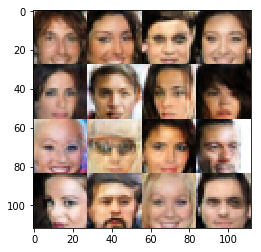

Epoch 8/10... Discriminator Loss: 1.1420... Generator Loss: 0.9910
Epoch 8/10... Discriminator Loss: 1.2633... Generator Loss: 1.0165
Epoch 8/10... Discriminator Loss: 1.2804... Generator Loss: 1.1681
Epoch 8/10... Discriminator Loss: 1.1819... Generator Loss: 1.0368
Epoch 8/10... Discriminator Loss: 1.1266... Generator Loss: 1.2032
Epoch 8/10... Discriminator Loss: 1.1400... Generator Loss: 1.2463
Epoch 8/10... Discriminator Loss: 1.3819... Generator Loss: 0.7701
Epoch 8/10... Discriminator Loss: 0.9390... Generator Loss: 1.5475
Epoch 8/10... Discriminator Loss: 1.1987... Generator Loss: 1.0227
Epoch 8/10... Discriminator Loss: 1.0928... Generator Loss: 1.1692
<class 'numpy.ndarray'>


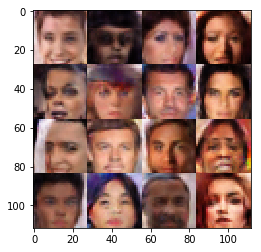

Epoch 8/10... Discriminator Loss: 1.2117... Generator Loss: 1.3970
Epoch 8/10... Discriminator Loss: 0.9949... Generator Loss: 1.1080
Epoch 8/10... Discriminator Loss: 1.1448... Generator Loss: 1.1394
Epoch 8/10... Discriminator Loss: 1.2043... Generator Loss: 1.2884
Epoch 8/10... Discriminator Loss: 1.1260... Generator Loss: 1.1053
Epoch 8/10... Discriminator Loss: 1.1419... Generator Loss: 1.1543
Epoch 8/10... Discriminator Loss: 0.9778... Generator Loss: 1.2275
Epoch 8/10... Discriminator Loss: 1.5102... Generator Loss: 0.7892
Epoch 8/10... Discriminator Loss: 1.2743... Generator Loss: 0.9404
Epoch 8/10... Discriminator Loss: 1.3348... Generator Loss: 1.0771
<class 'numpy.ndarray'>


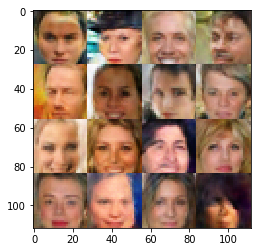

Epoch 8/10... Discriminator Loss: 1.2635... Generator Loss: 0.9659
Epoch 8/10... Discriminator Loss: 1.2127... Generator Loss: 1.2133
Epoch 8/10... Discriminator Loss: 1.2675... Generator Loss: 0.8836
Epoch 8/10... Discriminator Loss: 1.0554... Generator Loss: 1.1166
Epoch 8/10... Discriminator Loss: 1.0145... Generator Loss: 1.2158
Epoch 8/10... Discriminator Loss: 1.1454... Generator Loss: 1.0113
Epoch 8/10... Discriminator Loss: 1.1079... Generator Loss: 1.1053
Epoch 8/10... Discriminator Loss: 1.1648... Generator Loss: 1.1191
Epoch 8/10... Discriminator Loss: 1.0796... Generator Loss: 1.1252
Epoch 8/10... Discriminator Loss: 0.9285... Generator Loss: 1.5160
<class 'numpy.ndarray'>


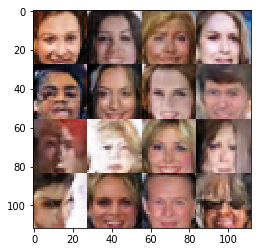

Epoch 8/10... Discriminator Loss: 1.0818... Generator Loss: 1.2559
Epoch 8/10... Discriminator Loss: 0.9961... Generator Loss: 1.1395
Epoch 8/10... Discriminator Loss: 1.1148... Generator Loss: 1.1586
Epoch 8/10... Discriminator Loss: 1.0408... Generator Loss: 1.1604
Epoch 8/10... Discriminator Loss: 1.0984... Generator Loss: 1.1617
Epoch 8/10... Discriminator Loss: 1.3454... Generator Loss: 0.9282
Epoch 8/10... Discriminator Loss: 1.1391... Generator Loss: 1.2116
Epoch 8/10... Discriminator Loss: 1.3056... Generator Loss: 0.8499
Epoch 8/10... Discriminator Loss: 1.2127... Generator Loss: 0.7173
Epoch 8/10... Discriminator Loss: 1.0913... Generator Loss: 1.0538
<class 'numpy.ndarray'>


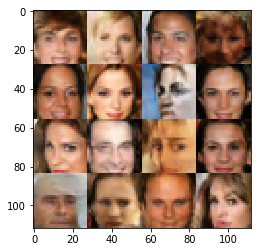

Epoch 8/10... Discriminator Loss: 1.1716... Generator Loss: 1.0084
Epoch 8/10... Discriminator Loss: 1.1796... Generator Loss: 0.9969
Epoch 8/10... Discriminator Loss: 1.0557... Generator Loss: 1.1232
Epoch 8/10... Discriminator Loss: 1.0438... Generator Loss: 1.2305
Epoch 8/10... Discriminator Loss: 1.3020... Generator Loss: 1.1057
Epoch 8/10... Discriminator Loss: 1.2188... Generator Loss: 1.0504
Epoch 8/10... Discriminator Loss: 1.1491... Generator Loss: 1.2028
Epoch 8/10... Discriminator Loss: 1.0721... Generator Loss: 1.4187
Epoch 8/10... Discriminator Loss: 1.3610... Generator Loss: 0.8946
Epoch 8/10... Discriminator Loss: 1.1724... Generator Loss: 1.1952
<class 'numpy.ndarray'>


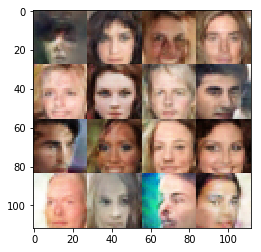

Epoch 8/10... Discriminator Loss: 1.1864... Generator Loss: 1.0786
Epoch 8/10... Discriminator Loss: 1.0793... Generator Loss: 1.1825
Epoch 8/10... Discriminator Loss: 1.1351... Generator Loss: 1.2511
Epoch 8/10... Discriminator Loss: 1.1303... Generator Loss: 1.2363
Epoch 8/10... Discriminator Loss: 1.0170... Generator Loss: 1.1799
Epoch 8/10... Discriminator Loss: 1.1663... Generator Loss: 0.9522
Epoch 8/10... Discriminator Loss: 1.2243... Generator Loss: 0.9311
Epoch 8/10... Discriminator Loss: 1.1673... Generator Loss: 1.0399
Epoch 8/10... Discriminator Loss: 1.1352... Generator Loss: 1.1174
Epoch 8/10... Discriminator Loss: 0.9785... Generator Loss: 1.1596
<class 'numpy.ndarray'>


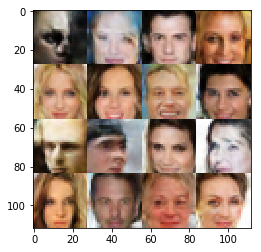

Epoch 8/10... Discriminator Loss: 1.3646... Generator Loss: 0.7142
Epoch 8/10... Discriminator Loss: 0.9789... Generator Loss: 1.2609
Epoch 8/10... Discriminator Loss: 1.1043... Generator Loss: 0.8137
Epoch 8/10... Discriminator Loss: 1.1539... Generator Loss: 0.8921
Epoch 8/10... Discriminator Loss: 1.0233... Generator Loss: 0.8733
Epoch 8/10... Discriminator Loss: 0.9825... Generator Loss: 1.3647
Epoch 8/10... Discriminator Loss: 0.9437... Generator Loss: 1.3051
Epoch 8/10... Discriminator Loss: 1.1434... Generator Loss: 0.9330
Epoch 8/10... Discriminator Loss: 1.4332... Generator Loss: 0.6938
Epoch 8/10... Discriminator Loss: 1.2862... Generator Loss: 1.9188
<class 'numpy.ndarray'>


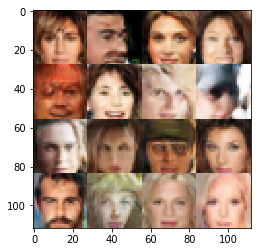

Epoch 8/10... Discriminator Loss: 1.0127... Generator Loss: 0.9667
Epoch 8/10... Discriminator Loss: 1.2372... Generator Loss: 0.7947
Epoch 8/10... Discriminator Loss: 0.9685... Generator Loss: 1.0441
Epoch 8/10... Discriminator Loss: 1.5548... Generator Loss: 0.5114
Epoch 8/10... Discriminator Loss: 1.0086... Generator Loss: 1.7896
Epoch 9/10... Discriminator Loss: 1.0512... Generator Loss: 1.1470
Epoch 9/10... Discriminator Loss: 1.1097... Generator Loss: 1.2721
Epoch 9/10... Discriminator Loss: 1.0862... Generator Loss: 1.2109
Epoch 9/10... Discriminator Loss: 1.1588... Generator Loss: 1.0452
Epoch 9/10... Discriminator Loss: 1.2289... Generator Loss: 0.9036
<class 'numpy.ndarray'>


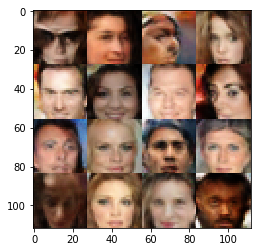

Epoch 9/10... Discriminator Loss: 1.0098... Generator Loss: 1.1626
Epoch 9/10... Discriminator Loss: 1.2067... Generator Loss: 0.9233
Epoch 9/10... Discriminator Loss: 1.2492... Generator Loss: 1.0145
Epoch 9/10... Discriminator Loss: 1.1992... Generator Loss: 1.0152
Epoch 9/10... Discriminator Loss: 1.0201... Generator Loss: 1.0631
Epoch 9/10... Discriminator Loss: 1.2430... Generator Loss: 0.9121
Epoch 9/10... Discriminator Loss: 1.2440... Generator Loss: 0.9931
Epoch 9/10... Discriminator Loss: 0.9636... Generator Loss: 1.0394
Epoch 9/10... Discriminator Loss: 1.0613... Generator Loss: 1.1955
Epoch 9/10... Discriminator Loss: 1.1240... Generator Loss: 1.0121
<class 'numpy.ndarray'>


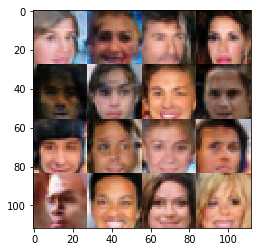

Epoch 9/10... Discriminator Loss: 1.2158... Generator Loss: 1.2656
Epoch 9/10... Discriminator Loss: 1.3312... Generator Loss: 1.0045
Epoch 9/10... Discriminator Loss: 1.2130... Generator Loss: 1.0165
Epoch 9/10... Discriminator Loss: 0.9088... Generator Loss: 1.3578
Epoch 9/10... Discriminator Loss: 1.1272... Generator Loss: 1.5320
Epoch 9/10... Discriminator Loss: 1.1881... Generator Loss: 0.8713
Epoch 9/10... Discriminator Loss: 1.3556... Generator Loss: 0.9495
Epoch 9/10... Discriminator Loss: 0.9349... Generator Loss: 1.4868
Epoch 9/10... Discriminator Loss: 1.3210... Generator Loss: 0.9786
Epoch 9/10... Discriminator Loss: 0.9206... Generator Loss: 1.3076
<class 'numpy.ndarray'>


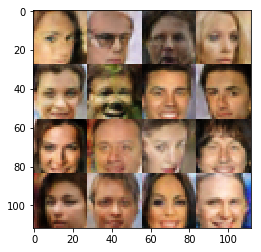

Epoch 9/10... Discriminator Loss: 1.3025... Generator Loss: 0.7853
Epoch 9/10... Discriminator Loss: 1.3525... Generator Loss: 0.8083
Epoch 9/10... Discriminator Loss: 1.0805... Generator Loss: 1.5618
Epoch 9/10... Discriminator Loss: 1.2938... Generator Loss: 1.1023
Epoch 9/10... Discriminator Loss: 1.2157... Generator Loss: 0.9261
Epoch 9/10... Discriminator Loss: 1.1724... Generator Loss: 1.2141
Epoch 9/10... Discriminator Loss: 1.3613... Generator Loss: 1.0244
Epoch 9/10... Discriminator Loss: 1.1490... Generator Loss: 0.9984
Epoch 9/10... Discriminator Loss: 1.2454... Generator Loss: 0.8597
Epoch 9/10... Discriminator Loss: 1.0709... Generator Loss: 1.3754
<class 'numpy.ndarray'>


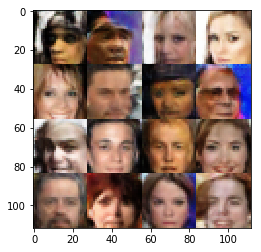

Epoch 9/10... Discriminator Loss: 1.2549... Generator Loss: 1.2263
Epoch 9/10... Discriminator Loss: 1.2124... Generator Loss: 0.8332
Epoch 9/10... Discriminator Loss: 1.0294... Generator Loss: 1.3555
Epoch 9/10... Discriminator Loss: 1.0828... Generator Loss: 1.0228
Epoch 9/10... Discriminator Loss: 1.2925... Generator Loss: 0.7988
Epoch 9/10... Discriminator Loss: 1.1410... Generator Loss: 0.9877
Epoch 9/10... Discriminator Loss: 1.2618... Generator Loss: 0.8275
Epoch 9/10... Discriminator Loss: 0.8730... Generator Loss: 1.5309
Epoch 9/10... Discriminator Loss: 1.1846... Generator Loss: 0.9517
Epoch 9/10... Discriminator Loss: 1.2682... Generator Loss: 0.6449
<class 'numpy.ndarray'>


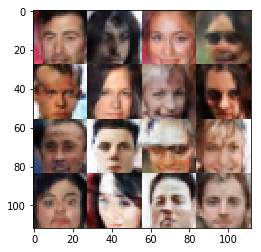

Epoch 9/10... Discriminator Loss: 1.0808... Generator Loss: 0.9057
Epoch 9/10... Discriminator Loss: 1.0289... Generator Loss: 1.1335
Epoch 9/10... Discriminator Loss: 1.1808... Generator Loss: 0.9225
Epoch 9/10... Discriminator Loss: 1.2688... Generator Loss: 0.6499
Epoch 9/10... Discriminator Loss: 1.0683... Generator Loss: 0.8347
Epoch 9/10... Discriminator Loss: 1.0351... Generator Loss: 1.3211
Epoch 9/10... Discriminator Loss: 1.3829... Generator Loss: 0.9384
Epoch 9/10... Discriminator Loss: 0.9900... Generator Loss: 1.5990
Epoch 9/10... Discriminator Loss: 1.0068... Generator Loss: 1.1264
Epoch 9/10... Discriminator Loss: 1.0996... Generator Loss: 1.4667
<class 'numpy.ndarray'>


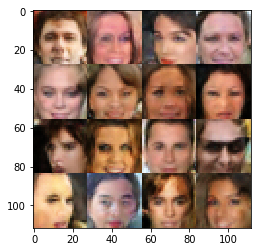

Epoch 9/10... Discriminator Loss: 0.9853... Generator Loss: 1.3859
Epoch 9/10... Discriminator Loss: 1.1958... Generator Loss: 1.1616
Epoch 9/10... Discriminator Loss: 1.1388... Generator Loss: 1.1144
Epoch 9/10... Discriminator Loss: 1.1040... Generator Loss: 0.9225
Epoch 9/10... Discriminator Loss: 1.0951... Generator Loss: 1.2896
Epoch 9/10... Discriminator Loss: 1.0169... Generator Loss: 1.1736
Epoch 9/10... Discriminator Loss: 0.9385... Generator Loss: 1.3860
Epoch 9/10... Discriminator Loss: 1.0252... Generator Loss: 1.1477
Epoch 9/10... Discriminator Loss: 1.2200... Generator Loss: 1.0769
Epoch 9/10... Discriminator Loss: 0.9705... Generator Loss: 1.4010
<class 'numpy.ndarray'>


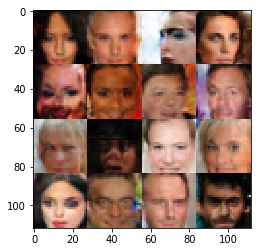

Epoch 9/10... Discriminator Loss: 1.0936... Generator Loss: 1.1047
Epoch 9/10... Discriminator Loss: 1.0408... Generator Loss: 1.2293
Epoch 9/10... Discriminator Loss: 1.1680... Generator Loss: 0.9232
Epoch 9/10... Discriminator Loss: 1.1604... Generator Loss: 0.8685
Epoch 9/10... Discriminator Loss: 1.1280... Generator Loss: 1.0139
Epoch 9/10... Discriminator Loss: 1.1996... Generator Loss: 1.1610
Epoch 9/10... Discriminator Loss: 1.0131... Generator Loss: 1.3272
Epoch 9/10... Discriminator Loss: 1.1351... Generator Loss: 1.0769
Epoch 9/10... Discriminator Loss: 1.1453... Generator Loss: 1.1093
Epoch 9/10... Discriminator Loss: 1.1385... Generator Loss: 1.1574
<class 'numpy.ndarray'>


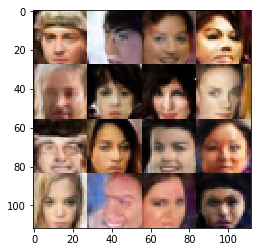

Epoch 9/10... Discriminator Loss: 1.1234... Generator Loss: 1.0455
Epoch 9/10... Discriminator Loss: 1.0358... Generator Loss: 1.0131
Epoch 9/10... Discriminator Loss: 1.3540... Generator Loss: 0.6606
Epoch 9/10... Discriminator Loss: 1.0583... Generator Loss: 1.0520
Epoch 9/10... Discriminator Loss: 1.0242... Generator Loss: 1.1576
Epoch 9/10... Discriminator Loss: 0.9390... Generator Loss: 1.0266
Epoch 9/10... Discriminator Loss: 1.0905... Generator Loss: 0.9709
Epoch 9/10... Discriminator Loss: 1.6498... Generator Loss: 0.4876
Epoch 9/10... Discriminator Loss: 1.0246... Generator Loss: 1.0877
Epoch 9/10... Discriminator Loss: 1.0134... Generator Loss: 1.1844
<class 'numpy.ndarray'>


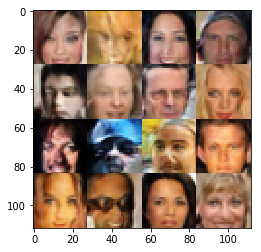

Epoch 9/10... Discriminator Loss: 1.0014... Generator Loss: 1.2756
Epoch 9/10... Discriminator Loss: 1.2702... Generator Loss: 0.9043
Epoch 9/10... Discriminator Loss: 1.2819... Generator Loss: 0.9972
Epoch 9/10... Discriminator Loss: 1.0458... Generator Loss: 1.4312
Epoch 9/10... Discriminator Loss: 1.0139... Generator Loss: 1.0926
Epoch 9/10... Discriminator Loss: 0.8466... Generator Loss: 1.6321
Epoch 9/10... Discriminator Loss: 1.1764... Generator Loss: 0.8537
Epoch 9/10... Discriminator Loss: 1.0723... Generator Loss: 1.2728
Epoch 9/10... Discriminator Loss: 1.0628... Generator Loss: 1.3872
Epoch 9/10... Discriminator Loss: 1.2584... Generator Loss: 1.0058
<class 'numpy.ndarray'>


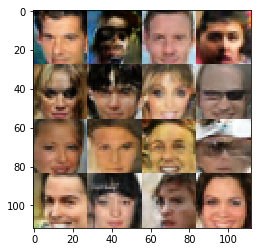

Epoch 9/10... Discriminator Loss: 1.2849... Generator Loss: 0.9771
Epoch 9/10... Discriminator Loss: 1.0830... Generator Loss: 1.1833
Epoch 9/10... Discriminator Loss: 1.1823... Generator Loss: 1.2204
Epoch 9/10... Discriminator Loss: 1.1167... Generator Loss: 0.7853
Epoch 9/10... Discriminator Loss: 1.0185... Generator Loss: 1.4752
Epoch 9/10... Discriminator Loss: 1.0329... Generator Loss: 1.1126
Epoch 9/10... Discriminator Loss: 1.0372... Generator Loss: 1.1505
Epoch 9/10... Discriminator Loss: 1.3134... Generator Loss: 0.8503
Epoch 9/10... Discriminator Loss: 0.9308... Generator Loss: 1.0989
Epoch 9/10... Discriminator Loss: 0.9158... Generator Loss: 1.5554
<class 'numpy.ndarray'>


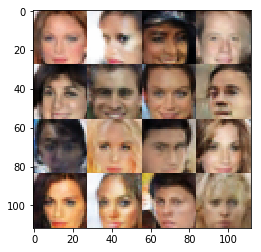

Epoch 9/10... Discriminator Loss: 1.4687... Generator Loss: 1.0309
Epoch 9/10... Discriminator Loss: 0.9765... Generator Loss: 1.4801
Epoch 9/10... Discriminator Loss: 1.2399... Generator Loss: 0.8157
Epoch 9/10... Discriminator Loss: 0.8257... Generator Loss: 1.7306
Epoch 9/10... Discriminator Loss: 1.2004... Generator Loss: 1.1621
Epoch 9/10... Discriminator Loss: 0.9318... Generator Loss: 2.1094
Epoch 9/10... Discriminator Loss: 1.0401... Generator Loss: 1.3544
Epoch 9/10... Discriminator Loss: 0.9020... Generator Loss: 1.3196
Epoch 9/10... Discriminator Loss: 1.1803... Generator Loss: 1.3196
Epoch 9/10... Discriminator Loss: 1.3281... Generator Loss: 0.9564
<class 'numpy.ndarray'>


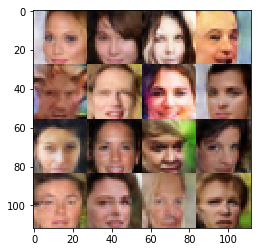

Epoch 9/10... Discriminator Loss: 0.8973... Generator Loss: 1.6893
Epoch 9/10... Discriminator Loss: 0.9304... Generator Loss: 1.3424
Epoch 9/10... Discriminator Loss: 0.9011... Generator Loss: 1.1211
Epoch 9/10... Discriminator Loss: 0.8555... Generator Loss: 1.8349
Epoch 9/10... Discriminator Loss: 1.1588... Generator Loss: 1.1802
Epoch 9/10... Discriminator Loss: 0.8975... Generator Loss: 1.6517
Epoch 9/10... Discriminator Loss: 0.8006... Generator Loss: 1.8572
Epoch 9/10... Discriminator Loss: 1.1777... Generator Loss: 0.8469
Epoch 9/10... Discriminator Loss: 0.9622... Generator Loss: 1.3341
Epoch 9/10... Discriminator Loss: 0.9646... Generator Loss: 1.2481
<class 'numpy.ndarray'>


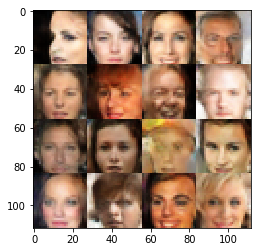

Epoch 9/10... Discriminator Loss: 1.0223... Generator Loss: 1.5918
Epoch 9/10... Discriminator Loss: 0.8895... Generator Loss: 1.2928
Epoch 9/10... Discriminator Loss: 0.9068... Generator Loss: 1.3101
Epoch 9/10... Discriminator Loss: 0.9932... Generator Loss: 1.9305
Epoch 9/10... Discriminator Loss: 1.2903... Generator Loss: 0.8484
Epoch 9/10... Discriminator Loss: 1.0254... Generator Loss: 0.7705
Epoch 9/10... Discriminator Loss: 1.1392... Generator Loss: 1.2782
Epoch 9/10... Discriminator Loss: 1.3452... Generator Loss: 0.5457
Epoch 9/10... Discriminator Loss: 1.1736... Generator Loss: 0.8439
Epoch 9/10... Discriminator Loss: 1.0888... Generator Loss: 1.1963
<class 'numpy.ndarray'>


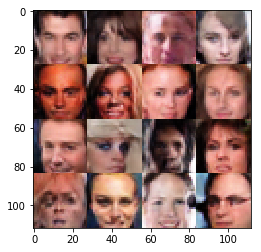

Epoch 9/10... Discriminator Loss: 1.1709... Generator Loss: 1.2115
Epoch 9/10... Discriminator Loss: 0.9107... Generator Loss: 1.4941
Epoch 9/10... Discriminator Loss: 0.9597... Generator Loss: 1.6473
Epoch 9/10... Discriminator Loss: 0.9988... Generator Loss: 1.2450
Epoch 9/10... Discriminator Loss: 1.0696... Generator Loss: 1.1066
Epoch 9/10... Discriminator Loss: 1.0403... Generator Loss: 1.1817
Epoch 9/10... Discriminator Loss: 1.2705... Generator Loss: 0.8107
Epoch 9/10... Discriminator Loss: 0.9820... Generator Loss: 0.9526
Epoch 9/10... Discriminator Loss: 0.9906... Generator Loss: 1.0543
Epoch 9/10... Discriminator Loss: 1.2131... Generator Loss: 0.8762
<class 'numpy.ndarray'>


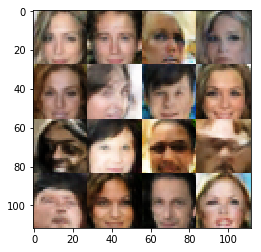

Epoch 9/10... Discriminator Loss: 1.2431... Generator Loss: 1.3248
Epoch 9/10... Discriminator Loss: 1.0645... Generator Loss: 1.2414
Epoch 9/10... Discriminator Loss: 1.1271... Generator Loss: 1.5350
Epoch 9/10... Discriminator Loss: 1.1500... Generator Loss: 1.0423
Epoch 9/10... Discriminator Loss: 1.4061... Generator Loss: 0.8215
Epoch 9/10... Discriminator Loss: 1.0443... Generator Loss: 1.6271
Epoch 9/10... Discriminator Loss: 0.9602... Generator Loss: 1.1210
Epoch 9/10... Discriminator Loss: 1.2075... Generator Loss: 0.8094
Epoch 9/10... Discriminator Loss: 1.4845... Generator Loss: 0.7602
Epoch 9/10... Discriminator Loss: 0.9918... Generator Loss: 1.0106
<class 'numpy.ndarray'>


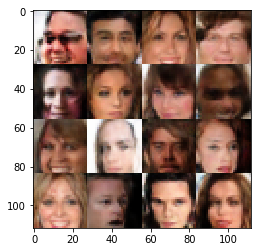

Epoch 9/10... Discriminator Loss: 0.9725... Generator Loss: 1.0768
Epoch 9/10... Discriminator Loss: 1.0297... Generator Loss: 1.0617
Epoch 9/10... Discriminator Loss: 0.9243... Generator Loss: 1.7244
Epoch 10/10... Discriminator Loss: 1.2102... Generator Loss: 1.0552
Epoch 10/10... Discriminator Loss: 0.8483... Generator Loss: 1.1273
Epoch 10/10... Discriminator Loss: 0.9558... Generator Loss: 1.1761
Epoch 10/10... Discriminator Loss: 1.0750... Generator Loss: 1.2631
Epoch 10/10... Discriminator Loss: 0.9435... Generator Loss: 1.3707
Epoch 10/10... Discriminator Loss: 0.9639... Generator Loss: 1.0100
Epoch 10/10... Discriminator Loss: 1.1363... Generator Loss: 1.0291
<class 'numpy.ndarray'>


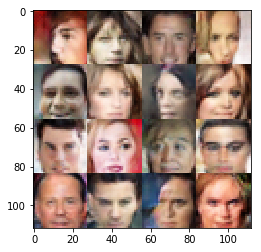

Epoch 10/10... Discriminator Loss: 1.1920... Generator Loss: 1.5735
Epoch 10/10... Discriminator Loss: 1.0844... Generator Loss: 1.1244
Epoch 10/10... Discriminator Loss: 0.9070... Generator Loss: 1.0855
Epoch 10/10... Discriminator Loss: 1.1110... Generator Loss: 1.1558
Epoch 10/10... Discriminator Loss: 0.9904... Generator Loss: 1.5064
Epoch 10/10... Discriminator Loss: 0.9557... Generator Loss: 1.7345
Epoch 10/10... Discriminator Loss: 0.8851... Generator Loss: 1.2520
Epoch 10/10... Discriminator Loss: 1.2786... Generator Loss: 1.2318
Epoch 10/10... Discriminator Loss: 1.3766... Generator Loss: 1.0737
Epoch 10/10... Discriminator Loss: 1.1033... Generator Loss: 1.4476
<class 'numpy.ndarray'>


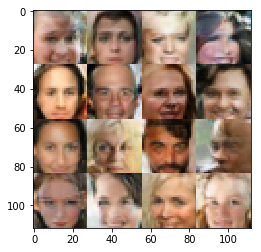

Epoch 10/10... Discriminator Loss: 0.8550... Generator Loss: 1.4243
Epoch 10/10... Discriminator Loss: 1.2521... Generator Loss: 0.9548
Epoch 10/10... Discriminator Loss: 1.1970... Generator Loss: 0.9373
Epoch 10/10... Discriminator Loss: 1.1596... Generator Loss: 1.0146
Epoch 10/10... Discriminator Loss: 0.9825... Generator Loss: 1.4327
Epoch 10/10... Discriminator Loss: 1.0761... Generator Loss: 0.9556
Epoch 10/10... Discriminator Loss: 1.1432... Generator Loss: 1.0288
Epoch 10/10... Discriminator Loss: 0.9210... Generator Loss: 1.1840
Epoch 10/10... Discriminator Loss: 1.0310... Generator Loss: 1.2316
Epoch 10/10... Discriminator Loss: 0.9614... Generator Loss: 1.3719
<class 'numpy.ndarray'>


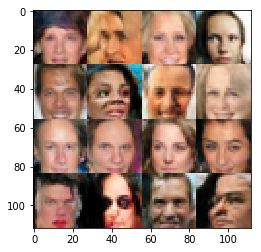

Epoch 10/10... Discriminator Loss: 1.0580... Generator Loss: 0.8477
Epoch 10/10... Discriminator Loss: 1.1942... Generator Loss: 1.0007
Epoch 10/10... Discriminator Loss: 0.8596... Generator Loss: 1.3196
Epoch 10/10... Discriminator Loss: 0.9817... Generator Loss: 1.0052
Epoch 10/10... Discriminator Loss: 0.9074... Generator Loss: 1.6252
Epoch 10/10... Discriminator Loss: 1.2777... Generator Loss: 0.8620
Epoch 10/10... Discriminator Loss: 0.9446... Generator Loss: 1.6556
Epoch 10/10... Discriminator Loss: 1.4550... Generator Loss: 0.5609
Epoch 10/10... Discriminator Loss: 1.3023... Generator Loss: 0.5958
Epoch 10/10... Discriminator Loss: 0.9346... Generator Loss: 1.2668
<class 'numpy.ndarray'>


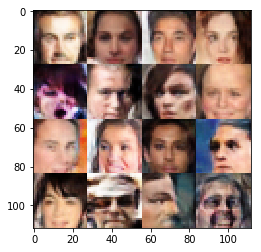

Epoch 10/10... Discriminator Loss: 1.0113... Generator Loss: 1.5684
Epoch 10/10... Discriminator Loss: 1.0188... Generator Loss: 1.6443
Epoch 10/10... Discriminator Loss: 1.0662... Generator Loss: 0.9983
Epoch 10/10... Discriminator Loss: 0.9931... Generator Loss: 1.1865
Epoch 10/10... Discriminator Loss: 0.9035... Generator Loss: 1.5053
Epoch 10/10... Discriminator Loss: 1.0603... Generator Loss: 0.8969
Epoch 10/10... Discriminator Loss: 1.0367... Generator Loss: 1.1020
Epoch 10/10... Discriminator Loss: 0.9142... Generator Loss: 0.8944
Epoch 10/10... Discriminator Loss: 0.8327... Generator Loss: 2.0858
Epoch 10/10... Discriminator Loss: 1.0760... Generator Loss: 1.8626
<class 'numpy.ndarray'>


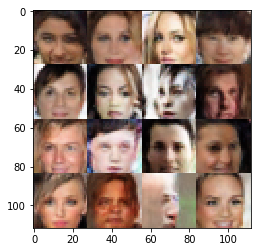

Epoch 10/10... Discriminator Loss: 1.0733... Generator Loss: 1.2495
Epoch 10/10... Discriminator Loss: 1.0501... Generator Loss: 1.7245
Epoch 10/10... Discriminator Loss: 1.0465... Generator Loss: 1.2248
Epoch 10/10... Discriminator Loss: 1.1549... Generator Loss: 0.9310
Epoch 10/10... Discriminator Loss: 0.8785... Generator Loss: 1.5208
Epoch 10/10... Discriminator Loss: 1.1463... Generator Loss: 1.1495
Epoch 10/10... Discriminator Loss: 0.8216... Generator Loss: 1.5000
Epoch 10/10... Discriminator Loss: 0.8891... Generator Loss: 1.5144
Epoch 10/10... Discriminator Loss: 1.1162... Generator Loss: 0.8255
Epoch 10/10... Discriminator Loss: 1.0793... Generator Loss: 1.0667
<class 'numpy.ndarray'>


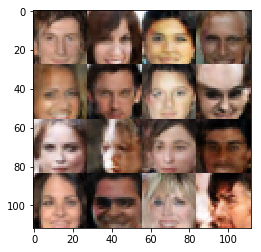

Epoch 10/10... Discriminator Loss: 0.8851... Generator Loss: 1.0767
Epoch 10/10... Discriminator Loss: 1.0410... Generator Loss: 1.1702
Epoch 10/10... Discriminator Loss: 0.9977... Generator Loss: 1.4619
Epoch 10/10... Discriminator Loss: 1.1216... Generator Loss: 0.9376
Epoch 10/10... Discriminator Loss: 2.0345... Generator Loss: 0.3067
Epoch 10/10... Discriminator Loss: 0.9846... Generator Loss: 1.7729
Epoch 10/10... Discriminator Loss: 1.0065... Generator Loss: 1.0156
Epoch 10/10... Discriminator Loss: 0.9936... Generator Loss: 1.1714
Epoch 10/10... Discriminator Loss: 1.1484... Generator Loss: 1.1637
Epoch 10/10... Discriminator Loss: 0.9971... Generator Loss: 1.1464
<class 'numpy.ndarray'>


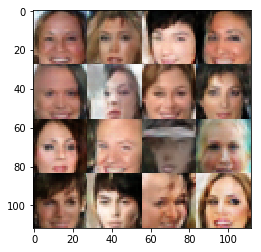

Epoch 10/10... Discriminator Loss: 1.1289... Generator Loss: 0.6776
Epoch 10/10... Discriminator Loss: 0.8532... Generator Loss: 1.5001
Epoch 10/10... Discriminator Loss: 0.9963... Generator Loss: 1.1362
Epoch 10/10... Discriminator Loss: 0.9649... Generator Loss: 2.0506
Epoch 10/10... Discriminator Loss: 1.0892... Generator Loss: 1.0227
Epoch 10/10... Discriminator Loss: 0.9873... Generator Loss: 1.2664
Epoch 10/10... Discriminator Loss: 1.1712... Generator Loss: 1.4138
Epoch 10/10... Discriminator Loss: 0.9110... Generator Loss: 1.2703
Epoch 10/10... Discriminator Loss: 1.2209... Generator Loss: 1.4870
Epoch 10/10... Discriminator Loss: 0.7685... Generator Loss: 1.9774
<class 'numpy.ndarray'>


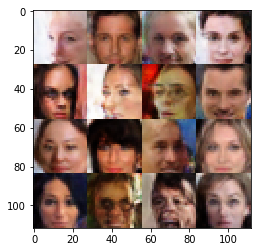

Epoch 10/10... Discriminator Loss: 1.0810... Generator Loss: 1.0585
Epoch 10/10... Discriminator Loss: 1.0516... Generator Loss: 1.1725
Epoch 10/10... Discriminator Loss: 0.9599... Generator Loss: 0.9076
Epoch 10/10... Discriminator Loss: 0.8329... Generator Loss: 1.4197
Epoch 10/10... Discriminator Loss: 1.0094... Generator Loss: 1.1688
Epoch 10/10... Discriminator Loss: 1.0298... Generator Loss: 1.0031
Epoch 10/10... Discriminator Loss: 1.0821... Generator Loss: 1.0194
Epoch 10/10... Discriminator Loss: 1.0989... Generator Loss: 0.9983
Epoch 10/10... Discriminator Loss: 0.9631... Generator Loss: 1.3584
Epoch 10/10... Discriminator Loss: 1.0319... Generator Loss: 2.2761
<class 'numpy.ndarray'>


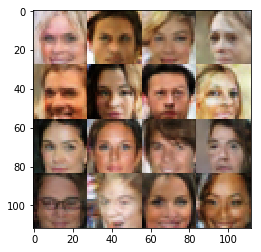

Epoch 10/10... Discriminator Loss: 0.7627... Generator Loss: 1.8137
Epoch 10/10... Discriminator Loss: 1.2500... Generator Loss: 1.2000
Epoch 10/10... Discriminator Loss: 1.0929... Generator Loss: 1.0822
Epoch 10/10... Discriminator Loss: 1.1218... Generator Loss: 1.4762
Epoch 10/10... Discriminator Loss: 0.9479... Generator Loss: 1.5776
Epoch 10/10... Discriminator Loss: 0.8282... Generator Loss: 1.4703
Epoch 10/10... Discriminator Loss: 0.7864... Generator Loss: 1.6156
Epoch 10/10... Discriminator Loss: 0.9972... Generator Loss: 1.2300
Epoch 10/10... Discriminator Loss: 0.9953... Generator Loss: 1.1651
Epoch 10/10... Discriminator Loss: 0.9738... Generator Loss: 1.4117
<class 'numpy.ndarray'>


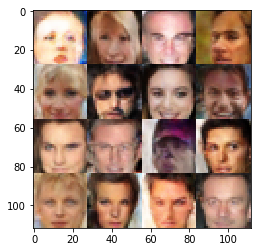

Epoch 10/10... Discriminator Loss: 1.4750... Generator Loss: 0.8292
Epoch 10/10... Discriminator Loss: 0.9581... Generator Loss: 1.7540
Epoch 10/10... Discriminator Loss: 0.9112... Generator Loss: 1.4884
Epoch 10/10... Discriminator Loss: 0.8933... Generator Loss: 1.2443
Epoch 10/10... Discriminator Loss: 1.2010... Generator Loss: 1.7942
Epoch 10/10... Discriminator Loss: 1.0288... Generator Loss: 1.2976
Epoch 10/10... Discriminator Loss: 1.0512... Generator Loss: 0.9715
Epoch 10/10... Discriminator Loss: 1.2287... Generator Loss: 0.5897
Epoch 10/10... Discriminator Loss: 0.9635... Generator Loss: 1.5698
Epoch 10/10... Discriminator Loss: 0.7604... Generator Loss: 1.6937
<class 'numpy.ndarray'>


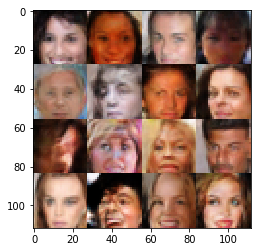

Epoch 10/10... Discriminator Loss: 0.8127... Generator Loss: 1.5662
Epoch 10/10... Discriminator Loss: 0.8733... Generator Loss: 1.5947
Epoch 10/10... Discriminator Loss: 1.1694... Generator Loss: 1.3940
Epoch 10/10... Discriminator Loss: 1.0223... Generator Loss: 1.2141
Epoch 10/10... Discriminator Loss: 0.8457... Generator Loss: 1.5093
Epoch 10/10... Discriminator Loss: 0.9164... Generator Loss: 1.5095
Epoch 10/10... Discriminator Loss: 0.8717... Generator Loss: 1.5613
Epoch 10/10... Discriminator Loss: 1.1586... Generator Loss: 1.0495
Epoch 10/10... Discriminator Loss: 1.0225... Generator Loss: 1.4811
Epoch 10/10... Discriminator Loss: 0.9515... Generator Loss: 1.4536
<class 'numpy.ndarray'>


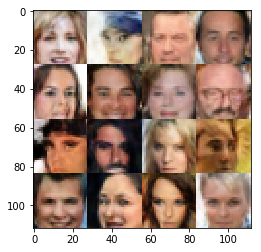

Epoch 10/10... Discriminator Loss: 0.9117... Generator Loss: 1.7729
Epoch 10/10... Discriminator Loss: 0.8457... Generator Loss: 1.8084
Epoch 10/10... Discriminator Loss: 0.9168... Generator Loss: 1.0172
Epoch 10/10... Discriminator Loss: 0.8243... Generator Loss: 1.3660
Epoch 10/10... Discriminator Loss: 1.4713... Generator Loss: 1.0710
Epoch 10/10... Discriminator Loss: 1.3034... Generator Loss: 0.8863
Epoch 10/10... Discriminator Loss: 0.9412... Generator Loss: 1.1503
Epoch 10/10... Discriminator Loss: 1.0718... Generator Loss: 1.3020
Epoch 10/10... Discriminator Loss: 0.9383... Generator Loss: 1.6359
Epoch 10/10... Discriminator Loss: 0.9533... Generator Loss: 0.9472
<class 'numpy.ndarray'>


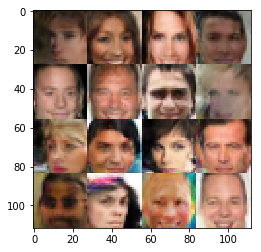

Epoch 10/10... Discriminator Loss: 1.2716... Generator Loss: 1.2516
Epoch 10/10... Discriminator Loss: 1.1232... Generator Loss: 1.6070
Epoch 10/10... Discriminator Loss: 2.2347... Generator Loss: 0.2737
Epoch 10/10... Discriminator Loss: 0.9697... Generator Loss: 1.1111
Epoch 10/10... Discriminator Loss: 0.9546... Generator Loss: 1.1708
Epoch 10/10... Discriminator Loss: 1.0332... Generator Loss: 0.7647
Epoch 10/10... Discriminator Loss: 0.8592... Generator Loss: 1.6901
Epoch 10/10... Discriminator Loss: 1.3122... Generator Loss: 0.7499
Epoch 10/10... Discriminator Loss: 1.0256... Generator Loss: 1.4209
Epoch 10/10... Discriminator Loss: 0.8515... Generator Loss: 1.5851
<class 'numpy.ndarray'>


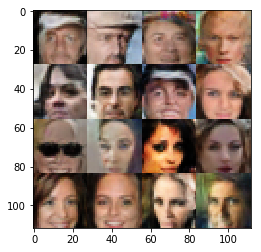

Epoch 10/10... Discriminator Loss: 0.6895... Generator Loss: 1.6996
Epoch 10/10... Discriminator Loss: 0.9258... Generator Loss: 1.2299
Epoch 10/10... Discriminator Loss: 1.3402... Generator Loss: 0.9870
Epoch 10/10... Discriminator Loss: 1.0530... Generator Loss: 1.6272
Epoch 10/10... Discriminator Loss: 0.8187... Generator Loss: 2.0650
Epoch 10/10... Discriminator Loss: 0.9414... Generator Loss: 1.9590
Epoch 10/10... Discriminator Loss: 0.5911... Generator Loss: 2.2086
Epoch 10/10... Discriminator Loss: 0.8706... Generator Loss: 1.5403
Epoch 10/10... Discriminator Loss: 0.8660... Generator Loss: 1.6213
Epoch 10/10... Discriminator Loss: 1.0261... Generator Loss: 0.9904
<class 'numpy.ndarray'>


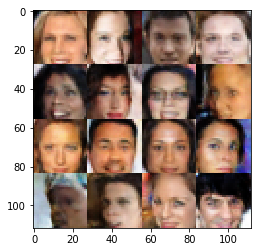

Epoch 10/10... Discriminator Loss: 0.7648... Generator Loss: 1.4199
Epoch 10/10... Discriminator Loss: 0.7567... Generator Loss: 1.5781
Epoch 10/10... Discriminator Loss: 0.9678... Generator Loss: 1.5112
Epoch 10/10... Discriminator Loss: 0.9310... Generator Loss: 1.7622
Epoch 10/10... Discriminator Loss: 1.1018... Generator Loss: 1.0419
Epoch 10/10... Discriminator Loss: 0.9021... Generator Loss: 0.8821
Epoch 10/10... Discriminator Loss: 0.8045... Generator Loss: 1.4565
Epoch 10/10... Discriminator Loss: 1.5356... Generator Loss: 0.3977
Epoch 10/10... Discriminator Loss: 0.9469... Generator Loss: 2.1948
Epoch 10/10... Discriminator Loss: 0.9966... Generator Loss: 1.2981
<class 'numpy.ndarray'>


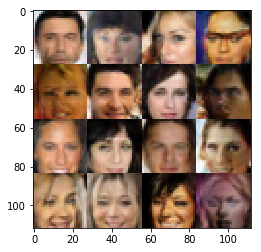

Epoch 10/10... Discriminator Loss: 1.1807... Generator Loss: 1.3249
Epoch 10/10... Discriminator Loss: 1.0129... Generator Loss: 1.1945


In [20]:
batch_size = 128
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.